In [1]:
import sys
import json
import os
import pandas as pd #'1.0.4'
import scipy as sc
import numpy as np
import re
import shutil
import Json
from matplotlib import pyplot as plt
import seaborn as sn

In [2]:
d = pd.read_csv("../Data/Final_Data.csv")

/home/xiang/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3049: DtypeWarning: Columns (14,16) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [3]:
#remve empty images
d = d[(d["SourceFile"] != "11_HH_26_4_18/DCIM/100_BTCF/IMG_1109.JPG")\
  & (d["SourceFile"] != "72_HH_1_6_18/100_BTCF/IMG_0009.JPG")]
samplelist = d["SourceFile"]
len(samplelist)

418743

In [4]:
cor = pd.read_csv("../Results/cor.csv")
#d[d.SourceFile.isin(cor.SourceFile)]


In [5]:
temp = Json.Json("../Data/p1/", 0.5 , 1)


In [6]:
#temp.skeleton['23_HH_23_4_18_DCIM/100_BTCF/IMG_1601.JPG']

In [6]:
temp.CountCsv()#

/home/xiang/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3220: DtypeWarning: Columns (14,16) have mixed types.Specify dtype option on import or set low_memory=False.
  if (yield from self.run_code(code, result)):


0

In [7]:
dic = {k:v for (k, v) in temp.skeleton.items()}

In [9]:
###### get skeleton data in the first image of every sequence
# def getfirst(self, interval) # manually define the interval of sequence
# if interval = 1  1 minute

In [8]:
len(temp.skeleton)

133568

In [9]:
len(temp.fullske)

65350

In [11]:
#a = temp.skeleton.keys()
#6_HH_1_5_18_DCIM/100RECNX/IMG_6303.JPG
#112_11_20_7_18_BTCF/@eaDir/IMG_0002.JPG/SYNOFILE_THUMB_M.JPG
#"112_11_20_7_18_BTCF/@eaDir/IMG_0002.JPG/SYNOFILE_THUMB_M.JPG" in a

In [10]:
import Kp
values_view = temp.skeleton.values()

value_iterator = iter(values_view)

p = next(value_iterator)[0]


In [11]:
k = Kp.Kp(p)
#[[p[i], p[i+1]] for i in np.array(range(0,45,3))]


In [12]:
k.fv

[-5.157472205043067,
 -3.4607797026755964,
 36.29638960031281,
 3.6533280136644066,
 -98.22921622541283,
 -8.583001264395836,
 117.15222665531317,
 16.755536651133298,
 -51.888836093292205,
 -1.7567453004186975,
 8.130235729569739,
 -1.2327787956843772,
 -0.04346458843121162,
 0.010156461170741489]

In [13]:
[row[13] for row in k.spec]

[-4.144994407654427,
 0.08527632814724682,
 -0.11392021753706304,
 -1.8364889137923965,
 -0.3066105661901849,
 -1.978079212558962,
 1.2064049601887337,
 1.1223156002231311,
 1.2942296024762114,
 1.1743338311023588,
 -1.547372864640094,
 -0.1941623902355405,
 0.647372537518264,
 -0.5657764920903453]

In [14]:
dq = pd.read_csv("../Data/Seq_first_ske.csv")
#dq["SourceFile"]

In [83]:
dq

,Folder,ImageId,SourceFile,Count,CreateDate,h,placeID
0,115_11_20_7_18_BTCF/,3832,115_11_20_7_18_BTCF/IMG_3832.JPG,1,2018:06:23 16:26:02,16.0,115
1,96_HH_15_06_18/100RECNX/,6531,96_HH_15_06_18/100RECNX/IMG_6531.JPG,3,2018:06:10 18:35:46,18.0,96
2,149_HH_05_06_18/DCIM/100_BTCF/,4348,149_HH_05_06_18/DCIM/100_BTCF/IMG_4348.JPG,1,2018:05:20 17:26:24,17.0,149
3,46_HH_26_4_18/DCIM/100_BTCF/,1603,46_HH_26_4_18/DCIM/100_BTCF/IMG_1603.JPG,1,2017:04:22 16:00:42,16.0,46
4,142_HH_16_5_18_onsdcard/100RECNX/,155,142_HH_16_5_18_onsdcard/100RECNX/IMG_0155.JPG,1,2018:05:14 10:18:26,10.0,142
...,...,...,...,...,...,...,...
14229,142_HH_16_5_18_onsdcard/100RECNX/,485,142_HH_16_5_18_onsdcard/100RECNX/IMG_0485.JPG,1,2018:05:14 11:26:18,11.0,142
14230,5_HH_23_4_18_DCIM/100RECNX/,131,5_HH_23_4_18_DCIM/100RECNX/IMG_0131.JPG,1,2018:04:18 12:02:40,12.0,5
14231,17_HH_26_4_18/DCIM/100RECNX/,2611,17_HH_26_4_18/DCIM/100RECNX/IMG_2611.JPG,1,2018:04:19 18:12:42,18.0,17
14232,35_HH_1_6_18/100_BTCF/,3683,35_HH_1_6_18/100_BTCF/IMG_3683.JPG,1,2018:05:19 18:56:13,18.0,35


In [15]:
"60_HH_2_5_18_BTCF/IMG_1015.JPG" in list(dq["SourceFile"])

True

In [16]:
dq.loc[dq["SourceFile"] == "60_HH_2_5_18_BTCF/IMG_1015.JPG",]

,Folder,ImageId,SourceFile,Count,CreateDate,h,placeID
5,60_HH_2_5_18_BTCF/,1015,60_HH_2_5_18_BTCF/IMG_1015.JPG,1,2018:04:25 13:51:04,13.0,60


In [17]:
len(dq)

14234

In [18]:
l1 = list(dq["SourceFile"])
temp_d = pd.DataFrame(columns=["V1","V2", "V3", "V4", "V5", "V6","V7", "V8", "V9", "V10","SourceFile"])
for (k, v) in temp.skeleton.items():
    if k in l1:#filename
        for p in v:#for each skeleton
            try:
                fv = Kp.Kp(p).fv#get feature vector
                new_row = {"V1":fv[0], "V2":fv[1],"V3":fv[2],\
                           "V4":fv[3],"V5":fv[4], "V6":fv[5],\
                           "V7":fv[6], "V8":fv[7],"V9":fv[8], "V10":fv[9], "SourceFile" : k}
                temp_d = temp_d.append(new_row, ignore_index=True)
            except:
                print(k)

/home/xiang/Documents/Project/Code/Kp.py:50: RuntimeWarning: invalid value encountered in double_scalars
  a = np.arccos(np.clip(v1.dot(v2) / (np.linalg.norm(v1) * np.linalg.norm(v2)),-1.0,1.0))


[[nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]]
96_HH_15_06_18/100RECNX/IMG_5871.JPG
[[ 11.21678382  -4.19581296   0.           0.          -5.89222893
    0.           0.          -1.12874192   0.           0.
    0.    

[[         nan -23.14069229          nan          nan -14.91768656
  -23.07900724          nan  -2.95218151 -21.28775249          nan
           nan   0.           0.           0.        ]
 [-23.14069229          nan          nan          nan   0.
    0.                  nan   0.           0.                  nan
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan   0.
           nan          nan   0.                  nan          nan
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan   0.
           nan          nan   0.                  nan          nan
           nan   0.           0.           0.        ]
 [-14.91768656   0.           0.           0.          16.47305795
   -1.55537139   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.07900724   0.                  nan          nan  -1.55537139
           nan      

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[        nan         nan         nan         nan         nan         nan
          nan         nan  0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan         nan         nan         nan         nan
          nan         nan  0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan         nan         nan         nan         nan
          nan         nan  0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan         nan         nan         nan         nan
          nan         nan  0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan         nan         nan         nan         nan
          nan         nan  0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan         nan         nan         nan         nan
          nan         nan  0.          0.          0.          0.
   0.          0.        

[[10.01780134 -4.1455235   0.          0.         -4.65845428  0.
   0.         -1.21382355  0.          0.          0.          0.
   0.          0.        ]
 [-4.1455235   7.32411766 -3.17859416  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -3.17859416  8.48812932 -5.30953516  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -5.30953516  5.30953516  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-4.65845428  0.          0.          0.          6.61593135 -1.95747707
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -1.95747707  4.10370762
  -2.14623055  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[        nan         nan         nan         nan         nan         nan
          nan         nan  0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan         nan         nan         nan         nan
          nan         nan  0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan         nan         nan         nan         nan
          nan         nan  0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan         nan         nan         nan         nan
          nan         nan  0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan         nan         nan         nan         nan
          nan         nan  0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan         nan         nan         nan         nan
          nan         nan  0.          0.          0.          0.
   0.          0.        

[[ 12.35018604  -7.74578573   0.           0.          -2.42028968
    0.           0.          -2.18411063   0.           0.
    0.           0.           0.           0.        ]
 [ -7.74578573   9.7879964   -2.04221067   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.04221067  23.46854678 -21.42633611   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -21.42633611          nan   0.
    0.                  nan   0.           0.           0.
           nan   0.           0.                  nan]
 [ -2.42028968   0.           0.           0.           5.34724655
   -2.92695688   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.92695688
           nan          nan   0.           0.       

[[         nan  -4.52207067   0.           0.          -6.13681867
    0.         -22.28180778 -23.14069263          nan          nan
           nan          nan          nan          nan]
 [ -4.52207067   8.6767121   -4.15464144   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.15464144  13.32376616  -9.16912472   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -9.16912472   9.16912472   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -6.13681867   0.           0.           0.          12.36425894
   -6.22744027   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -6.22744027
   28.18500356 -21.95756329   0.           0

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 17.82597278 -12.73857324   0.           0.          -3.96438982
    0.           0.          -1.12300971   0.           0.
    0.           0.           0.           0.        ]
 [-12.73857324  23.11189016 -10.37331692   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.         -10.37331692  11.38531294  -1.01199602   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.01199602   1.01199602   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -3.96438982   0.           0.           0.          15.93769049
  -11.97330067   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -11.97330067
           nan          nan   0.           0.       

[[ 22.16380749 -17.84472633   0.           0.          -2.31644423
    0.           0.          -2.00263693   0.           0.
    0.           0.           0.           0.        ]
 [-17.84472633  19.00205148  -1.15732515   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.15732515          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -2.31644423   0.           0.           0.           7.11897081
   -4.80252658   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.80252658
    5.8085821   -1.00605553   0.           0.       

[[ 13.16314278  -6.07778296   0.           0.          -1.00757686
    0.           0.          -6.07778296   0.           0.
    0.           0.           0.           0.        ]
 [ -6.07778296          nan          nan          nan   0.
    0.           0.           0.                  nan          nan
           nan          nan          nan          nan]
 [  0.                  nan          nan          nan   0.
    0.           0.                  nan          nan          nan
           nan          nan          nan          nan]
 [  0.                  nan          nan          nan   0.
    0.           0.                  nan          nan          nan
           nan          nan          nan          nan]
 [ -1.00757686   0.           0.           0.           2.3653493
   -1.35777244   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.35777244
   17.85392964 -16.4961572   

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[         nan -21.55829431   0.                  nan          nan
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [-21.55829431          nan -23.14069263          nan          nan
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [  0.         -23.14069263          nan          nan          nan
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [         nan          nan          nan          nan          nan
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [         nan          nan          nan          nan          nan
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [         nan          nan          nan          nan  

[[         nan  -3.89571503   0.           0.          -6.67623889
    0.           0.          -1.22852821   0.         -23.05635646
           nan   0.         -22.25501391          nan]
 [ -3.89571503   8.08930111  -4.19358608   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.19358608   5.50651267  -1.31292658   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.31292658   1.31292658   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -6.67623889   0.           0.           0.          10.21149831
   -3.53525943   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.53525943
    4.93721998  -1.40196055   0.           0

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 12.74340666  -6.91220285   0.           0.          -4.19321213
    0.           0.          -1.63799169   0.           0.
    0.           0.           0.           0.        ]
 [ -6.91220285  13.76882963  -6.85662679   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -6.85662679   9.39722757  -2.54060078   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.54060078   2.54060078   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -4.19321213   0.           0.           0.          10.9822985
   -6.78908637   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -6.78908637
    8.34844659  -1.55936022   0.           0.        

[[ 15.38947833 -10.86739378   0.           0.          -1.75241993
    0.           0.          -2.76966462   0.           0.
    0.           0.           0.           0.        ]
 [-10.86739378  14.07655522  -3.20916144   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.20916144  10.58727173  -7.37811029   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -7.37811029          nan   0.
    0.                  nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.75241993   0.           0.           0.          15.06337934
  -13.31095941   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -13.31095941
           nan          nan   0.           0.       

[[ 19.74090619 -13.37346427   0.           0.          -3.72384579
    0.           0.          -2.64359612   0.           0.
    0.           0.           0.           0.        ]
 [-13.37346427  14.50877933  -1.13531505   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.13531505          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -3.72384579   0.           0.           0.          10.53601844
   -6.81217265   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -6.81217265
    8.43292926  -1.62075661   0.           0.       

[[         nan -21.20594423   0.           0.          -1.00988893
  -23.13615452          nan  -4.71588837   0.           0.
    0.           0.           0.           0.        ]
 [-21.20594423  24.47958941  -3.27364517   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.27364517  11.33489544  -8.06125027   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -8.06125027   8.06125027   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.00988893   0.           0.           0.          23.92848027
  -22.91859134   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.13615452   0.           0.           0.         -22.91859134
           nan          nan   0.           0.       

[[        nan         nan  0.          0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan -3.98695268  0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [ 0.         -3.98695268  6.78787945 -2.80092678  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -2.80092678  2.80092678  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan  0.          0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan  0.          0.                 nan         nan
          nan         nan         nan         nan         nan         nan
         

[[10.85399175 -4.66859024  0.          0.         -5.06135533  0.
   0.         -1.12404618  0.          0.          0.          0.
   0.          0.        ]
 [-4.66859024  9.27459412 -4.60600387  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -4.60600387  9.0405208  -4.43451693  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -4.43451693  4.43451693  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-5.06135533  0.          0.          0.          9.32877666 -4.26742134
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -4.26742134  6.87185419
  -2.60443286  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[ 7.07229645 -4.82972619  0.          0.         -1.0205191   0.
   0.         -1.22205116  0.          0.          0.          0.
   0.          0.        ]
 [-4.82972619  8.5409612  -3.711235    0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -3.711235    6.74246516 -3.03123015  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -3.03123015  3.03123015  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-1.0205191   0.          0.          0.          7.80914076 -6.78862167
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -6.78862167         nan
          nan  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[         nan  -2.52701311   0.           0.         -13.97746072
    0.         -23.03305385  -1.89000596   0.           0.
    0.           0.         -21.38515655          nan]
 [ -2.52701311   6.37762541  -3.8506123    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.8506123    7.30523435  -3.45462205   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -3.45462205   3.45462205   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-13.97746072   0.           0.           0.          28.48130214
  -14.50384141   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -14.50384141
   36.70096812 -22.1971267    0.           0.       

[[ 11.22319061  -6.11999055   0.           0.          -3.77674137
    0.           0.          -1.32645869   0.           0.
    0.           0.           0.           0.        ]
 [ -6.11999055   9.60797396  -3.4879834    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.4879834   10.8258363   -7.3378529    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -7.3378529           nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.           0.        ]
 [ -3.77674137   0.           0.           0.           6.67942198
   -2.90268061   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.90268061
   13.36371686 -10.46103625   0.           0.       

[[ 10.99877777  -6.32955374   0.           0.          -3.65434052
    0.           0.          -1.01488351   0.           0.
    0.           0.           0.           0.        ]
 [ -6.32955374  10.45798172  -4.12842798   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.12842798   5.58717518  -1.4587472    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.4587472    1.4587472    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -3.65434052   0.           0.           0.           7.73221344
   -4.07787292   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.07787292
   16.43010169 -12.35222877   0.           0.       

[[ 14.62193622 -10.12424189   0.           0.          -2.23350151
    0.           0.          -2.26419282   0.           0.
    0.           0.           0.           0.        ]
 [-10.12424189  11.85854643  -1.73430455   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.73430455          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -2.23350151   0.           0.           0.           5.53212586
   -3.29862434   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.29862434
    4.34111256  -1.04248822   0.           0.       

[[ 22.82716005 -17.63689796   0.           0.          -3.41005134
    0.           0.          -1.78021075   0.           0.
    0.           0.           0.           0.        ]
 [-17.63689796          nan          nan          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.                  nan]
 [  0.                  nan          nan          nan   0.
    0.           0.           0.           0.                  nan
           nan   0.                  nan          nan]
 [  0.                  nan          nan          nan   0.
    0.           0.           0.           0.                  nan
           nan   0.                  nan          nan]
 [ -3.41005134   0.           0.           0.           8.6413458
   -5.23129446   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -5.23129446
    6.35586237  -1.12456791   0.     

[[ 14.56990732  -3.14464602   0.           0.          -7.28831329
    0.           0.          -4.13694801   0.           0.
    0.           0.           0.           0.        ]
 [ -3.14464602   5.1749746   -2.03032858   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.03032858   4.70428129  -2.67395272   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.67395272   2.67395272   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -7.28831329   0.           0.           0.          25.21375339
  -17.9254401    0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -17.9254401
           nan          nan   0.                  nan

[[ 24.42550996 -17.98722772   0.           0.          -2.70900777
    0.           0.          -3.72927447   0.           0.
    0.           0.           0.           0.        ]
 [-17.98722772  20.99128323  -3.00405551   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.00405551   4.31376212  -1.30970661   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.30970661   1.30970661   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -2.70900777   0.           0.           0.           4.07522001
   -1.36621224   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.36621224
    2.93655862  -1.57034638   0.           0.       

[[         nan -11.70648171   0.           0.         -23.14069263
           nan          nan -23.14069263          nan          nan
           nan          nan          nan          nan]
 [-11.70648171  21.9705571  -10.2640754    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.         -10.2640754   11.26496595  -1.00089056   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.00089056   1.00089056   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.14069263   0.           0.           0.                  nan
           nan          nan   0.                  nan          nan
           nan          nan          nan          nan]
 [         nan   0.           0.           0.                  nan
           nan          nan         

[[10.98420863 -3.92536824  0.          0.         -5.90776821  0.
   0.         -1.15107218  0.          0.          0.          0.
   0.          0.        ]
 [-3.92536824  8.21382341 -4.28845517  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -4.28845517         nan         nan  0.          0.
   0.          0.          0.          0.          0.          0.
   0.                 nan]
 [ 0.          0.                 nan         nan  0.          0.
   0.          0.          0.          0.          0.          0.
          nan         nan]
 [-5.90776821  0.          0.          0.         10.69894241 -4.7911742
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -4.7911742   5.85284295
  -1.06166876  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.  

[[ 17.58791595  -2.0597814    0.           0.         -12.61891825
    0.           0.          -2.90921629   0.           0.
    0.           0.           0.           0.        ]
 [ -2.0597814    4.95199005  -2.89220864   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.89220864   6.52497047  -3.63276182   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -3.63276182   3.63276182   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-12.61891825   0.           0.           0.          16.71119113
   -4.09227288   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.09227288
    5.87835568  -1.7860828    0.           0.       

[[ 13.05240363  -4.66973125   0.           0.          -6.79557888
    0.           0.          -1.5870935    0.           0.
    0.           0.           0.           0.        ]
 [ -4.66973125  14.09063863  -9.42090738   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -9.42090738          nan          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.                  nan]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.                  nan
           nan   0.                  nan          nan]
 [ -6.79557888   0.           0.           0.          10.21905502
   -3.42347615   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.42347615
   23.41083065 -19.98735451   0.           0

[[ 14.86837179  -1.92985607   0.           0.         -10.80285521
    0.           0.          -2.13566052   0.           0.
    0.           0.           0.           0.        ]
 [ -1.92985607   5.89671649  -3.96686042   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.96686042   5.05608844  -1.08922802   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.08922802   1.08922802   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-10.80285521   0.           0.           0.          17.71097137
   -6.90811616   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -6.90811616
    8.10381443  -1.19569827   0.           0.       

    0.           0.          -1.1804011    1.1804011 ]]
6_HH_1_5_18_DCIM/100RECNX/IMG_5581.JPG
[[         nan  -1.2795856  -22.89930678          nan -19.69164113
    0.           0.          -3.54367658   0.           0.
    0.           0.           0.           0.        ]
 [ -1.2795856   19.5547389  -18.2751533    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.89930678 -18.2751533           nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan   0.                  nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-19.69164113   0.           0.           0.          21.7285884
   -2.03694728   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.      

[[         nan -23.14069215          nan          nan  -1.03252455
  -23.13213288          nan  -1.03133031 -22.90616313          nan
           nan   0.           0.           0.        ]
 [-23.14069215          nan          nan          nan   0.
    0.                  nan   0.           0.                  nan
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan   0.
           nan          nan   0.                  nan          nan
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan   0.
           nan          nan   0.                  nan          nan
           nan   0.           0.           0.        ]
 [ -1.03252455   0.           0.           0.          23.45257803
  -22.42005348   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.13213288   0.                  nan          nan -22.42005348
           nan      

[[ 26.63136164 -23.13620161   0.           0.          -1.46237844
    0.           0.          -2.03278158   0.           0.
    0.           0.           0.           0.        ]
 [-23.13620161  26.34452443  -3.20832282   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.20832282   4.21241439  -1.00409157   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.00409157   1.00409157   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.46237844   0.           0.           0.           2.96577053
   -1.50339209   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.50339209
           nan          nan   0.           0.       

[[ 26.55071172  -1.10296765   0.           0.         -21.12983465
    0.           0.          -4.31790942   0.           0.
    0.           0.           0.           0.        ]
 [ -1.10296765  12.93560304 -11.8326354    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.         -11.8326354           nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-21.12983465   0.           0.           0.          26.70905325
   -5.57921861   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -5.57921861
    6.9980627   -1.41884409   0.           0.       

[[ 26.08290274  -5.65721775   0.           0.         -18.54722771
    0.           0.          -1.87845728   0.           0.
    0.           0.           0.           0.        ]
 [ -5.65721775  27.12139448 -21.46417673   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.         -21.46417673  22.61581844  -1.1516417    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.1516417    1.1516417    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-18.54722771   0.           0.           0.                  nan
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.                  nan
           nan          nan   0.           0.       

[[ 21.00816961  -5.86461088   0.           0.          -4.79242182
    0.           0.         -10.3511369    0.           0.
    0.           0.           0.           0.        ]
 [ -5.86461088   7.70149122  -1.83688034   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.83688034          nan          nan   0.
    0.                  nan   0.                  nan          nan
           nan          nan          nan          nan]
 [  0.           0.                  nan          nan   0.
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [ -4.79242182   0.           0.           0.          16.20325145
  -11.41082963   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.                  nan -11.41082963
           nan          nan   0.    

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 24.1107305   -7.7419231    0.           0.          -4.09803496
    0.           0.         -12.27077244   0.           0.
    0.           0.           0.           0.        ]
 [ -7.7419231    9.3721098   -1.6301867    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.6301867           nan          nan   0.
    0.                  nan   0.                  nan          nan
           nan          nan          nan          nan]
 [  0.           0.                  nan          nan   0.
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [ -4.09803496   0.           0.           0.          15.1878208
  -11.08978585   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.                  nan -11.08978585
           nan          nan   0.     

[[ 15.67309704 -11.44097097   0.           0.          -1.29081003
    0.           0.          -2.94131603   0.           0.
    0.           0.           0.           0.        ]
 [-11.44097097  13.30970508  -1.86873411   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.86873411   5.27367947  -3.40494536   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -3.40494536   3.40494536   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.29081003   0.           0.           0.           2.83337297
   -1.54256294   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.54256294
           nan          nan   0.           0.       

[[ 22.86536127  -1.12431209   0.           0.         -18.74640876
    0.           0.          -2.99464042   0.           0.
    0.           0.           0.           0.        ]
 [ -1.12431209   5.72170725  -4.59739517   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.59739517  10.51092449  -5.91352932   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -5.91352932   5.91352932   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-18.74640876   0.           0.           0.          24.52596423
   -5.77955547   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -5.77955547
   14.11669063  -8.33713516   0.           0.       

    0.           0.          -1.65720071   1.65720071]]
96_HH_15_06_18/100RECNX/IMG_2351.JPG
[[ 11.50867481  -6.64417578   0.           0.          -3.48170796
    0.           0.          -1.38279107   0.           0.
    0.           0.           0.           0.        ]
 [ -6.64417578  12.77537066  -6.13119488   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -6.13119488   7.38954782  -1.25835294   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.25835294   1.25835294   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -3.48170796   0.           0.           0.           6.68890522
   -3.20719726   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.       

[[ 20.32946726 -12.53895562   0.           0.          -6.61070313
    0.           0.          -1.17980851   0.           0.
    0.           0.           0.           0.        ]
 [-12.53895562          nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.                  nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.                  nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -6.61070313   0.           0.           0.          10.82307904
   -4.21237592   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.21237592
    5.50788071  -1.2955048    0.           0.       

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 17.33010191  -2.5413885    0.           0.         -12.29328984
    0.           0.          -2.49542356   0.           0.
    0.           0.           0.           0.        ]
 [ -2.5413885    7.10768746  -4.56629896   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.56629896   5.99630315  -1.43000419   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.43000419   1.43000419   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-12.29328984   0.           0.           0.          24.15933462
  -11.86604477   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -11.86604477
           nan          nan   0.           0.       

[[ 22.65883723 -10.39345357   0.           0.         -10.32322609
    0.           0.          -1.94215757   0.           0.
    0.           0.           0.           0.        ]
 [-10.39345357  33.17447708 -22.7810235    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.         -22.7810235   24.74199195  -1.96096844   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.96096844   1.96096844   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-10.32322609   0.           0.           0.          11.67358237
   -1.35035628   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.35035628
           nan          nan   0.           0.       

[[ 14.54411484  -1.97237545   0.           0.         -10.86028521
    0.           0.          -1.71145417   0.           0.
    0.           0.           0.           0.        ]
 [ -1.97237545   3.79364     -1.82126455   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.82126455  17.18932522 -15.36806068   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -15.36806068  15.36806068   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-10.86028521   0.           0.           0.          15.47744003
   -4.61715482   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.61715482
   15.67170168 -11.05454686   0.           0.       

[[ 10.81404858  -2.2143762    0.           0.          -6.62851631
    0.           0.          -1.97115607   0.           0.
    0.           0.           0.           0.        ]
 [ -2.2143762    9.98834508  -7.77396888   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -7.77396888  15.04860733  -7.27463845   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -7.27463845   7.27463845   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -6.62851631   0.           0.           0.           7.84864999
   -1.22013368   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.22013368
   11.65364235 -10.43350867   0.           0.       

[[ 25.17792655 -19.13647383   0.           0.          -3.23856811
    0.           0.          -2.80288461   0.           0.
    0.           0.           0.           0.        ]
 [-19.13647383  23.37948626  -4.24301243   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.24301243  22.5318083  -18.28879587   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -18.28879587          nan   0.
    0.                  nan   0.           0.           0.
           nan   0.           0.                  nan]
 [ -3.23856811   0.           0.           0.           4.50822192
   -1.26965381   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.26965381
           nan          nan   0.           0.       

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[10.38430129 -4.27475161  0.          0.         -5.10915011  0.
   0.         -1.00039957  0.          0.          0.          0.
   0.          0.        ]
 [-4.27475161  7.48244233 -3.20769072  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -3.20769072  4.24858667 -1.04089595  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -1.04089595  1.04089595  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-5.10915011  0.          0.          0.                 nan         nan
          nan  0.          0.          0.          0.          0.
          nan         nan]
 [ 0.          0.          0.          0.                 nan         nan
          nan  0.          0.          0.                 nan         nan
          nan         nan]
 [ 0.          0.     

[[11.60713447 -2.96503422  0.          0.         -6.92427922  0.
   0.         -1.71782104  0.          0.          0.          0.
   0.          0.        ]
 [-2.96503422  6.54320016 -3.57816594  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -3.57816594  5.06880411 -1.49063817  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -1.49063817  1.49063817  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-6.92427922  0.          0.          0.         10.6862461  -3.76196688
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -3.76196688  5.0414933
  -1.27952642  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.  

[[         nan  -2.480659     0.         -22.85814889  -8.25607616
    0.           0.          -1.6740667    0.         -22.4716782
           nan   0.         -21.91569089          nan]
 [ -2.480659     5.65296478  -3.17230578   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.17230578  21.04677206 -17.87446628   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.85814889   0.         -17.87446628          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.                  nan]
 [ -8.25607616   0.           0.           0.          11.12391171
   -2.86783555   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.86783555
    4.04706144  -1.17922589   0.           0.

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.                  nan          nan]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.                  nan          nan]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.                  nan          nan]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.                  nan          nan]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.                  nan          nan]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[         nan -13.18880221   0.         -21.56301714  -1.59211622
  -22.77726136          nan  -8.06676574   0.           0.
    0.           0.           0.           0.        ]
 [-13.18880221  17.38413594  -4.19533372   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.19533372   6.76136733  -2.56603361   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-21.56301714   0.          -2.56603361          nan   0.
    0.                  nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.59211622   0.           0.           0.          16.35857764
  -14.76646142   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.77726136   0.           0.           0.         -14.76646142
           nan          nan   0.           0.       

[[ 14.03618401  -9.21530072   0.           0.          -1.3292705
    0.           0.          -3.4916128    0.           0.
    0.           0.           0.           0.        ]
 [ -9.21530072  10.87249775  -1.65719703   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.65719703          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.3292705    0.           0.           0.          11.5062814
  -10.17701091   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -10.17701091
   12.11337574  -1.93636483   0.           0.         

[[        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan -3.93710561
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [ 0.          0.          0.          0.         -3.93710561  5.61361276
  -1.67650715  0.          0.          0.          0.          0.
   0.          0.

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 17.97066205  -1.38268225   0.           0.         -14.0609026
    0.           0.          -2.52707719   0.           0.
    0.           0.           0.           0.        ]
 [ -1.38268225   4.33784866  -2.95516641   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.95516641   5.19960368  -2.24443727   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.24443727   2.24443727   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-14.0609026    0.           0.           0.          27.68432283
  -13.62342023   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -13.62342023
           nan          nan   0.           0.        

[[ 15.16331534 -10.83976472   0.           0.          -2.58193343
    0.           0.          -1.74161719   0.           0.
    0.           0.           0.           0.        ]
 [-10.83976472  14.20214367  -3.36237894   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.36237894          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.                  nan]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.                  nan          nan]
 [ -2.58193343   0.           0.           0.           6.25136731
   -3.66943388   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.66943388
    4.97273936  -1.30330548   0.           0.       

[[  9.71488828  -3.62771016   0.           0.          -3.07964178
    0.           0.          -3.00753635   0.           0.
    0.           0.           0.           0.        ]
 [ -3.62771016   5.88734118  -2.25963102   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.25963102   5.02556066  -2.76592964   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.76592964   2.76592964   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -3.07964178   0.           0.           0.          24.6608273
  -21.58118552   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -21.58118552
   23.99108002  -2.4098945    0.           0.        

[[ 14.57723697  -2.21611095   0.           0.         -10.49850568
    0.           0.          -1.86262034   0.           0.
    0.           0.           0.           0.        ]
 [ -2.21611095   6.99702608  -4.78091513   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.78091513  20.99847627 -16.21756114   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -16.21756114          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.                  nan]
 [-10.49850568   0.           0.           0.          14.51283245
   -4.01432677   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.01432677
    5.55100767  -1.5366809    0.           0.       

[[ 23.45355865 -17.69776827   0.           0.          -2.76354792
    0.           0.          -2.99224246   0.           0.
    0.           0.           0.           0.        ]
 [-17.69776827  21.73268141  -4.03491314   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.03491314   8.58443189  -4.54951875   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -4.54951875   4.54951875   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -2.76354792   0.           0.           0.          13.04163622
  -10.2780883    0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -10.2780883
   14.67296648  -4.39487818   0.           0.        

[[ 18.0536943  -13.67885878   0.           0.          -1.70117828
    0.           0.          -2.67365723   0.           0.
    0.           0.           0.           0.        ]
 [-13.67885878  18.76686434  -5.08800556   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -5.08800556   6.38243401  -1.29442845   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.29442845   1.29442845   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.70117828   0.           0.           0.           4.48762472
   -2.78644644   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.78644644
    4.74849696  -1.96205052   0.           0.       

[[ 12.16631243  -6.02873924   0.           0.          -4.71377304
    0.           0.          -1.42380015   0.           0.
    0.           0.           0.           0.        ]
 [ -6.02873924   9.54910033  -3.52036109   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.52036109   5.24760835  -1.72724726   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.72724726   1.72724726   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -4.71377304   0.           0.           0.           9.99153623
   -5.27776319   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -5.27776319
    6.40827664  -1.13051346   0.           0.       

[[        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan -7.39839021
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [ 0.          0.          0.          0.         -7.39839021  9.33193782
  -1.9335476   0.          0.          0.          0.          0.
   0.          0.

[[         nan -22.90991918   0.                  nan          nan
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [-22.90991918          nan -23.14069263          nan          nan
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [  0.         -23.14069263          nan          nan          nan
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [         nan          nan          nan          nan          nan
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [         nan          nan          nan          nan          nan
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [         nan          nan          nan          nan  

[[ 16.04662225  -1.83315967   0.           0.         -12.29623802
    0.           0.          -1.91722456   0.           0.
    0.           0.           0.           0.        ]
 [ -1.83315967   4.39985216  -2.56669249   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.56669249   6.39431475  -3.82762226   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -3.82762226          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.                  nan]
 [-12.29623802   0.           0.           0.          17.86045339
   -5.56421538   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -5.56421538
    6.94491257  -1.3806972    0.           0.       

[[         nan  -3.77315771   0.           0.          -6.81841829
    0.         -21.54735252  -1.49237859   0.         -22.68513017
           nan   0.         -21.58563982          nan]
 [ -3.77315771   8.25603682  -4.48287911   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.48287911   5.87992886  -1.39704975   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.39704975   1.39704975   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -6.81841829   0.           0.           0.          10.55141089
   -3.7329926    0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.7329926
   17.33904938 -13.60605678   0.           0.

[[ 16.65731387  -2.72199291   0.           0.         -12.43479661
    0.           0.          -1.50052435   0.           0.
    0.           0.           0.           0.        ]
 [ -2.72199291   5.66634878  -2.94435587   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.94435587   4.90389193  -1.95953605   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.95953605   1.95953605   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-12.43479661   0.           0.           0.          15.87262852
   -3.43783191   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.43783191
           nan          nan   0.           0.       

[[13.13843502 -8.91367727  0.          0.         -2.60225649  0.
   0.         -1.62250126  0.          0.          0.          0.
   0.          0.        ]
 [-8.91367727 13.71840991 -4.80473265  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -4.80473265  6.99814979 -2.19341714  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -2.19341714  2.19341714  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-2.60225649  0.          0.          0.          6.3303511  -3.72809461
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -3.72809461         nan
          nan  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[ 46.94660845 -23.12308355   0.           0.         -22.822889
    0.           0.          -1.0006359    0.           0.
    0.           0.           0.           0.        ]
 [-23.12308355  24.13785427  -1.01477072   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.01477072          nan          nan   0.
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.                  nan          nan          nan
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.822889     0.           0.                  nan          nan
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.                  nan          nan          nan
           nan          nan   0.           0. 

          nan         nan]]
97_HH_15_06_18/101RECNX/IMG_1732.JPG
[[ 23.81328238  -6.55461204   0.           0.         -13.70870309
    0.           0.          -3.54996726   0.           0.
    0.           0.           0.           0.        ]
 [ -6.55461204  29.50497789 -22.95036585   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.         -22.95036585  45.79649455 -22.8461287    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -22.8461287           nan   0.
    0.                  nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [-13.70870309   0.           0.           0.          19.981897
   -6.27319391   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 10.59077366  -4.71880275   0.           0.          -4.72040704
    0.           0.          -1.15156387   0.           0.
    0.           0.           0.           0.        ]
 [ -4.71880275   7.85085266  -3.1320499    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.1320499    4.97446211  -1.84241221   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.84241221   1.84241221   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -4.72040704   0.           0.           0.           9.52208874
   -4.80168169   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.80168169
    6.09443282  -1.29275112   0.           0.       

[[        nan         nan  0.          0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan -5.85126528  0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [ 0.         -5.85126528  9.22161528 -3.37035001  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -3.37035001  3.37035001  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan  0.          0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan  0.          0.                 nan         nan
          nan         nan         nan         nan         nan         nan
         

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[         nan  -1.68993815 -22.62337513          nan -13.10670262
    0.           0.          -3.31176435   0.           0.
    0.           0.           0.           0.        ]
 [ -1.68993815  15.69627286 -14.00633471   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.62337513 -14.00633471          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan   0.                  nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-13.10670262   0.           0.           0.          15.70248395
   -2.59578133   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.59578133
    4.2236318   -1.62785046   0.           0.       

[[ 14.77037044  -3.00255814   0.           0.          -9.12158566
    0.           0.          -2.64622665   0.           0.
    0.           0.           0.           0.        ]
 [ -3.00255814   5.85560609  -2.85304795   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.85304795   3.86322178  -1.01017383   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.01017383   1.01017383   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -9.12158566   0.           0.           0.          15.70441061
   -6.58282495   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -6.58282495
           nan          nan   0.           0.       

[[ 24.0592816   -6.53918191   0.           0.         -16.03679197
    0.           0.          -1.48330772   0.           0.
    0.           0.           0.           0.        ]
 [ -6.53918191   9.52017695  -2.98099504   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.98099504   4.10580112  -1.12480607   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.12480607   1.12480607   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-16.03679197   0.           0.           0.          19.55301984
   -3.51622786   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.51622786
           nan          nan   0.           0.       

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[11.34017531 -7.03470639  0.          0.         -2.88769213  0.
   0.         -1.41777679  0.          0.          0.          0.
   0.          0.        ]
 [-7.03470639 11.24956555 -4.21485916  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -4.21485916  5.38854656 -1.1736874   0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -1.1736874   1.1736874   0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-2.88769213  0.          0.          0.          6.11168979 -3.22399766
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -3.22399766  6.52444791
  -3.30045026  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[ 10.76509754  -3.69435942   0.           0.          -5.80238514
    0.           0.          -1.26835299   0.           0.
    0.           0.           0.           0.        ]
 [ -3.69435942   7.36924924  -3.67488983   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.67488983   5.27983953  -1.6049497    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.6049497    1.6049497    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -5.80238514   0.           0.           0.          10.0281215
   -4.22573636   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.22573636
    5.32437628  -1.09863992   0.           0.        

[[        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan -1.63020214
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [ 0.          0.          0.          0.         -1.63020214  6.62196421
  -4.99176207  0.          0.          0.          0.          0.
   0.          0.

[[13.5273817  -7.81575347  0.          0.         -2.68067397  0.
   0.         -3.03095426  0.          0.          0.          0.
   0.          0.        ]
 [-7.81575347 12.70198928 -4.88623581  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -4.88623581         nan         nan  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.                 nan         nan  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-2.68067397  0.          0.          0.          4.23070617 -1.5500322
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -1.5500322   7.59154942
  -6.04151722  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.  

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 34.19738138 -19.80738838   0.           0.         -13.38886481
    0.           0.          -1.00112819   0.           0.
    0.           0.           0.           0.        ]
 [-19.80738838  39.63208236 -19.82469397   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.         -19.82469397  20.82584344  -1.00114946   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.00114946   1.00114946   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-13.38886481   0.           0.           0.          15.09417731
   -1.7053125    0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.7053125
           nan          nan   0.           0.        

[[         nan -23.14069263          nan          nan -22.98665368
    0.           0.          -4.49152951   0.           0.
    0.           0.           0.           0.        ]
 [-23.14069263          nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.98665368   0.           0.           0.          27.53970227
   -4.55304859   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.55304859
    5.73228135  -1.17923277   0.           0.       

[[         nan -23.14069263          nan          nan  -2.53277321
    0.           0.          -1.08255434   0.         -22.84649113
           nan   0.           0.         -22.77599431]
 [-23.14069263          nan          nan          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan   0.
    0.           0.           0.           0.                  nan
           nan   0.           0.                  nan]
 [         nan          nan          nan          nan   0.
    0.           0.           0.           0.                  nan
           nan   0.           0.                  nan]
 [ -2.53277321   0.           0.           0.           5.03398973
   -2.50121651   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.50121651
    3.68089025  -1.17967374 

[[ 11.01374862  -7.89718904   0.           0.          -1.64773129
    0.           0.          -1.46882829   0.           0.
    0.           0.           0.           0.        ]
 [ -7.89718904  10.15203455  -2.25484551   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.25484551          nan          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.                  nan]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.                  nan
           nan   0.                  nan          nan]
 [ -1.64773129   0.           0.           0.          11.08199514
   -9.43426385   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -9.43426385
   11.14483341  -1.71056956   0.           0

[[         nan -23.14069263          nan          nan -23.14069263
           nan          nan  -3.37019352   0.           0.
    0.           0.           0.           0.        ]
 [-23.14069263          nan          nan          nan   0.
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.14069263   0.                  nan          nan          nan
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan   0.    

[[ 20.89036662 -13.39203846   0.           0.          -6.13718371
    0.           0.          -1.36114445   0.           0.
    0.           0.           0.           0.        ]
 [-13.39203846  19.10329543  -5.71125697   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -5.71125697          nan          nan   0.
    0.                  nan   0.           0.           0.
    0.           0.           0.                  nan]
 [  0.           0.                  nan          nan   0.
           nan          nan   0.           0.           0.
    0.           0.                  nan          nan]
 [ -6.13718371   0.           0.           0.          18.57279576
  -12.43561205   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.                  nan -12.43561205
           nan          nan   0.           0.       

[[  5.38339648  -2.09672968   0.           0.          -1.12732456
    0.           0.          -2.15934225   0.           0.
    0.           0.           0.           0.        ]
 [ -2.09672968   3.7004321   -1.60370242   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.60370242   2.60852211  -1.00481969   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.00481969   1.00481969   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.12732456   0.           0.           0.           6.660857
   -5.53353244   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -5.53353244
           nan          nan   0.           0.         

[[         nan -23.14069263          nan          nan -16.18393054
    0.           0.         -23.14069263          nan          nan
           nan          nan          nan          nan]
 [-23.14069263          nan          nan          nan   0.
    0.           0.           0.                  nan          nan
           nan          nan          nan          nan]
 [         nan          nan          nan          nan   0.
    0.           0.                  nan          nan          nan
           nan          nan          nan          nan]
 [         nan          nan          nan          nan   0.
    0.           0.                  nan          nan          nan
           nan          nan          nan          nan]
 [-16.18393054   0.           0.           0.          19.50400248
   -3.32007193   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.32007193
   10.50648957  -7.1

[[13.98594538 -8.50409651  0.          0.         -2.69904987  0.
   0.         -2.782799    0.          0.          0.          0.
   0.          0.        ]
 [-8.50409651 11.72151767 -3.21742116  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -3.21742116  4.27013138 -1.05271022  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -1.05271022  1.05271022  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-2.69904987  0.          0.          0.          3.72714286 -1.02809299
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -1.02809299         nan
          nan  0.          0.          0.          0.          0.
   0.                 nan]
 [ 0.          0.          0. 

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[         nan -23.14069263          nan          nan -23.14069263
           nan          nan  -4.74214603   0.           0.
    0.           0.           0.           0.        ]
 [-23.14069263          nan          nan          nan   0.
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.14069263   0.                  nan          nan          nan
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan   0.    

[[  9.25781593  -4.42078613   0.           0.          -2.3423721
    0.           0.          -2.4946577    0.           0.
    0.           0.           0.           0.        ]
 [ -4.42078613   5.84846959  -1.42768346   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.42768346   5.21781638  -3.79013292   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -3.79013292   3.79013292   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -2.3423721    0.           0.           0.           3.55855454
   -1.21618244   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.21618244
           nan          nan   0.           0.        

[[ 8.10678014 -2.78543019  0.          0.         -2.65862525  0.
   0.         -2.6627247   0.          0.          0.          0.
   0.          0.        ]
 [-2.78543019  3.90071687 -1.11528667  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -1.11528667  5.44966052 -4.33437385  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -4.33437385         nan  0.          0.
          nan  0.          0.          0.                 nan  0.
          nan         nan]
 [-2.65862525  0.          0.          0.          7.63745511 -4.97882986
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -4.97882986         nan
          nan  0.          0.          0.                 nan  0.
          nan         nan]
 [ 0.          0.          0. 

[[14.32126263 -5.99502293  0.          0.         -7.30641187  0.
   0.         -1.01982782  0.          0.          0.          0.
   0.          0.        ]
 [-5.99502293 12.2544972  -6.25947426  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -6.25947426  8.20492471 -1.94545044  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -1.94545044  1.94545044  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-7.30641187  0.          0.          0.                 nan         nan
          nan  0.          0.          0.                 nan  0.
   0.          0.        ]
 [ 0.          0.          0.          0.                 nan         nan
          nan  0.          0.                 nan         nan  0.
   0.          0.        ]
 [ 0.          0.          0. 

[[ 17.05693849 -12.60441395   0.           0.          -1.84380023
    0.           0.          -2.60872431   0.           0.
    0.           0.           0.           0.        ]
 [-12.60441395  14.16969057  -1.56527662   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.56527662   3.03960164  -1.47432502   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.47432502   1.47432502   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.84380023   0.           0.           0.           3.22172114
   -1.37792092   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.37792092
           nan          nan   0.           0.       

    0.           0.          -1.90800395   1.90800395]]
97_HH_15_06_18/100RECNX/IMG_7401.JPG
[[        nan         nan  0.          0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan -4.63169197  0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [ 0.         -4.63169197  6.06100828 -1.42931631  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -1.42931631  1.42931631  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan  0.          0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan  0.          0.                 nan   

[[ 13.58770865  -3.95322047   0.           0.          -7.53395416
    0.           0.          -2.10053402   0.           0.
    0.           0.           0.           0.        ]
 [ -3.95322047  26.0614385  -22.10821803   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.         -22.10821803  24.17676766  -2.06854963   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.06854963   2.06854963   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -7.53395416   0.           0.           0.           8.68119613
   -1.14724197   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.14724197
    6.40536786  -5.25812589   0.           0.       

[[ 14.81046722  -2.27117626   0.           0.         -10.22496413
    0.           0.          -2.31432682   0.           0.
    0.           0.           0.           0.        ]
 [ -2.27117626  11.82560167  -9.5544254    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -9.5544254           nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.           0.        ]
 [-10.22496413   0.           0.           0.          13.06050317
   -2.83553904   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.83553904
    4.85508666  -2.01954762   0.           0.       

[[16.0418744  -5.56524489  0.          0.         -8.90437955  0.
   0.         -1.57224996  0.          0.          0.          0.
   0.          0.        ]
 [-5.56524489 10.92534064 -5.36009575  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -5.36009575  6.92082491 -1.56072916  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -1.56072916  1.56072916  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-8.90437955  0.          0.          0.                 nan         nan
          nan  0.          0.          0.          0.          0.
   0.                 nan]
 [ 0.          0.          0.          0.                 nan         nan
          nan  0.          0.          0.                 nan  0.
          nan         nan]
 [ 0.          0.          0. 

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 21.97113682 -16.3698162    0.           0.          -2.16079778
    0.           0.          -3.44052284   0.           0.
    0.           0.           0.           0.        ]
 [-16.3698162   17.50729025  -1.13747404   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.13747404   7.55641246  -6.41893842   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -6.41893842   6.41893842   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -2.16079778   0.           0.           0.           3.55033099
   -1.38953321   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.38953321
           nan          nan   0.           0.       

[[ 11.26046989  -3.62045587   0.           0.          -6.38516066
    0.           0.          -1.25485336   0.           0.
    0.           0.           0.           0.        ]
 [ -3.62045587   6.99200424  -3.37154837   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.37154837   5.6423395   -2.27079113   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.27079113   2.27079113   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -6.38516066   0.           0.           0.          10.45922318
   -4.07406252   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.07406252
   11.50164491  -7.42758239   0.           0.       

[[nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]]
9_HH_26_4_18/DCIM/100RECNX/IMG_0824.JPG
[[        nan         nan         nan         nan         nan         nan
          nan         nan  0.          0.          0.      

[[ 9.27276175 -3.01407445  0.          0.         -4.07478323  0.
   0.         -2.18390407  0.          0.          0.          0.
   0.          0.        ]
 [-3.01407445  9.51412981 -6.50005536  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -6.50005536  8.71903654 -2.21898118  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -2.21898118  2.21898118  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-4.07478323  0.          0.          0.                 nan         nan
          nan  0.          0.          0.                 nan  0.
          nan         nan]
 [ 0.          0.          0.          0.                 nan         nan
          nan  0.          0.                 nan         nan         nan
          nan         nan]
 [ 0.          0.     

[[ 12.21558977  -7.08685122   0.           0.          -2.1142077
    0.           0.          -3.01453085   0.           0.
    0.           0.           0.           0.        ]
 [ -7.08685122  25.56687397 -18.48002275   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.         -18.48002275          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.                  nan          nan   0.
    0.                  nan   0.           0.           0.
    0.           0.           0.                  nan]
 [ -2.1142077    0.           0.           0.           8.23166311
   -6.1174554    0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -6.1174554
   13.83627345  -7.71881805   0.           0.         

[[         nan -22.16738328   0.           0.          -1.04416223
  -22.99606605          nan  -4.06189444   0.           0.
    0.           0.           0.           0.        ]
 [-22.16738328  26.31845015  -4.15106686   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.15106686   5.38572564  -1.23465878   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.23465878   1.23465878   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.04416223   0.           0.           0.          23.3455137
  -22.30135147   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.99606605   0.           0.           0.         -22.30135147
           nan          nan   0.           0.        

[[         nan  -3.47373827   0.           0.         -23.14069229
           nan          nan  -1.38994871   0.           0.
    0.           0.           0.           0.        ]
 [ -3.47373827   9.20530718  -5.73156891   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -5.73156891   7.36830252  -1.6367336    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.6367336    1.6367336    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.14069229   0.           0.           0.                  nan
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan   0.           0.           0.                  nan
           nan          nan   0.           0.       

[[         nan  -1.63647041   0.           0.         -20.19177798
    0.           0.          -3.56341812   0.         -22.48028719
           nan   0.         -22.36010619          nan]
 [ -1.63647041   5.18245921  -3.54598879   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.54598879   5.18406738  -1.63807859   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.63807859   1.63807859   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-20.19177798   0.           0.           0.          23.63149915
   -3.43972117   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.43972117
    7.00852331  -3.56880214   0.           0

[[ 23.64412833 -17.92705292   0.           0.          -4.61897066
    0.           0.          -1.09810474   0.           0.
    0.           0.           0.           0.        ]
 [-17.92705292          nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.                  nan]
 [  0.                  nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.                  nan          nan]
 [  0.                  nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.                  nan          nan]
 [ -4.61897066   0.           0.           0.           7.37139187
   -2.75242121   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.75242121
   12.62426343  -9.87184222   0.           0.       

[[nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]]
97_HH_15_06_18/101RECNX/IMG_4982.JPG
[[         nan  -3.47937706   0.           0.          -7.49799835
    0.           0.          -1.6457222    0.           0.
  -20.4605

    0.           0.          -2.75488372   2.75488372]]
97_HH_19_5_18/100_BTCF/IMG_2057.JPG
[[ 10.22336388  -1.80441916   0.           0.          -7.00410616
    0.           0.          -1.41483857   0.           0.
    0.           0.           0.           0.        ]
 [ -1.80441916   7.07264552  -5.26822636   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -5.26822636   9.03355514  -3.76532878   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -3.76532878   3.76532878   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -7.00410616   0.           0.           0.          10.73450645
   -3.73040029   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.        

[[         nan  -1.04456019 -23.12398556          nan -19.3312562
    0.           0.          -4.80475136   0.           0.
    0.           0.           0.           0.        ]
 [ -1.04456019  23.2140933  -22.16953311   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.12398556 -22.16953311          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan   0.                  nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-19.3312562    0.           0.           0.          25.10840841
   -5.77715221   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -5.77715221
   10.29529574  -4.51814353   0.           0.        

[[ 22.66529514 -19.05758259   0.           0.          -1.21118589
    0.           0.          -2.39652666   0.           0.
    0.           0.           0.           0.        ]
 [-19.05758259  21.81163487  -2.75405228   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.75405228  11.08701978  -8.33296751   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -8.33296751   8.33296751   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.21118589   0.           0.           0.           6.01808882
   -4.80690293   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.80690293
   10.11897196  -5.31206903   0.           0.       

[[ 12.39990314  -7.75507084   0.           0.          -2.82428469
    0.           0.          -1.82054761   0.           0.
    0.           0.           0.           0.        ]
 [ -7.75507084   9.98335961  -2.22828877   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.22828877          nan          nan   0.
    0.                  nan   0.           0.                  nan
           nan   0.                  nan          nan]
 [  0.           0.                  nan          nan   0.
           nan          nan   0.                  nan          nan
           nan          nan          nan          nan]
 [ -2.82428469   0.           0.           0.          14.41346204
  -11.58917735   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.                  nan -11.58917735
           nan          nan   0.    

[[ 18.43516941 -13.87426136   0.           0.          -1.95676441
    0.           0.          -2.60414365   0.           0.
    0.           0.           0.           0.        ]
 [-13.87426136  18.31902103  -4.44475967   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.44475967   6.33184583  -1.88708615   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.88708615   1.88708615   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.95676441   0.           0.           0.           4.56275281
   -2.6059884    0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.6059884
           nan          nan   0.           0.        

[[ 21.45443271  -3.11635758   0.           0.         -15.3670277
    0.           0.          -2.97104743   0.           0.
    0.           0.           0.           0.        ]
 [ -3.11635758   8.28772248  -5.17136491   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -5.17136491  15.42870194 -10.25733704   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -10.25733704  10.25733704   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-15.3670277    0.           0.           0.          20.10661253
   -4.73958483   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.73958483
   15.58449625 -10.84491143   0.           0.        

[[  9.84957379  -3.91477031   0.           0.          -4.87775314
    0.           0.          -1.05705035   0.           0.
    0.           0.           0.           0.        ]
 [ -3.91477031  10.7407396   -6.82596929   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -6.82596929  19.00911419 -12.1831449    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -12.1831449   12.1831449    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -4.87775314   0.           0.           0.           8.37140496
   -3.49365182   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.49365182
    4.94673138  -1.45307956   0.           0.       

[[12.87193014 -3.36432162  0.          0.         -7.11814584  0.
   0.         -2.38946268  0.          0.          0.          0.
   0.          0.        ]
 [-3.36432162         nan         nan         nan  0.          0.
   0.          0.          0.          0.                 nan  0.
   0.          0.        ]
 [ 0.                 nan         nan         nan  0.          0.
   0.          0.          0.                 nan         nan  0.
   0.          0.        ]
 [ 0.                 nan         nan         nan  0.          0.
   0.          0.          0.                 nan         nan  0.
   0.          0.        ]
 [-7.11814584  0.          0.          0.          9.00029594 -1.8821501
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -1.8821501   3.52287941
  -1.64072931  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.  

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 21.13839833  -4.86327095   0.           0.          -4.2894893
    0.           0.         -11.98563809   0.           0.
    0.           0.           0.           0.        ]
 [ -4.86327095   8.22639112  -3.36312017   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.36312017   9.16485305  -5.80173288   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -5.80173288   5.80173288   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -4.2894893    0.           0.           0.           7.42792968
   -3.13844038   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.13844038
    8.49179175  -5.35335137   0.           0.        

[[15.83074815 -9.69502274  0.          0.         -4.11043807  0.
   0.         -2.02528734  0.          0.          0.          0.
   0.          0.        ]
 [-9.69502274 15.82500428 -6.12998154  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -6.12998154  8.1725546  -2.04257306  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -2.04257306  2.04257306  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-4.11043807  0.          0.          0.          5.57066052 -1.46022244
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -1.46022244         nan
          nan  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[        nan         nan  0.          0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan -6.07896801  0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [ 0.         -6.07896801  7.10031121 -1.02134321  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -1.02134321  1.02134321  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan  0.          0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan  0.          0.                 nan         nan
          nan         nan         nan         nan         nan         nan
         

[[         nan  -3.07817947   0.         -22.03779335  -7.07358364
    0.         -18.9528829   -1.39706933   0.         -22.87239895
           nan   0.           0.         -17.76314821]
 [ -3.07817947   7.3652111   -4.28703163   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.28703163  20.11063385 -15.82360222   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.03779335   0.         -15.82360222          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.           0.        ]
 [ -7.07358364   0.           0.           0.          10.9930282
   -3.91944456   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.91944456
   19.57478302 -15.65533846   0.           0.

[[ 12.01073085  -7.05117719   0.           0.          -2.90106464
    0.           0.          -2.05848902   0.           0.
    0.           0.           0.           0.        ]
 [ -7.05117719  10.34859157  -3.29741438   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.29741438   4.51988432  -1.22246994   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.22246994   1.22246994   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -2.90106464   0.           0.           0.          23.94445426
  -21.04338961   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -21.04338961
           nan          nan   0.           0.       

[[ 20.69481633  -9.37341841   0.           0.          -9.61983951
    0.           0.          -1.70155841   0.           0.
    0.           0.           0.           0.        ]
 [ -9.37341841          nan          nan          nan   0.
    0.           0.           0.           0.                  nan
           nan   0.           0.           0.        ]
 [  0.                  nan          nan          nan   0.
    0.           0.           0.                  nan          nan
           nan   0.           0.                  nan]
 [  0.                  nan          nan          nan   0.
    0.           0.           0.                  nan          nan
           nan   0.           0.                  nan]
 [ -9.61983951   0.           0.           0.          15.73959219
   -6.11975268   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -6.11975268
    7.67394015  -1.55418747 

[[ 18.49882677  -1.34810995   0.           0.         -13.86741988
    0.           0.          -3.28329694   0.           0.
    0.           0.           0.           0.        ]
 [ -1.34810995   3.48154769  -2.13343774   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.13343774   7.3050064   -5.17156866   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -5.17156866   5.17156866   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-13.86741988   0.           0.           0.          23.35340844
   -9.48598856   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -9.48598856
           nan          nan   0.           0.       

[[         nan  -3.32634384   0.         -22.78739711  -7.89921753
    0.         -21.83332365  -1.94003566   0.         -22.53709789
           nan   0.         -21.92544561          nan]
 [ -3.32634384   7.35031333  -4.02396949   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.02396949  22.86077182 -18.83680233   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.78739711   0.         -18.83680233          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.                  nan]
 [ -7.89921753   0.           0.           0.          11.10685524
   -3.20763771   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.20763771
   13.16705875  -9.95942104   0.           0

[[        nan         nan  0.          0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan -1.56584933  0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [ 0.         -1.56584933  4.86874868 -3.30289935  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -3.30289935  3.30289935  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan  0.          0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan  0.          0.                 nan         nan
          nan         nan         nan         nan         nan         nan
         

[[ 22.41997289 -17.7521052    0.           0.          -1.11366297
    0.           0.          -3.55420471   0.           0.
    0.           0.           0.           0.        ]
 [-17.7521052           nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.                  nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.                  nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.11366297   0.           0.           0.           4.02027528
   -2.90661231   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.90661231
    4.50908602  -1.60247371   0.           0.       

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 14.01454503  -9.84539929   0.           0.          -2.12562947
    0.           0.          -2.04351627   0.           0.
    0.           0.           0.           0.        ]
 [ -9.84539929  12.28388122  -2.43848193   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.43848193   3.67760452  -1.23912259   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.23912259   1.23912259   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -2.12562947   0.           0.           0.           5.9302849
   -3.80465543   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.80465543
   15.65558504 -11.85092961   0.           0.        

[[ 12.18708132  -3.82204833   0.           0.          -6.90839054
    0.           0.          -1.45664244   0.           0.
    0.           0.           0.           0.        ]
 [ -3.82204833   8.41437198  -4.59232364   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.59232364   5.7858476   -1.19352396   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.19352396   1.19352396   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -6.90839054   0.           0.           0.          12.05306985
   -5.1446793    0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -5.1446793
    7.85591326  -2.71123396   0.           0.        

[[ 11.05782488  -3.24337281   0.           0.          -6.53525195
    0.           0.          -1.27920012   0.           0.
    0.           0.           0.           0.        ]
 [ -3.24337281   7.10529954  -3.86192673   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.86192673   5.44090889  -1.57898216   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.57898216   1.57898216   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -6.53525195   0.           0.           0.          11.28490445
   -4.7496525    0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.7496525
    5.95977909  -1.21012659   0.           0.        

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.                  nan
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.                  nan
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.                  nan
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.                  nan
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.                  nan
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan  

[[         nan -23.02252976 -23.13793181          nan  -1.0061067
    0.           0.          -5.82317156   0.           0.
    0.           0.           0.           0.        ]
 [-23.02252976  24.02778218  -1.00525242   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.13793181  -1.00525242          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan   0.                  nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.0061067    0.           0.           0.           5.61021536
   -4.60410866   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.60410866
    6.07547082  -1.47136216   0.           0.        

[[ 26.88718377  -3.30511436   0.           0.          -6.8598948
    0.           0.         -16.72217461   0.           0.
    0.           0.           0.           0.        ]
 [ -3.30511436  11.24568753  -7.94057317   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -7.94057317          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.           0.        ]
 [ -6.8598948    0.           0.           0.           9.56342715
   -2.70353235   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.70353235
    3.89333891  -1.18980656   0.           0.        

[[ 12.54074138  -2.78192205   0.           0.          -8.33258109
    0.           0.          -1.42623824   0.           0.
    0.           0.           0.           0.        ]
 [ -2.78192205   5.91177137  -3.12984931   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.12984931   5.85513853  -2.72528922   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.72528922   2.72528922   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -8.33258109   0.           0.           0.          13.24418245
   -4.91160136   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.91160136
   11.94224125  -7.0306399    0.           0.       

[[ 13.43963569  -9.89227017   0.           0.          -1.15922935
    0.           0.          -2.38813617   0.           0.
    0.           0.           0.           0.        ]
 [ -9.89227017  12.93406307  -3.0417929    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.0417929    4.05700925  -1.01521634   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.01521634   1.01521634   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.15922935   0.           0.           0.           2.88698475
   -1.7277554    0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.7277554
    6.50225334  -4.77449794   0.           0.        

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 16.52698986  -1.24488713   0.           0.         -13.79850398
    0.           0.          -1.48359875   0.           0.
    0.           0.           0.           0.        ]
 [ -1.24488713   2.95818208  -1.71329495   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.71329495   2.87824607  -1.16495112   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.16495112   1.16495112   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-13.79850398   0.           0.           0.                  nan
           nan          nan   0.           0.           0.
    0.           0.                  nan          nan]
 [  0.           0.           0.           0.                  nan
           nan          nan   0.           0.       

[[ 27.45938393 -21.71882851   0.           0.          -4.70566517
    0.           0.          -1.03489026   0.           0.
    0.           0.           0.           0.        ]
 [-21.71882851          nan          nan          nan   0.
    0.                  nan   0.           0.           0.
           nan   0.           0.           0.        ]
 [  0.                  nan          nan          nan   0.
           nan          nan   0.           0.                  nan
           nan   0.           0.           0.        ]
 [  0.                  nan          nan          nan   0.
           nan          nan   0.           0.                  nan
           nan   0.           0.           0.        ]
 [ -4.70566517   0.           0.           0.          11.01535088
   -6.30968571   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.                  nan          nan  -6.30968571
           nan          nan   0.    

[[ 25.64086081  -1.17790045   0.           0.         -21.95093843
    0.           0.          -2.51202193   0.           0.
    0.           0.           0.           0.        ]
 [ -1.17790045   3.63860209  -2.46070163   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.46070163   4.09977384  -1.63907221   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.63907221   1.63907221   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-21.95093843   0.           0.           0.          27.17199642
   -5.22105798   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -5.22105798
    7.19279464  -1.97173666   0.           0.       

[[ 11.00187545  -5.21325019   0.           0.          -4.44795163
    0.           0.          -1.34067362   0.           0.
    0.           0.           0.           0.        ]
 [ -5.21325019   7.830476    -2.61722581   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.61722581  20.8978706  -18.28064479   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -18.28064479  18.28064479   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -4.44795163   0.           0.           0.           9.23325335
   -4.78530172   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.78530172
   11.31554127  -6.53023955   0.           0.       

[[  9.78956115  -3.96900277   0.           0.          -4.68699202
    0.           0.          -1.13356636   0.           0.
    0.           0.           0.           0.        ]
 [ -3.96900277   6.31589227  -2.34688951   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.34688951          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.                  nan]
 [ -4.68699202   0.           0.           0.           8.04300731
   -3.35601529   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.35601529
    4.59272692  -1.23671163   0.           0.       

[[14.33284274 -8.91902471  0.          0.         -3.25764218  0.
   0.         -2.15617585  0.          0.          0.          0.
   0.          0.        ]
 [-8.91902471 10.51231274 -1.59328803  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -1.59328803         nan         nan  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.                 nan         nan  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-3.25764218  0.          0.          0.          9.41251068 -6.1548685
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -6.1548685   7.74396258
  -1.58909408  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.  

[[ 11.31000775  -3.73245584   0.           0.          -5.63469978
    0.           0.          -1.94285213   0.           0.
    0.           0.           0.           0.        ]
 [ -3.73245584   6.83595463  -3.10349879   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.10349879   6.92541891  -3.82192012   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -3.82192012   3.82192012   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -5.63469978   0.           0.           0.          21.9318332
  -16.29713342   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -16.29713342
           nan          nan   0.           0.        

[[ 16.60342952  -2.71587918   0.           0.         -11.74795021
    0.           0.          -2.13960013   0.           0.
    0.           0.           0.           0.        ]
 [ -2.71587918  22.34233941 -19.62646023   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.         -19.62646023  21.48771877  -1.86125854   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.86125854   1.86125854   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-11.74795021   0.           0.           0.          17.69689846
   -5.94894825   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -5.94894825
   15.58041485  -9.63146661   0.           0.       

[[ 18.18592196 -10.60745964   0.           0.          -2.09430805
    0.           0.          -5.48415428   0.           0.
    0.           0.           0.           0.        ]
 [-10.60745964  11.79109093  -1.1836313    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.1836313    2.41597     -1.2323387    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.2323387    1.2323387    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -2.09430805   0.           0.           0.          16.4565979
  -14.36228985   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -14.36228985
   28.93032875 -14.5680389    0.           0.        

[[         nan  -1.17801705 -22.71280328          nan -17.72862779
    0.           0.          -4.39963133   0.           0.
    0.           0.           0.         -11.09315896]
 [ -1.17801705  21.19185553 -20.01383848   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.71280328 -20.01383848          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan   0.                  nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.                  nan]
 [-17.72862779   0.           0.           0.          19.71098822
   -1.98236043   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.98236043
    3.22647449  -1.24411406   0.           0.       

[[ 14.92324035  -1.03741275   0.           0.          -5.60545323
    0.           0.          -8.28037438   0.           0.
    0.           0.           0.           0.        ]
 [ -1.03741275   2.75151838  -1.71410563   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.71410563  15.59403623 -13.8799306    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -13.8799306           nan   0.
    0.           0.           0.                  nan          nan
           nan          nan          nan          nan]
 [ -5.60545323   0.           0.           0.          10.07006255
   -4.46460932   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.46460932
   10.62602615  -6.16141683   0.           0

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[10.35606962 -4.09188309  0.          0.         -4.99621192  0.
   0.         -1.26797461  0.          0.          0.          0.
   0.          0.        ]
 [-4.09188309  8.80608004 -4.71419695  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -4.71419695  6.23898202 -1.52478507  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -1.52478507  1.52478507  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-4.99621192  0.          0.          0.          8.73503123 -3.73881931
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -3.73881931  4.94483299
  -1.20601368  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[         nan  -1.65003541   0.           0.         -13.962423
    0.         -22.39489437  -2.65548049   0.         -22.44973071
           nan   0.         -22.20762964          nan]
 [ -1.65003541   5.28067697  -3.63064156   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.63064156   7.92445038  -4.29380881   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -4.29380881   4.29380881   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-13.962423     0.           0.           0.          17.85800312
   -3.89558012   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.89558012
   10.56695029  -6.67137017   0.           0. 

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 25.61053283  -7.38418705   0.           0.         -16.90061194
    0.           0.          -1.32573384   0.           0.
    0.           0.           0.           0.        ]
 [ -7.38418705  13.09269603  -5.70850898   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -5.70850898   9.66867869  -3.96016971   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -3.96016971   3.96016971   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-16.90061194   0.           0.           0.                  nan
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.                  nan
           nan          nan   0.           0.       

[[ 20.59576034 -15.81660722   0.           0.          -1.47654964
    0.           0.          -3.30260349   0.           0.
    0.           0.           0.           0.        ]
 [-15.81660722  19.97659328  -4.15998606   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.15998606   5.54362611  -1.38364005   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.38364005   1.38364005   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.47654964   0.           0.           0.           3.20660265
   -1.73005301   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.73005301
           nan          nan   0.           0.       

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[         nan  -1.43773319   0.         -22.38196475 -13.67060157
  -23.11438112          nan -23.14069263          nan          nan
           nan          nan          nan          nan]
 [ -1.43773319   7.56819949  -6.1304663    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -6.1304663   11.74145364  -5.61098733   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.38196475   0.          -5.61098733          nan   0.
    0.                  nan   0.                  nan          nan
           nan          nan          nan          nan]
 [-13.67060157   0.           0.           0.          15.36526248
   -1.69466091   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.11438112   0.           0.           0.          -1.69466091
           nan          nan   0.    

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[  9.1738764   -5.18147222   0.           0.          -2.90797641
    0.           0.          -1.08442777   0.           0.
    0.           0.           0.           0.        ]
 [ -5.18147222   7.46909763  -2.28762541   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.28762541  15.11050002 -12.82287461   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -12.82287461  12.82287461   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -2.90797641   0.           0.           0.          18.95242752
  -16.04445111   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -16.04445111
           nan          nan   0.           0.       

[[ 11.64420461  -6.69727088   0.           0.          -3.9318666
    0.           0.          -1.01506713   0.           0.
    0.           0.           0.           0.        ]
 [ -6.69727088          nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.                  nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.                  nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -3.9318666    0.           0.           0.           7.12926846
   -3.19740187   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.19740187
    5.73164281  -2.53424095   0.           0.        

[[11.64893893 -5.78968429  0.          0.         -4.51136355  0.
   0.         -1.34789108  0.          0.          0.          0.
   0.          0.        ]
 [-5.78968429  9.10771424 -3.31802994  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -3.31802994  4.35148355 -1.03345361  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -1.03345361  1.03345361  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-4.51136355  0.          0.          0.          9.18539213 -4.67402858
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -4.67402858  6.09470213
  -1.42067355  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[         nan  -1.32605099   0.           0.         -17.48763031
    0.           0.          -3.50331483   0.           0.
  -21.69015225   0.         -22.11107897          nan]
 [ -1.32605099   5.73572398  -4.40967299   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.40967299   5.68420067  -1.27452768   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.27452768   1.27452768   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-17.48763031   0.           0.           0.          21.91358102
   -4.42595071   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.42595071
    5.98957481  -1.5636241    0.           0.       

[[         nan  -2.79436961   0.           0.         -23.14069263
           nan          nan  -1.87341118   0.           0.
    0.           0.           0.           0.        ]
 [ -2.79436961   6.63228601  -3.8379164    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.8379164    5.31371852  -1.47580212   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.47580212   1.47580212   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.14069263   0.           0.           0.                  nan
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan   0.           0.           0.                  nan
           nan          nan   0.           0.       

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.                  nan
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.                  nan
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.                  nan
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.                  nan
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.                  nan
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan  

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 13.64337806  -8.66383836   0.           0.          -3.04684599
    0.           0.          -1.93269371   0.           0.
    0.           0.           0.           0.        ]
 [ -8.66383836  11.0582807   -2.39444235   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.39444235   5.03622306  -2.64178072   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.64178072   2.64178072   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -3.04684599   0.           0.           0.           6.77742716
   -3.73058118   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.73058118
           nan          nan   0.           0.       

[[         nan -23.14069263          nan          nan -23.14069263
           nan          nan  -3.11697649   0.           0.
    0.           0.           0.           0.        ]
 [-23.14069263          nan          nan          nan   0.
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.14069263   0.                  nan          nan          nan
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan   0.    

[[ 18.06778353  -3.82751076   0.           0.          -4.83035341
    0.           0.          -9.40991936   0.           0.
    0.           0.           0.           0.        ]
 [ -3.82751076   6.3128534   -2.48534263   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.48534263          nan          nan   0.
    0.           0.           0.                  nan          nan
           nan          nan          nan          nan]
 [  0.           0.                  nan          nan   0.
    0.                  nan          nan          nan          nan
           nan          nan          nan          nan]
 [ -4.83035341   0.           0.           0.           6.63915111
   -1.8087977    0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.8087977
   23.48972858 -21.68093089   0.     

[[         nan -16.30985118 -23.10712266          nan  -1.78172608
  -22.91357225          nan -23.14069215          nan          nan
           nan          nan          nan          nan]
 [-16.30985118  17.73072934  -1.42087816   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.10712266  -1.42087816          nan          nan   0.
    0.                  nan   0.                  nan          nan
           nan          nan          nan          nan]
 [         nan   0.                  nan          nan   0.
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [ -1.78172608   0.           0.           0.          14.89825645
  -13.11653037   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.91357225   0.           0.                  nan -13.11653037
           nan          nan 

[[ 9.8849571  -5.55652259  0.          0.         -2.62107014  0.
   0.         -1.70736437  0.          0.          0.          0.
   0.          0.        ]
 [-5.55652259  7.20947069 -1.65294811  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -1.65294811  3.08084819 -1.42790008  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -1.42790008  1.42790008  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-2.62107014  0.          0.          0.          7.39916336 -4.77809322
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -4.77809322  8.32956235
  -3.55146913  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[ 14.07683778  -2.43944505   0.           0.          -9.18887925
    0.           0.          -2.44851348   0.           0.
    0.           0.           0.           0.        ]
 [ -2.43944505   7.76459029  -5.32514524   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -5.32514524   6.91058275  -1.58543751   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.58543751   1.58543751   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -9.18887925   0.           0.           0.          11.35912162
   -2.17024238   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.17024238
   18.59975078 -16.42950841   0.           0.       

[[         nan  -1.08434606   0.           0.         -21.63679351
  -18.78849342          nan  -5.65336837   0.          -7.16221929
           nan   0.          -5.29749504          nan]
 [ -1.08434606   6.49481446  -5.41046839   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -5.41046839   6.49310561  -1.08263721   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.08263721   1.08263721   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-21.63679351   0.           0.           0.          22.95404243
   -1.31724892   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-18.78849342   0.           0.           0.          -1.31724892
           nan          nan   0.           0

[[         nan  -2.40826862   0.         -22.98130547 -10.58259514
    0.           0.          -1.75465842   0.         -22.35784169
           nan   0.         -21.7566421           nan]
 [ -2.40826862   6.68301174  -4.27474312   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.27474312  17.40196775 -13.12722463   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.98130547   0.         -13.12722463          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.                  nan]
 [-10.58259514   0.           0.           0.          16.54472133
   -5.96212619   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -5.96212619
    7.15005721  -1.18793102   0.           0

[[ 23.26103584  -1.1099453    0.           0.         -18.97558878
    0.           0.          -3.17550176   0.           0.
    0.           0.           0.           0.        ]
 [ -1.1099453    5.31218164  -4.20223634   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.20223634  10.66071293  -6.45847659   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -6.45847659          nan   0.
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [-18.97558878   0.           0.           0.                  nan
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.                  nan          nan
           nan          nan   0.           0.       

[[         nan -23.14069263          nan          nan  -2.61213679
    0.           0.          -1.85638913 -22.06885414          nan
           nan -22.06885414          nan          nan]
 [-23.14069263          nan          nan          nan   0.
    0.           0.           0.           0.                  nan
           nan   0.                  nan          nan]
 [         nan          nan          nan          nan   0.
    0.           0.           0.                  nan          nan
           nan          nan          nan          nan]
 [         nan          nan          nan          nan   0.
    0.           0.           0.                  nan          nan
           nan          nan          nan          nan]
 [ -2.61213679   0.           0.           0.           4.77672028
   -2.1645835    0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.1645835
    3.90304809  -1.73

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[         nan  -6.70918662   0.         -23.074013   -22.97467547
  -23.13989478          nan -19.01643817   0.           0.
    0.           0.           0.           0.        ]
 [ -6.70918662  10.90452331  -4.19533669   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.19533669   5.41520671  -1.21987002   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.074013     0.          -1.21987002          nan   0.
    0.                  nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.97467547   0.           0.           0.          23.98193629
   -1.00726082   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.13989478   0.           0.           0.          -1.00726082
           nan          nan   0.           0.       

[[ 20.64851567 -15.89186134   0.           0.          -1.45829157
    0.           0.          -3.29836276   0.           0.
    0.           0.           0.           0.        ]
 [-15.89186134  19.96766696  -4.07580561   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.07580561   6.08164645  -2.00584083   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.00584083   2.00584083   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.45829157   0.           0.           0.           4.48241272
   -3.02412115   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.02412115
    8.16423207  -5.14011091   0.           0.       

[[ 12.34965618  -8.40949347   0.           0.          -2.02463244
    0.           0.          -1.91553028   0.           0.
    0.           0.           0.           0.        ]
 [ -8.40949347   9.50814235  -1.09864889   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.09864889  17.66203566 -16.56338677   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -16.56338677          nan   0.
    0.                  nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [ -2.02463244   0.           0.           0.           3.8351081
   -1.81047566   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.81047566
           nan          nan   0.           0.        

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.                  nan
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.                  nan
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.                  nan
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.                  nan
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.                  nan
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan  

[[ 21.47978624 -12.66078865   0.           0.          -7.15036372
    0.           0.          -1.66863386   0.           0.
    0.           0.           0.           0.        ]
 [-12.66078865          nan          nan          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.           0.        ]
 [  0.                  nan          nan          nan   0.
    0.           0.           0.           0.                  nan
           nan   0.           0.           0.        ]
 [  0.                  nan          nan          nan   0.
    0.           0.           0.           0.                  nan
           nan   0.           0.           0.        ]
 [ -7.15036372   0.           0.           0.           9.63038846
   -2.48002474   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.48002474
    3.49254986  -1.01252512   0.    

[[ 11.22197696  -6.1121411    0.           0.          -4.04421696
    0.           0.          -1.0656189    0.           0.
    0.           0.           0.           0.        ]
 [ -6.1121411   11.35702381  -5.24488271   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -5.24488271  16.06786374 -10.82298102   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -10.82298102          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.                  nan]
 [ -4.04421696   0.           0.           0.           8.79920031
   -4.75498335   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.75498335
   15.71324537 -10.95826202   0.           0.       

[[ 13.35032522  -2.8454263    0.           0.          -8.55857751
    0.           0.          -1.94632142   0.           0.
    0.           0.           0.           0.        ]
 [ -2.8454263    7.18862658  -4.34320028   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.34320028  17.34176721 -12.99856693   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -12.99856693  12.99856693   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -8.55857751   0.           0.           0.          12.3849294
   -3.82635189   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.82635189
   23.61085748 -19.7845056    0.           0.        

[[ 14.37276031  -9.86807572   0.           0.          -2.32931996
    0.           0.          -2.17536464   0.           0.
    0.           0.           0.           0.        ]
 [ -9.86807572  13.80840544  -3.94032972   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.94032972  12.59398424  -8.65365452   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -8.65365452   8.65365452   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -2.32931996   0.           0.           0.           6.26781141
   -3.93849145   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.93849145
    6.60656439  -2.66807293   0.           0.       

[[ 24.99895316  -7.93710071   0.           0.          -3.69507768
    0.           0.         -13.36677476   0.           0.
    0.           0.           0.           0.        ]
 [ -7.93710071   8.95977333  -1.02267262   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.02267262   2.76320161  -1.74052899   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.74052899          nan   0.
    0.                  nan   0.                  nan          nan
           nan          nan          nan          nan]
 [ -3.69507768   0.           0.           0.          14.88025362
  -11.18517594   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -11.18517594
           nan          nan   0.            

[[         nan          nan          nan          nan -22.9002483
    0.           0.                  nan          nan          nan
           nan          nan          nan          nan]
 [         nan          nan          nan          nan          nan
    0.                  nan          nan          nan          nan
           nan          nan          nan          nan]
 [         nan          nan          nan          nan          nan
    0.                  nan          nan          nan          nan
           nan          nan          nan          nan]
 [         nan          nan          nan          nan          nan
    0.                  nan          nan          nan          nan
           nan          nan          nan          nan]
 [-22.9002483           nan          nan          nan          nan
   -1.82434423 -22.39277263          nan          nan          nan
           nan          nan          nan          nan]
 [  0.           0.           0.           0.          -

[[         nan  -1.92395539   0.           0.         -19.45856267
  -23.10937102          nan  -1.79444641   0.           0.
  -20.90863278   0.           0.           0.        ]
 [ -1.92395539   3.69975137  -1.77579598   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.77579598   3.04749365  -1.27169768   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.27169768   1.27169768   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-19.45856267   0.           0.           0.          20.6494038
   -1.19084113   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.10937102   0.           0.           0.          -1.19084113
           nan          nan   0.           0.        

[[ 13.4782697   -2.26184498   0.           0.          -9.1868012
    0.           0.          -2.02962351   0.           0.
    0.           0.           0.           0.        ]
 [ -2.26184498  20.03320557 -17.77136059   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.         -17.77136059          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -9.1868012    0.           0.           0.          12.2829279
   -3.09612669   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.09612669
    6.48963756  -3.39351087   0.           0.         

[[         nan  -1.28700304   0.           0.         -23.14069215
           nan          nan -23.14069215          nan          nan
           nan          nan          nan          nan]
 [ -1.28700304   3.17824814  -1.8912451    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.8912451    8.5367534   -6.6455083    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -6.6455083    6.6455083    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.14069215   0.           0.           0.                  nan
           nan          nan   0.                  nan          nan
           nan          nan          nan          nan]
 [         nan   0.           0.           0.                  nan
           nan          nan         

[[         nan  -1.3655118    0.           0.         -18.98013171
  -22.87460394          nan  -3.83862888   0.           0.
    0.           0.           0.           0.        ]
 [ -1.3655118    4.94557879  -3.58006699   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.58006699   5.36512404  -1.78505705   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.78505705   1.78505705   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-18.98013171   0.           0.           0.          20.21352023
   -1.23338852   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.87460394   0.           0.           0.          -1.23338852
           nan          nan   0.           0.       

[[         nan  -1.03514962   0.           0.         -22.36293369
  -22.89719151          nan  -5.34970456   0.         -13.44129421
           nan   0.         -11.63943509          nan]
 [ -1.03514962   4.93008946  -3.89493984   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.89493984   4.98547564  -1.0905358    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.0905358    1.0905358    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.36293369   0.           0.           0.          23.40871702
   -1.04578333   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.89719151   0.           0.           0.          -1.04578333
           nan          nan   0.           0

[[ 12.91256043  -2.56129167   0.           0.          -8.63033206
    0.           0.          -1.7209367    0.           0.
    0.           0.           0.           0.        ]
 [ -2.56129167   3.99417598  -1.4328843    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.4328843           nan          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.                  nan]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.                  nan
           nan   0.                  nan          nan]
 [ -8.63033206   0.           0.           0.          12.86513635
   -4.23480429   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.23480429
   11.25167248  -7.01686819   0.           0

[[ 26.40273049 -21.69161147   0.           0.          -3.7103682
    0.           0.          -1.00075081   0.           0.
    0.           0.           0.           0.        ]
 [-21.69161147          nan          nan          nan   0.
    0.           0.           0.           0.                  nan
           nan   0.           0.           0.        ]
 [  0.                  nan          nan          nan   0.
    0.           0.           0.                  nan          nan
           nan   0.           0.           0.        ]
 [  0.                  nan          nan          nan   0.
    0.           0.           0.                  nan          nan
           nan   0.           0.           0.        ]
 [ -3.7103682    0.           0.           0.           7.15399443
   -3.44362622   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.44362622
    4.48781202  -1.04418579  

[[ 12.47752241  -5.65641688   0.           0.          -5.58070956
    0.           0.          -1.24039597   0.           0.
    0.           0.           0.           0.        ]
 [ -5.65641688  12.27464958  -6.61823269   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -6.61823269  10.10391021  -3.48567751   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -3.48567751   3.48567751   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -5.58070956   0.           0.           0.           8.71917633
   -3.13846677   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.13846677
    4.18588413  -1.04741736   0.           0.       

[[ 12.83118481  -3.15586334   0.           0.          -3.55651042
    0.           0.          -6.11881105   0.           0.
    0.           0.           0.           0.        ]
 [ -3.15586334   5.11698088  -1.96111754   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.96111754          nan          nan   0.
    0.                  nan   0.                  nan          nan
           nan          nan          nan          nan]
 [  0.           0.                  nan          nan   0.
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [ -3.55651042   0.           0.           0.          25.34682562
  -21.79031519   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.                  nan -21.79031519
           nan          nan   0.    

[[ 8.85032042 -4.19084711  0.          0.         -3.55702767  0.
   0.         -1.10244565  0.          0.          0.          0.
   0.          0.        ]
 [-4.19084711  8.77762659 -4.58677949  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -4.58677949 11.75229028 -7.1655108   0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -7.1655108   7.1655108   0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-3.55702767  0.          0.          0.          7.36673212 -3.80970445
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -3.80970445  8.01985233
  -4.21014788  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[13.00884765 -8.34543053  0.          0.         -3.1565271   0.
   0.         -1.50689001  0.          0.          0.          0.
   0.          0.        ]
 [-8.34543053 13.13017865 -4.78474812  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -4.78474812  5.92294532 -1.1381972   0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -1.1381972   1.1381972   0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-3.1565271   0.          0.          0.          7.40763342 -4.25110632
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -4.25110632  6.19277754
  -1.94167122  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[ 40.47366432 -22.54818822   0.           0.          -8.96273805
    0.           0.          -8.96273805   0.           0.
    0.           0.           0.           0.        ]
 [-22.54818822  42.75756283 -20.20937461   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.         -20.20937461  22.80336057  -2.59398596   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.59398596   2.59398596   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -8.96273805   0.           0.           0.                  nan
           nan          nan   0.                  nan          nan
           nan          nan          nan          nan]
 [  0.           0.           0.           0.                  nan
           nan          nan          nan    

[[ 15.86887015 -11.3325808    0.           0.          -2.03305309
    0.           0.          -2.50323626   0.           0.
    0.           0.           0.           0.        ]
 [-11.3325808   15.41228254  -4.07970174   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.07970174   5.40565167  -1.32594993   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.32594993   1.32594993   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -2.03305309   0.           0.           0.           3.47523491
   -1.44218182   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.44218182
           nan          nan   0.           0.       

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 16.00017242  -1.72647473   0.           0.         -11.79087288
    0.           0.          -2.48282481   0.           0.
    0.           0.           0.           0.        ]
 [ -1.72647473   5.6394333   -3.91295856   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.91295856  10.8189487   -6.90599014   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -6.90599014          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.                  nan]
 [-11.79087288   0.           0.           0.          16.95199519
   -5.16112231   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -5.16112231
    6.73367997  -1.57255766   0.           0.       

[[         nan  -3.95390037   0.           0.         -23.14069263
           nan          nan  -1.02862534 -22.85884812          nan
           nan -22.85884812          nan          nan]
 [ -3.95390037   7.11339044  -3.15949007   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.15949007   5.04164714  -1.88215708   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.88215708   1.88215708   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.14069263   0.           0.           0.                  nan
           nan          nan   0.           0.                  nan
           nan   0.                  nan          nan]
 [         nan   0.           0.           0.                  nan
           nan          nan   0.    

[[12.58170292 -7.27523456  0.          0.         -4.14199544  0.
   0.         -1.16447291  0.          0.          0.          0.
   0.          0.        ]
 [-7.27523456         nan         nan         nan  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.                 nan         nan         nan  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.                 nan         nan         nan  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-4.14199544  0.          0.          0.          8.20489703 -4.06290158
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -4.06290158  5.71414306
  -1.65124148  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[         nan  -3.09779891 -22.01293714          nan -10.12693935
    0.         -20.37498609  -2.10102102   0.           0.
    0.           0.           0.           0.        ]
 [ -3.09779891  10.95054385  -7.85274494   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.01293714  -7.85274494          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan   0.                  nan          nan   0.
    0.                  nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [-10.12693935   0.           0.           0.          14.58743498
   -4.46049564   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.46049564
   16.03654305 -11.57604741   0.           0.       

[[         nan  -1.88251805   0.           0.         -19.10858463
    0.           0.          -2.88497482   0.           0.
  -22.89903293   0.         -22.13726473          nan]
 [ -1.88251805   6.14217227  -4.25965422   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.25965422   8.50698781  -4.24733359   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -4.24733359   4.24733359   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-19.10858463   0.           0.           0.          22.99373063
   -3.885146     0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.885146
   15.51981483 -11.63466883   0.           0.         

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[        nan         nan         nan         nan         nan         nan
          nan         nan         nan  0.          0.                 nan
          nan         nan]
 [        nan         nan         nan         nan         nan         nan
          nan         nan         nan  0.          0.                 nan
          nan         nan]
 [        nan         nan         nan         nan         nan         nan
          nan         nan         nan  0.          0.                 nan
          nan         nan]
 [        nan         nan         nan         nan         nan         nan
          nan         nan         nan  0.          0.                 nan
          nan         nan]
 [        nan         nan         nan         nan         nan         nan
          nan         nan         nan  0.          0.                 nan
          nan         nan]
 [        nan         nan         nan         nan         nan         nan
          nan         nan         nan  0.          

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 10.58073944  -4.84369781   0.           0.          -4.67314224
    0.           0.          -1.06389939   0.           0.
    0.           0.           0.           0.        ]
 [ -4.84369781   8.19061652  -3.34691872   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.34691872  16.67536275 -13.32844403   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -13.32844403          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.           0.        ]
 [ -4.67314224   0.           0.           0.          10.87093914
   -6.1977969    0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -6.1977969
   12.36105719  -6.16326029   0.           0.        

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[         nan  -2.80153698   0.           0.         -18.41322102
    0.           0.          -4.10383175   0.           0.
  -21.15577633   0.         -21.72553855          nan]
 [ -2.80153698  13.37950346 -10.57796648   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.         -10.57796648  11.57858155  -1.00061506   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.00061506   1.00061506   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-18.41322102   0.           0.           0.          24.24313093
   -5.82990991   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -5.82990991
    6.95868301  -1.1287731    0.           0.       

[[ 11.1063644   -6.85593294   0.           0.          -1.26478304
    0.           0.          -2.98564843   0.           0.
    0.           0.           0.           0.        ]
 [ -6.85593294   9.15196107  -2.29602813   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.29602813   4.35789436  -2.06186623   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.06186623   2.06186623   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.26478304   0.           0.           0.           2.69743231
   -1.43264928   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.43264928
    3.08544309  -1.65279382   0.           0.       

[[ 17.03019469 -13.39584926   0.           0.          -1.1181122
    0.           0.          -2.51623323   0.           0.
    0.           0.           0.           0.        ]
 [-13.39584926  14.74103551  -1.34518625   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.34518625          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.                  nan]
 [ -1.1181122    0.           0.           0.           4.05930925
   -2.94119705   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.94119705
    4.00101682  -1.05981978   0.           0.        

[[10.66813917 -4.72146709  0.          0.         -4.84010127  0.
   0.         -1.10657081  0.          0.          0.          0.
   0.          0.        ]
 [-4.72146709  9.54271949 -4.82125239  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -4.82125239  5.83039785 -1.00914546  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -1.00914546  1.00914546  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-4.84010127  0.          0.          0.          9.55764351 -4.71754224
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -4.71754224  5.73540399
  -1.01786175  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[         nan  -1.37815729 -23.03174525          nan -18.34177613
    0.           0.          -3.43478366   0.           0.
    0.           0.           0.           0.        ]
 [ -1.37815729  18.24862303 -16.87046574   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.03174525 -16.87046574          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan   0.                  nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-18.34177613   0.           0.           0.          23.6671346
   -5.32535847   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -5.32535847
    7.11732869  -1.79197022   0.           0.        

[[         nan -23.14069229          nan          nan  -2.3644782
    0.           0.          -2.19555678   0.           0.
    0.           0.           0.           0.        ]
 [-23.14069229          nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -2.3644782    0.           0.           0.           7.47772596
   -5.11324776   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -5.11324776
    6.54244526  -1.4291975    0.           0.        

[[         nan          nan   0.           0.                  nan
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [         nan          nan  -1.51193276   0.                  nan
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [  0.          -1.51193276  12.45060302 -10.93867025   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -10.93867025  10.93867025   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan   0.           0.                  nan
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [         nan          nan   0.           0.                  nan
           nan      

[[         nan  -3.41933518 -23.07939338          nan -19.75073695
    0.           0.          -3.4520223    0.           0.
    0.           0.           0.           0.        ]
 [ -3.41933518  10.20491     -6.78557481   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.07939338  -6.78557481          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan   0.                  nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-19.75073695   0.           0.           0.          23.72891796
   -3.97818102   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.97818102
    5.66551969  -1.68733868   0.           0.       

[[11.15544941 -7.18955716  0.          0.         -2.42692278  0.
   0.         -1.53896948  0.          0.          0.          0.
   0.          0.        ]
 [-7.18955716 10.85124896 -3.6616918   0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -3.6616918   4.72080599 -1.05911419  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -1.05911419  1.05911419  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-2.42692278  0.          0.          0.         12.346926   -9.92000323
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -9.92000323         nan
          nan  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]
 [nan nan nan nan nan nan nan nan nan nan nan nan nan nan]]
47_HH_1_5_18_DCIM/100RECNX/IMG_2781.JPG
[[ 30.43299121  -5.03396338   0.           0.          -3.62857461
    0.           0.         -21.77045323   0.           0.
    0. 

[[ 11.01506644  -7.14955244   0.           0.          -2.84494775
    0.           0.          -1.02056624   0.           0.
    0.           0.           0.           0.        ]
 [ -7.14955244   9.15604139  -2.00648895   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.00648895          nan          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.           0.        ]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.                  nan
           nan   0.           0.           0.        ]
 [ -2.84494775   0.           0.           0.           4.30698172
   -1.46203397   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.46203397
    3.13845166  -1.67641769   0.           0

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 14.94118075  -2.21744429   0.           0.         -10.69799625
    0.           0.          -2.02574021   0.           0.
    0.           0.           0.           0.        ]
 [ -2.21744429  23.82369344 -21.60624915   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.         -21.60624915          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-10.69799625   0.           0.           0.          15.04602234
   -4.34802609   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.34802609
    5.40145635  -1.05343026   0.           0.       

[[         nan  -1.19866053   0.           0.         -17.8215848
    0.           0.          -4.90720169 -21.90781841          nan
           nan   0.           0.           0.        ]
 [ -1.19866053   3.18659924  -1.98793871   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.98793871   3.37834029  -1.39040158   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.39040158   1.39040158   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-17.8215848    0.           0.           0.          22.74809405
   -4.92650925   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.92650925
    5.94979514  -1.02328589   0.           0.

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 24.91366785 -10.0685801    0.           0.          -2.49568668
    0.           0.         -12.34940107   0.           0.
    0.           0.           0.           0.        ]
 [-10.0685801   17.30207104  -7.23349094   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -7.23349094  16.9611745   -9.72768356   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -9.72768356          nan   0.
    0.                  nan   0.                  nan          nan
           nan          nan          nan          nan]
 [ -2.49568668   0.           0.           0.          20.08463679
  -17.5889501    0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -17.5889501
           nan          nan   0.             

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[  9.51775366  -4.16178265   0.           0.          -3.23180198
    0.           0.          -2.12416902   0.           0.
    0.           0.           0.           0.        ]
 [ -4.16178265   5.53669836  -1.37491571   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.37491571   3.04918779  -1.67427208   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.67427208   1.67427208   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -3.23180198   0.           0.           0.           4.76255087
   -1.53074889   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.53074889
           nan          nan   0.           0.       

[[ 10.60737323  -4.80030399   0.           0.          -4.80630544
    0.           0.          -1.0007638    0.           0.
    0.           0.           0.           0.        ]
 [ -4.80030399   7.15661972  -2.35631573   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.35631573          nan          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.           0.        ]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.                  nan
           nan   0.           0.                  nan]
 [ -4.80630544   0.           0.           0.           6.34378257
   -1.53747713   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.53747713
   16.57923695 -15.04175982   0.           0

[[         nan  -4.39122737   0.           0.         -17.51321807
  -23.12592262          nan  -1.09628871   0.           0.
    0.           0.         -21.96843454          nan]
 [ -4.39122737   7.71373507  -3.3225077    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.3225077    4.42201946  -1.09951177   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.09951177   1.09951177   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-17.51321807   0.           0.           0.          18.83538925
   -1.32217117   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.12592262   0.           0.           0.          -1.32217117
           nan          nan   0.           0.       

[[ 19.39567554  -1.39066735   0.           0.         -14.73347915
    0.           0.          -3.27152904   0.           0.
    0.           0.           0.           0.        ]
 [ -1.39066735   4.86746749  -3.47680014   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.47680014  19.95977024 -16.4829701    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -16.4829701           nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.                  nan]
 [-14.73347915   0.           0.           0.          19.67773233
   -4.94425319   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.94425319
   19.52366007 -14.57940689   0.           0.       

[[         nan -23.14069263          nan          nan  -5.42797045
    0.           0.          -1.28515242 -22.79657845          nan
           nan -22.79657845          nan          nan]
 [-23.14069263          nan          nan          nan   0.
    0.           0.           0.           0.                  nan
           nan   0.                  nan          nan]
 [         nan          nan          nan          nan   0.
    0.           0.           0.                  nan          nan
           nan          nan          nan          nan]
 [         nan          nan          nan          nan   0.
    0.           0.           0.                  nan          nan
           nan          nan          nan          nan]
 [ -5.42797045   0.           0.           0.           9.54596945
   -4.11799899   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.11799899
    5.20992553  -1.0

[[ 28.5859679   -4.80829965   0.           0.         -22.7772692
    0.           0.          -1.00039906   0.           0.
    0.           0.           0.           0.        ]
 [ -4.80829965   9.41979077  -4.61149113   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.61149113   5.93225957  -1.32076845   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.32076845   1.32076845   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.7772692    0.           0.           0.          27.14153782
   -4.36426862   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.36426862
           nan          nan   0.           0.        

[[         nan -23.14069263          nan          nan  -8.02738137
    0.           0.          -1.66607161   0.           0.
  -22.22669539   0.           0.           0.        ]
 [-23.14069263          nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.           0.        ]
 [ -8.02738137   0.           0.           0.          12.10651803
   -4.07913666   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.07913666
    5.2314576   -1.15232094   0.           0.       

[[11.98637822 -5.78806382  0.          0.         -4.92779592  0.
   0.         -1.27051848  0.          0.          0.          0.
   0.          0.        ]
 [-5.78806382 10.02170733 -4.2336435   0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -4.2336435   6.66110097 -2.42745747  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -2.42745747  2.42745747  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-4.92779592  0.          0.          0.         10.17297157 -5.24517565
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -5.24517565 10.60705877
  -5.36188312  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 9.1953617  -3.53155592  0.          0.         -4.62878143  0.
   0.         -1.03502436  0.          0.          0.          0.
   0.          0.        ]
 [-3.53155592  6.85515651 -3.3236006   0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -3.3236006   4.36473207 -1.04113147  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -1.04113147  1.04113147  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-4.62878143  0.          0.          0.          9.24777014 -4.61898871
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -4.61898871  5.68855245
  -1.06956374  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[        nan         nan  0.          0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan -3.9297797   0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [ 0.         -3.9297797   5.74851534 -1.81873565  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -1.81873565  1.81873565  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan  0.          0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan  0.          0.                 nan         nan
          nan         nan         nan         nan         nan         nan
         

[[ 13.98477422  -4.09371348   0.           0.          -8.65518283
    0.           0.          -1.2358779    0.           0.
    0.           0.           0.           0.        ]
 [ -4.09371348   7.47770804  -3.38399456   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.38399456   4.96499061  -1.58099605   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.58099605   1.58099605   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -8.65518283   0.           0.           0.          19.32152238
  -10.66633954   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -10.66633954
           nan          nan   0.           0.       

[[         nan  -1.35718361   0.           0.         -14.64252549
    0.         -21.62071239  -3.39226276   0.           0.
    0.         -21.0073068           nan          nan]
 [ -1.35718361   4.54368102  -3.18649742   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.18649742   4.18855052  -1.00205311   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.00205311   1.00205311   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-14.64252549   0.           0.           0.          19.19154416
   -4.54901866   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.54901866
   12.24359013  -7.69457147   0.           0.       

[[ 11.7160212   -6.94385528   0.           0.          -3.32216241
    0.           0.          -1.45000351   0.           0.
    0.           0.           0.           0.        ]
 [ -6.94385528   9.73167062  -2.78781534   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.78781534   4.19958324  -1.4117679    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.4117679    1.4117679    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -3.32216241   0.           0.           0.          17.56089208
  -14.23872967   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -14.23872967
           nan          nan   0.           0.       

[[         nan  -1.59030886   0.           0.         -18.94853355
    0.           0.          -3.76015133   0.           0.
  -22.16321392   0.         -22.07476476          nan]
 [ -1.59030886   6.84046305  -5.2501542    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -5.2501542    6.46029665  -1.21014245   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.21014245   1.21014245   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-18.94853355   0.           0.           0.          23.22867394
   -4.2801404    0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.2801404
    5.5742439   -1.2941035    0.           0.        

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 16.3218436  -11.88156476   0.           0.          -2.1356819
    0.           0.          -2.30459694   0.           0.
    0.           0.           0.           0.        ]
 [-11.88156476  17.99925346  -6.1176887    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -6.1176887   13.66298173  -7.54529303   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -7.54529303          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.           0.        ]
 [ -2.1356819    0.           0.           0.           5.81058004
   -3.67489814   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.67489814
    5.86076534  -2.18586719   0.           0.        

[[ 18.61079602 -14.21016665   0.           0.          -2.20658837
    0.           0.          -2.194041     0.           0.
    0.           0.           0.           0.        ]
 [-14.21016665  18.48624412  -4.27607747   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.27607747   6.08920596  -1.81312848   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.81312848   1.81312848   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -2.20658837   0.           0.           0.           7.66681307
   -5.4602247    0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -5.4602247
    9.16819152  -3.70796682   0.           0.        

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[        nan         nan         nan         nan         nan         nan
          nan         nan  0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan         nan         nan         nan         nan
          nan         nan  0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan         nan         nan         nan         nan
          nan         nan  0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan         nan         nan         nan         nan
          nan         nan  0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan         nan         nan         nan         nan
          nan         nan  0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan         nan         nan         nan         nan
          nan         nan  0.          0.          0.          0.
   0.          0.        

[[ 13.97610153  -2.35629004   0.           0.          -9.54589022
    0.           0.          -2.07392127   0.           0.
    0.           0.           0.           0.        ]
 [ -2.35629004   6.31911346  -3.96282342   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.96282342   7.29723856  -3.33441515   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -3.33441515   3.33441515   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -9.54589022   0.           0.           0.          13.17820109
   -3.63231086   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.63231086
    4.78510268  -1.15279182   0.           0.       

[[ 17.35554533 -12.1070609    0.           0.          -2.48211236
    0.           0.          -2.76637208   0.           0.
    0.           0.           0.           0.        ]
 [-12.1070609   13.96817757  -1.86111668   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.86111668  12.59864334 -10.73752666   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -10.73752666  10.73752666   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -2.48211236   0.           0.           0.          15.1370691
  -12.65495674   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -12.65495674
   33.86800189 -21.21304515   0.           0.        

[[ 13.6954673   -2.15013026   0.           0.          -9.56663723
    0.           0.          -1.97869981   0.           0.
    0.           0.           0.           0.        ]
 [ -2.15013026   6.18696105  -4.03683078   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.03683078   5.53726914  -1.50043835   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.50043835   1.50043835   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -9.56663723   0.           0.           0.          13.11989626
   -3.55325903   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.55325903
   12.74506586  -9.19180683   0.           0.       

[[         nan  -3.5704496  -21.9943133           nan  -6.00006042
    0.           0.          -1.45967934   0.           0.
    0.           0.           0.           0.        ]
 [ -3.5704496   10.38942924  -6.81897963   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-21.9943133   -6.81897963          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan   0.                  nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -6.00006042   0.           0.           0.           8.91385642
   -2.91379599   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.91379599
    5.13262433  -2.21882833   0.           0.       

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 18.99404031  -1.61047289   0.           0.         -14.49502523
    0.           0.          -2.88854219   0.           0.
    0.           0.           0.           0.        ]
 [ -1.61047289   5.91582459  -4.30535171   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.30535171   9.74959687  -5.44424516   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -5.44424516   5.44424516   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-14.49502523   0.           0.           0.          17.28639005
   -2.79136481   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.79136481
    7.27067318  -4.47930837   0.           0.       

[[ 11.62665132  -3.93986648   0.           0.          -5.34769667
    0.           0.          -2.33908817   0.           0.
    0.           0.           0.           0.        ]
 [ -3.93986648  10.26752358  -6.3276571    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -6.3276571           nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -5.34769667   0.           0.           0.           7.25445849
   -1.90676182   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.90676182
    5.36881662  -3.4620548    0.           0.       

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[         nan  -1.09327798   0.         -21.14171304 -21.12861746
  -22.84279933          nan  -3.8544168    0.         -18.11167917
           nan   0.         -16.91843279          nan]
 [ -1.09327798   5.28487124  -4.19159326   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.19159326  10.79798013  -6.60638687   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-21.14171304   0.          -6.60638687          nan   0.
    0.                  nan   0.           0.           0.
           nan   0.           0.                  nan]
 [-21.12861746   0.           0.           0.          22.23813022
   -1.10951276   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.84279933   0.           0.           0.          -1.10951276
           nan          nan   0.           0

[[ 12.73987364  -7.64001146   0.           0.          -3.40658395
    0.           0.          -1.69327823   0.           0.
    0.           0.           0.           0.        ]
 [ -7.64001146   8.71563981  -1.07562835   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.07562835   2.8757377   -1.80010935   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.80010935          nan   0.
    0.                  nan   0.           0.           0.
           nan   0.                  nan          nan]
 [ -3.40658395   0.           0.           0.          15.15164354
  -11.74505959   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -11.74505959
           nan          nan   0.           0.       

          nan         nan]]
23_HH_23_4_18_DCIM/100_BTCF/IMG_1311.JPG
[[        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan -2.71502343
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [ 0.          0.          0.          0.         -2.71502343  3.86752794
  -1.1525045  

[[         nan -23.14069215          nan          nan -23.14069215
           nan          nan  -2.90294714   0.         -21.19322175
           nan   0.           0.           0.        ]
 [-23.14069215          nan          nan          nan   0.
           nan          nan   0.           0.           0.
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan   0.           0.                  nan
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan   0.           0.                  nan
           nan   0.           0.           0.        ]
 [-23.14069215   0.                  nan          nan          nan
           nan          nan   0.           0.           0.
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           n

[[ 13.01729972  -8.1028678    0.           0.          -3.2588546
    0.           0.          -1.65557732   0.           0.
    0.           0.           0.           0.        ]
 [ -8.1028678    9.62926546  -1.52639766   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.52639766   2.87789877  -1.35150111   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.35150111   1.35150111   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -3.2588546    0.           0.           0.           5.58845317
   -2.32959857   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.32959857
           nan          nan   0.           0.        

[[        nan         nan  0.          0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan -1.98492967  0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [ 0.         -1.98492967  3.19481553 -1.20988586  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -1.20988586  1.20988586  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan  0.          0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan  0.          0.                 nan         nan
          nan         nan         nan         nan         nan         nan
         

[[ 17.95215489  -2.23095066   0.           0.         -12.41884348
    0.           0.          -3.30236076   0.           0.
    0.           0.           0.           0.        ]
 [ -2.23095066   8.08435102  -5.85340036   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -5.85340036          nan          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.           0.        ]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.                  nan
           nan   0.           0.                  nan]
 [-12.41884348   0.           0.           0.          15.851628
   -3.43278452   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.43278452
    9.0950247   -5.66224018   0.           0. 

[[         nan  -2.1977859    0.           0.          -9.38239127
    0.         -20.88241543  -2.6400706    0.           0.
  -21.48665252   0.         -20.2082901           nan]
 [ -2.1977859    4.72601089  -2.52822499   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.52822499   4.67171096  -2.14348597   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.14348597   2.14348597   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -9.38239127   0.           0.           0.          12.01950467
   -2.6371134    0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.6371134
    9.84465641  -7.20754301   0.           0.        

[[ 17.06580802 -12.44641371   0.           0.          -2.09262265
    0.           0.          -2.52677167   0.           0.
    0.           0.           0.           0.        ]
 [-12.44641371  15.51165707  -3.06524336   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.06524336  24.69062748 -21.62538412   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -21.62538412          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.                  nan]
 [ -2.09262265   0.           0.           0.           8.83158605
   -6.7389634    0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -6.7389634
    8.2411684   -1.502205     0.           0.        

[[         nan  -1.08704148 -23.09927608          nan -20.27234574
    0.           0.          -4.41098967   0.           0.
    0.           0.           0.           0.        ]
 [ -1.08704148  22.4129833  -21.32594181   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.09927608 -21.32594181          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan   0.                  nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-20.27234574   0.           0.           0.          23.62784613
   -3.35550038   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.35550038
    5.38302789  -2.02752751   0.           0.       

[[         nan          nan          nan          nan -21.81223246
    0.           0.                  nan          nan          nan
           nan          nan          nan          nan]
 [         nan          nan          nan          nan          nan
    0.           0.                  nan          nan          nan
           nan          nan          nan          nan]
 [         nan          nan          nan          nan          nan
    0.           0.                  nan          nan          nan
           nan          nan          nan          nan]
 [         nan          nan          nan          nan          nan
    0.           0.                  nan          nan          nan
           nan          nan          nan          nan]
 [-21.81223246          nan          nan          nan          nan
   -1.86879422   0.                  nan          nan          nan
           nan          nan          nan          nan]
 [  0.           0.           0.           0.          

[[         nan  -1.03798932   0.           0.         -22.24691137
  -23.12660458          nan  -4.88764582   0.           0.
    0.           0.           0.           0.        ]
 [ -1.03798932   6.46010692  -5.4221176    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -5.4221176    7.29291448  -1.87079688   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.87079688   1.87079688   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.24691137   0.           0.           0.          23.28772054
   -1.04080917   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.12660458   0.           0.           0.          -1.04080917
           nan          nan   0.           0.       

[[         nan  -3.51231982   0.           0.          -6.68631777
    0.           0.          -1.22981095   0.         -23.03767736
           nan   0.         -22.14378263          nan]
 [ -3.51231982   5.86972311  -2.3574033    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.3574033    3.88549217  -1.52808887   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.52808887   1.52808887   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -6.68631777   0.           0.           0.          10.21425595
   -3.52793818   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.52793818
    4.89971574  -1.37177755   0.           0

    0.           0.         -11.31296656  11.31296656]]
47_HH_1_5_18_DCIM/100RECNX/IMG_3411.JPG
[[         nan  -2.11433575   0.           0.          -6.95161511
  -22.81908279          nan  -1.57318923   0.           0.
    0.           0.           0.         -23.12837664]
 [ -2.11433575   3.32831142  -1.21397567   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.21397567   5.38227556  -4.16829989   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -4.16829989   4.16829989   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -6.95161511   0.           0.           0.          10.32735368
   -3.37573856   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.81908279   0.    

[[        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan -2.51405689
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [ 0.          0.          0.          0.         -2.51405689  4.01435624
  -1.50029935  0.          0.          0.          0.          0.
   0.          0.

[[ 19.06604794  -3.29540071   0.           0.         -12.57795255
    0.           0.          -3.19269468   0.           0.
    0.           0.           0.           0.        ]
 [ -3.29540071  11.2004108   -7.90501009   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -7.90501009   8.93934026  -1.03433017   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.03433017   1.03433017   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-12.57795255   0.           0.           0.          35.57326895
  -22.9953164    0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -22.9953164
           nan          nan   0.           0.        

[[ 24.15401506 -18.09720581   0.           0.          -2.16291498
    0.           0.          -3.89389428   0.           0.
    0.           0.           0.           0.        ]
 [-18.09720581  22.61218331  -4.5149775    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.5149775    6.67296313  -2.15798563   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.15798563   2.15798563   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -2.16291498   0.           0.           0.           3.22537624
   -1.06246127   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.06246127
           nan          nan   0.           0.       

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[         nan  -1.4165601    0.           0.         -17.62897978
    0.         -20.88662763  -4.12704956   0.           0.
    0.           0.         -19.79439093          nan]
 [ -1.4165601    3.11941616  -1.70285606   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.70285606   4.3599857   -2.65712964   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.65712964   2.65712964   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-17.62897978   0.           0.           0.          20.84309335
   -3.21411357   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.21411357
    7.88843337  -4.6743198    0.           0.       

[[         nan -22.96756788   0.           0.          -1.11821658
  -23.09813832          nan  -3.41166481   0.           0.
    0.           0.           0.           0.        ]
 [-22.96756788  27.07726056  -4.10969268   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.10969268   6.60927604  -2.49958336   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.49958336   2.49958336   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.11821658   0.           0.           0.          21.85062732
  -20.73241075   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.09813832   0.           0.           0.         -20.73241075
           nan          nan   0.           0.       

[[ 12.92267137  -3.21335278   0.           0.          -7.65166054
    0.           0.          -2.05765805   0.           0.
    0.           0.           0.           0.        ]
 [ -3.21335278   8.16694095  -4.95358817   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.95358817   6.28834053  -1.33475236   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.33475236   1.33475236   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -7.65166054   0.           0.           0.          24.87296362
  -17.22130308   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -17.22130308
           nan          nan   0.           0.       

[[ 17.97279166 -11.61697583   0.           0.          -4.25648235
    0.           0.          -2.09933348   0.           0.
    0.           0.           0.           0.        ]
 [-11.61697583  17.25890898  -5.64193314   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -5.64193314   9.99877644  -4.3568433    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -4.3568433    4.3568433    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -4.25648235   0.           0.           0.           5.70759383
   -1.45111148   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.45111148
           nan          nan   0.           0.       

[[ 16.44317498  -9.72507258   0.           0.          -4.50199073
    0.           0.          -2.21611167   0.           0.
    0.           0.           0.           0.        ]
 [ -9.72507258  13.21601149  -3.4909389    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.4909389   13.53547893 -10.04454003   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -10.04454003  10.04454003   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -4.50199073   0.           0.           0.           6.56522417
   -2.06323344   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.06323344
           nan          nan   0.           0.       

[[ 15.07599288  -8.90605285   0.           0.          -4.13706328
    0.           0.          -2.03287675   0.           0.
    0.           0.           0.           0.        ]
 [ -8.90605285  11.74008534  -2.83403249   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.83403249   4.14430777  -1.31027528   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.31027528   1.31027528   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -4.13706328   0.           0.           0.           5.48807325
   -1.35100997   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.35100997
           nan          nan   0.           0.       

[[         nan -22.67177312   0.         -20.8473794  -23.14069215
           nan          nan  -4.01908409   0.           0.
    0.           0.           0.           0.        ]
 [-22.67177312  26.11899056  -3.44721744   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.44721744   7.35278747  -3.90557003   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-20.8473794    0.          -3.90557003          nan   0.
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.14069215   0.           0.           0.                  nan
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan   0.           0.                  nan          nan
           nan          nan   0.           0.       

[[        nan         nan  0.          0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan -3.42192962  0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [ 0.         -3.42192962  4.89589678 -1.47396716  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -1.47396716  1.47396716  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan  0.          0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan  0.          0.                 nan         nan
          nan         nan         nan         nan         nan         nan
         

[[         nan -23.14069263          nan          nan  -9.00183399
  -21.62623862          nan  -2.03180929   0.           0.
  -22.71550413   0.           0.           0.        ]
 [-23.14069263          nan          nan          nan   0.
    0.                  nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan   0.
           nan          nan   0.           0.           0.
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan   0.
           nan          nan   0.           0.           0.
           nan   0.           0.           0.        ]
 [ -9.00183399   0.           0.           0.          11.75251809
   -2.7506841    0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-21.62623862   0.                  nan          nan  -2.7506841
           nan          nan   0.           0.        

[[ 16.38203912  -4.13633702   0.           0.          -5.70816901
    0.           0.          -6.53753309   0.           0.
    0.           0.           0.           0.        ]
 [ -4.13633702   5.25566327  -1.11932626   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.11932626   3.00661177  -1.88728551   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.88728551          nan   0.
    0.                  nan   0.                  nan          nan
           nan          nan          nan          nan]
 [ -5.70816901   0.           0.           0.          20.44894099
  -14.74077198   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -14.74077198
           nan          nan   0.            

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[         nan          nan   0.           0.                  nan
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [         nan          nan  -1.22563101   0.                  nan
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [  0.          -1.22563101  12.38808665 -11.16245564   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -11.16245564  11.16245564   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan   0.           0.                  nan
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [         nan          nan   0.           0.                  nan
           nan      

[[ 13.21048027  -4.57556131   0.           0.          -5.73175994
    0.           0.          -2.90315902   0.           0.
    0.           0.           0.           0.        ]
 [ -4.57556131   8.844616    -4.26905469   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.26905469          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.                  nan]
 [ -5.73175994   0.           0.           0.           6.77429216
   -1.04253222   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.04253222
   15.32306813 -14.28053591   0.           0.       

[[ 20.93841291  -1.52737113   0.           0.         -16.2064452
    0.           0.          -3.20459658   0.           0.
    0.           0.           0.           0.        ]
 [ -1.52737113   3.49236198  -1.96499086   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.96499086   5.39117257  -3.42618171   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -3.42618171   3.42618171   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-16.2064452    0.           0.           0.          30.4041047
  -14.1976595    0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -14.1976595
   17.43152447  -3.23386497   0.           0.          

[[ 15.02645898 -10.91120529   0.           0.          -1.37398664
    0.           0.          -2.74126705   0.           0.
    0.           0.           0.           0.        ]
 [-10.91120529  13.18855048  -2.27734519   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.27734519          nan          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.           0.        ]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.                  nan
           nan   0.           0.           0.        ]
 [ -1.37398664   0.           0.           0.           5.03010705
   -3.65612041   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.65612041
    5.03135306  -1.37523265   0.           0

[[ 19.65328438  -1.54948339   0.           0.         -16.46430388
    0.           0.          -1.63949711   0.           0.
    0.           0.           0.           0.        ]
 [ -1.54948339   2.9323924   -1.38290902   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.38290902   9.95890045  -8.57599144   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -8.57599144          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.           0.        ]
 [-16.46430388   0.           0.           0.          30.28094751
  -13.81664363   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -13.81664363
   17.45393765  -3.63729402   0.           0.       

[[         nan -19.16150028   0.           0.         -23.14069263
           nan          nan  -5.74569226   0.           0.
    0.           0.           0.           0.        ]
 [-19.16150028  23.65074404  -4.48924376   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.48924376  23.18634728 -18.69710352   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -18.69710352  18.69710352   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.14069263   0.           0.           0.                  nan
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan   0.           0.           0.                  nan
           nan          nan   0.           0.       

[[ 47.03471389 -23.12007284   0.           0.         -22.91404836
    0.           0.          -1.00059269   0.           0.
    0.           0.           0.           0.        ]
 [-23.12007284  24.13091283  -1.01083999   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.01083999          nan          nan   0.
           nan          nan   0.           0.           0.
           nan   0.           0.                  nan]
 [  0.           0.                  nan          nan          nan
           nan          nan   0.           0.                  nan
           nan   0.                  nan          nan]
 [-22.91404836   0.           0.                  nan          nan
           nan          nan   0.           0.           0.
           nan   0.           0.                  nan]
 [  0.           0.                  nan          nan          nan
           nan          nan   0.    

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 11.56139618  -4.72506764   0.           0.          -5.72796053
    0.           0.          -1.10836801   0.           0.
    0.           0.           0.           0.        ]
 [ -4.72506764   8.8125903   -4.08752266   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.08752266   5.53835042  -1.45082776   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.45082776   1.45082776   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -5.72796053   0.           0.           0.          25.68332817
  -19.95536764   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -19.95536764
           nan          nan   0.           0.       

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[        nan         nan         nan         nan         nan         nan
          nan         nan  0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan         nan         nan         nan         nan
          nan         nan  0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan         nan         nan         nan         nan
          nan         nan  0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan         nan         nan         nan         nan
          nan         nan  0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan         nan         nan         nan         nan
          nan         nan  0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan         nan         nan         nan         nan
          nan         nan  0.          0.          0.          0.
   0.          0.        

[[ 16.91690933  -1.7824033    0.           0.         -12.13902403
    0.           0.          -2.995482     0.           0.
    0.           0.           0.           0.        ]
 [ -1.7824033    6.2820698   -4.4996665    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.4996665   10.92395015  -6.42428365   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -6.42428365   6.42428365   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-12.13902403   0.           0.           0.          14.95225537
   -2.81323135   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.81323135
    4.12941686  -1.31618551   0.           0.       

[[ 27.75400763 -17.21237649   0.           0.          -7.38890053
    0.           0.          -3.15273061   0.           0.
    0.           0.           0.           0.        ]
 [-17.21237649  23.64039553  -6.42801904   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -6.42801904   8.3433555   -1.91533647   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.91533647   1.91533647   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -7.38890053   0.           0.           0.           8.4116378
   -1.02273727   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.02273727
           nan          nan   0.           0.        

[[        nan         nan  0.          0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan -1.04369158  0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [ 0.         -1.04369158  2.76861411 -1.72492253  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -1.72492253  1.72492253  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan  0.          0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan  0.          0.                 nan         nan
          nan         nan         nan         nan         nan         nan
         

[[ 10.30612444  -4.83687334   0.           0.          -4.0220368
    0.           0.          -1.4472143    0.           0.
    0.           0.           0.           0.        ]
 [ -4.83687334   8.39758603  -3.56071269   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.56071269  15.47234163 -11.91162894   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -11.91162894  11.91162894   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -4.0220368    0.           0.           0.           8.23496212
   -4.21292532   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.21292532
   13.4587973   -9.24587198   0.           0.        

[[  8.80214181  -3.24442078   0.           0.          -2.35091524
    0.           0.          -3.20680579   0.           0.
    0.           0.           0.           0.        ]
 [ -3.24442078  13.64473093 -10.40031016   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.         -10.40031016  18.09696227  -7.69665211   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -7.69665211          nan   0.
           nan          nan   0.           0.           0.
    0.           0.           0.                  nan]
 [ -2.35091524   0.           0.           0.                  nan
           nan          nan   0.           0.           0.
    0.           0.           0.                  nan]
 [  0.           0.           0.                  nan          nan
           nan          nan   0.           0.       

[[ 29.31130034 -22.07817115   0.           0.          -6.11947348
    0.           0.          -1.11365571   0.           0.
    0.           0.           0.           0.        ]
 [-22.07817115          nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.                  nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.                  nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -6.11947348   0.           0.           0.           9.16841817
   -3.04894469   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.04894469
    7.50450761  -4.45556292   0.           0.       

[[ 17.12183158  -1.09525732   0.           0.         -12.25548576
    0.           0.          -3.7710885    0.           0.
    0.           0.           0.           0.        ]
 [ -1.09525732   3.84574351  -2.75048619   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.75048619   4.46138335  -1.71089716   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.71089716   1.71089716   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-12.25548576   0.           0.           0.          14.2775876
   -2.02210184   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.02210184
           nan          nan   0.           0.        

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 10.81499263  -3.76775288   0.           0.          -5.80272915
    0.           0.          -1.2445106    0.           0.
    0.           0.           0.           0.        ]
 [ -3.76775288   5.84550392  -2.07775105   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.07775105   4.46622146  -2.38847041   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.38847041   2.38847041   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -5.80272915   0.           0.           0.           8.46753704
   -2.66480789   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.66480789
    9.57159483  -6.90678694   0.           0.       

[[         nan -11.71523853   0.           0.                  nan
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [-11.71523853          nan  -1.05163923   0.                  nan
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [  0.          -1.05163923   4.31193719  -3.26029797   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -3.26029797   3.26029797   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan   0.           0.                  nan
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [         nan          nan   0.           0.                  nan
           nan      

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.                  nan]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.                  nan]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.                  nan]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.                  nan]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.                  nan]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 15.60955674 -11.26467274   0.           0.          -2.33755134
    0.           0.          -2.00733267   0.           0.
    0.           0.           0.           0.        ]
 [-11.26467274  15.31904084  -4.0543681    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.0543681    6.07609075  -2.02172265   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.02172265   2.02172265   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -2.33755134   0.           0.           0.           6.75709071
   -4.41953937   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.41953937
   13.65714378  -9.23760441   0.           0.       

[[ 11.25274885  -5.42408864   0.           0.          -4.75380396
    0.           0.          -1.07485625   0.           0.
    0.           0.           0.           0.        ]
 [ -5.42408864   8.92370706  -3.49961842   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.49961842  10.92576418  -7.42614577   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -7.42614577   7.42614577   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -4.75380396   0.           0.           0.          17.93491534
  -13.18111137   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -13.18111137
           nan          nan   0.           0.       

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[         nan -17.70735746   0.           0.         -23.14069215
           nan          nan -23.14069215          nan          nan
           nan          nan          nan          nan]
 [-17.70735746  20.79385988  -3.08650242   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.08650242   4.0946828   -1.00818038   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.00818038   1.00818038   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.14069215   0.           0.           0.                  nan
           nan          nan   0.                  nan          nan
           nan          nan          nan          nan]
 [         nan   0.           0.           0.                  nan
           nan          nan         

[[ 15.79698785  -2.03166671   0.           0.         -11.41290204
    0.           0.          -2.3524191    0.           0.
    0.           0.           0.           0.        ]
 [ -2.03166671   4.70811016  -2.67644345   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.67644345          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-11.41290204   0.           0.           0.          14.24382875
   -2.83092671   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.83092671
    4.53757518  -1.70664847   0.           0.       

[[ 13.96866963  -6.4772215    0.           0.          -6.18243068
    0.           0.          -1.30901745   0.           0.
    0.           0.           0.           0.        ]
 [ -6.4772215   11.35265488  -4.87543338   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.87543338   9.71706101  -4.84162764   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -4.84162764   4.84162764   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -6.18243068   0.           0.           0.           9.75754477
   -3.57511408   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.57511408
    9.85657235  -6.28145826   0.           0.       

[[        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan -2.91546271
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [ 0.          0.          0.          0.         -2.91546271  4.8240532
  -1.90859049  0.          0.          0.          0.          0.
   0.          0. 

[[         nan  -1.02710182   0.           0.         -21.33624636
    0.           0.          -4.50017433   0.           0.
  -22.06744689   0.         -22.56289714          nan]
 [ -1.02710182   5.76804297  -4.74094115   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.74094115   5.75223293  -1.01129179   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.01129179   1.01129179   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-21.33624636   0.           0.           0.          24.55073215
   -3.21448579   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.21448579
    6.41598717  -3.20150138   0.           0.       

[[         nan -22.95422946   0.           0.          -1.00775273
  -23.14014657          nan  -6.39637665   0.           0.
    0.           0.           0.           0.        ]
 [-22.95422946  25.50884734  -2.55461788   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.55461788   4.78947374  -2.23485586   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.23485586   2.23485586   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.00775273   0.           0.           0.          23.97096377
  -22.96321103   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.14014657   0.           0.           0.         -22.96321103
           nan          nan   0.           0.       

[[12.50588105 -7.64586243  0.          0.         -2.53959585  0.
   0.         -2.32042277  0.          0.          0.          0.
   0.          0.        ]
 [-7.64586243 11.80646084 -4.16059841  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -4.16059841  5.31713657 -1.15653816  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -1.15653816  1.15653816  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-2.53959585  0.          0.          0.          4.14280622 -1.60321036
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -1.60321036  2.60466574
  -1.00145538  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[ 15.88658643  -2.32862919   0.           0.         -11.39725505
    0.           0.          -2.16070219   0.           0.
    0.           0.           0.           0.        ]
 [ -2.32862919   6.40904455  -4.08041536   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.08041536  14.13976594 -10.05935058   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -10.05935058          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.                  nan]
 [-11.39725505   0.           0.           0.          16.52203656
   -5.12478151   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -5.12478151
    9.44095361  -4.3161721    0.           0.       

[[ 10.42189922  -4.42870871   0.           0.          -4.87345947
    0.           0.          -1.11973104   0.           0.
    0.           0.           0.           0.        ]
 [ -4.42870871   9.26356978  -4.83486107   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.83486107   5.83501718  -1.00015611   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.00015611   1.00015611   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -4.87345947   0.           0.           0.           8.40715249
   -3.53369303   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.53369303
    4.98152809  -1.44783507   0.           0.       

[[ 13.91107826  -4.50325037   0.           0.          -7.2135625
    0.           0.          -2.1942654    0.           0.
    0.           0.           0.           0.        ]
 [ -4.50325037   9.33706417  -4.8338138    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.8338138    6.87543958  -2.04162578   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.04162578   2.04162578   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -7.2135625    0.           0.           0.                  nan
           nan          nan   0.           0.           0.
    0.           0.                  nan          nan]
 [  0.           0.           0.           0.                  nan
           nan          nan   0.           0.        

[[         nan -23.14069263          nan          nan  -3.76887171
    0.           0.          -1.06964361   0.           0.
  -19.21511872   0.           0.           0.        ]
 [-23.14069263          nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.           0.        ]
 [ -3.76887171   0.           0.           0.           8.13251662
   -4.36364491   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.36364491
    5.66704359  -1.30339868   0.           0.       

[[ 17.36102693 -12.26446735   0.           0.          -1.85708731
    0.           0.          -3.23947228   0.           0.
    0.           0.           0.           0.        ]
 [-12.26446735  14.13485557  -1.87038823   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.87038823          nan          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.           0.        ]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.                  nan
           nan   0.           0.                  nan]
 [ -1.85708731   0.           0.           0.           4.81867056
   -2.96158325   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.96158325
   15.23039849 -12.26881524   0.           0

[[10.74547169 -4.9664408   0.          0.         -4.73562779  0.
   0.         -1.0434031   0.          0.          0.          0.
   0.          0.        ]
 [-4.9664408   9.19628904 -4.22984824  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -4.22984824  5.37862784 -1.1487796   0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -1.1487796   1.1487796   0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-4.73562779  0.          0.          0.         10.19984597 -5.46421818
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -5.46421818  8.79601312
  -3.33179494  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[         nan  -3.67009819   0.           0.          -5.23919538
    0.           0.          -1.20448316   0.         -23.05558961
           nan   0.           0.         -22.52098959]
 [ -3.67009819   7.43916819  -3.76906999   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.76906999   5.04712759  -1.27805759   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.27805759   1.27805759   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -5.23919538   0.           0.           0.           8.40695486
   -3.16775948   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.16775948
    4.68362178  -1.5158623    0.           0

[[ 10.83516256  -5.4850718    0.           0.          -4.21248153
    0.           0.          -1.13760923   0.           0.
    0.           0.           0.           0.        ]
 [ -5.4850718    8.53692307  -3.05185127   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.05185127   4.09900536  -1.04715409   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.04715409   1.04715409   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -4.21248153   0.           0.           0.          15.72063442
  -11.50815289   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -11.50815289
           nan          nan   0.           0.       

[[        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan -1.1059499
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [ 0.          0.          0.          0.         -1.1059499   2.42739346
  -1.32144357  0.          0.          0.          0.          0.
   0.          0. 

          nan         nan]]
97_HH_15_06_18/101RECNX/IMG_5112.JPG
[[ 12.54004338  -5.60346569   0.           0.          -4.71067237
    0.           0.          -2.22590532   0.           0.
    0.           0.           0.           0.        ]
 [ -5.60346569   8.10791523  -2.50444954   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.50444954   7.2951638   -4.79071426   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -4.79071426   4.79071426   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -4.71067237   0.           0.           0.           6.08885012
   -1.37817775   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         

[[         nan  -3.08366131 -22.35338152          nan  -9.13488361
    0.           0.          -1.63242989   0.         -22.62210605
           nan   0.           0.           0.        ]
 [ -3.08366131  10.8522621   -7.76860079   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.35338152  -7.76860079          nan          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.           0.        ]
 [         nan   0.                  nan          nan   0.
    0.           0.           0.           0.                  nan
           nan   0.           0.           0.        ]
 [ -9.13488361   0.           0.           0.          12.68143828
   -3.54655466   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.54655466
    5.65517123  -2.10861657   0.    

[[ 13.34463844  -8.90922435   0.           0.          -2.58297982
    0.           0.          -1.85243427   0.           0.
    0.           0.           0.           0.        ]
 [ -8.90922435  13.76729458  -4.85807023   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.85807023  15.52084623 -10.66277601   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -10.66277601          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.                  nan]
 [ -2.58297982   0.           0.           0.           6.50802152
   -3.9250417    0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.9250417
    5.75745466  -1.83241296   0.           0.        

[[         nan -10.48622962   0.           0.          -1.92246227
  -23.0912126           nan  -1.87369507   0.           0.
    0.           0.           0.           0.        ]
 [-10.48622962  16.10814537  -5.62191575   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -5.62191575   6.62898246  -1.00706671   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.00706671   1.00706671   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.92246227   0.           0.           0.          13.98526271
  -12.06280044   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.0912126    0.           0.           0.         -12.06280044
           nan          nan   0.           0.       

[[ 19.85077788 -14.62194842   0.           0.          -1.3177692
    0.           0.          -3.91106027   0.           0.
    0.           0.           0.           0.        ]
 [-14.62194842  16.85356264  -2.23161422   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.23161422          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.3177692    0.           0.           0.          10.61471078
   -9.29694158   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -9.29694158
   12.07153782  -2.77459624   0.           0.        

[[        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan -2.37878165
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [ 0.          0.          0.          0.         -2.37878165  4.24060495
  -1.8618233   0.          0.          0.          0.          0.
   0.          0.

[[ 16.00639106  -2.11928185   0.           0.         -10.63241042
    0.           0.          -3.25469879   0.           0.
    0.           0.           0.           0.        ]
 [ -2.11928185   9.06409889  -6.94481705   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -6.94481705          nan          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.                  nan]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.                  nan
           nan   0.                  nan          nan]
 [-10.63241042   0.           0.           0.          12.84547687
   -2.21306645   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.21306645
   17.71427808 -15.50121162   0.           0

[[         nan  -1.02153344   0.           0.         -22.64260243
  -23.12431199          nan  -5.06218965   0.           0.
  -18.10728763   0.           0.         -18.09165015]
 [ -1.02153344   4.62637667  -3.60484323   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.60484323   5.27736292  -1.67251969   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.67251969   1.67251969   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.64260243   0.           0.           0.          23.66532431
   -1.02272188   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.12431199   0.           0.           0.          -1.02272188
           nan          nan   0.           0.       

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 20.11208927 -15.42100087   0.           0.          -1.52048555
    0.           0.          -3.17060284   0.           0.
    0.           0.           0.           0.        ]
 [-15.42100087  20.8085062   -5.38750533   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -5.38750533   6.87217144  -1.48466612   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.48466612   1.48466612   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.52048555   0.           0.           0.           5.47346856
   -3.95298301   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.95298301
           nan          nan   0.           0.       

[[ 13.91813704  -8.34894933   0.           0.          -3.97250984
    0.           0.          -1.59667787   0.           0.
    0.           0.           0.           0.        ]
 [ -8.34894933          nan          nan          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.           0.        ]
 [  0.                  nan          nan          nan   0.
    0.           0.           0.           0.                  nan
           nan   0.           0.           0.        ]
 [  0.                  nan          nan          nan   0.
    0.           0.           0.           0.                  nan
           nan   0.           0.           0.        ]
 [ -3.97250984   0.           0.           0.           7.39266038
   -3.42015054   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.42015054
    7.11773723  -3.69758668   0.    

[[ 12.40788965  -4.61982295   0.           0.          -6.52934321
    0.           0.          -1.25872348   0.           0.
    0.           0.           0.           0.        ]
 [ -4.61982295   7.53220098  -2.91237802   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.91237802          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.                  nan]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.                  nan          nan]
 [ -6.52934321   0.           0.           0.          10.19257855
   -3.66323533   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.66323533
    4.90045916  -1.23722382   0.           0.       

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 14.49160956 -10.32470258   0.           0.          -2.2481728
    0.           0.          -1.91873419   0.           0.
    0.           0.           0.           0.        ]
 [-10.32470258  13.27216664  -2.94746406   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.94746406   4.11234712  -1.16488306   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.16488306   1.16488306   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -2.2481728    0.           0.           0.           3.64746485
   -1.39929206   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.39929206
           nan          nan   0.           0.        

[[ 21.82558436  -1.52611763   0.           0.         -18.77751628
    0.           0.          -1.52195045   0.           0.
    0.           0.           0.           0.        ]
 [ -1.52611763   4.03833092  -2.51221329   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.51221329   5.01183394  -2.49962065   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.49962065   2.49962065   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-18.77751628   0.           0.           0.          23.72394824
   -4.94643196   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.94643196
   13.81627311  -8.86984114   0.           0.       

[[         nan -23.14069215          nan          nan -12.02392644
    0.           0.         -23.14069215          nan          nan
           nan          nan          nan          nan]
 [-23.14069215          nan          nan          nan   0.
    0.           0.           0.                  nan          nan
           nan          nan          nan          nan]
 [         nan          nan          nan          nan   0.
    0.           0.                  nan          nan          nan
           nan          nan          nan          nan]
 [         nan          nan          nan          nan   0.
    0.           0.                  nan          nan          nan
           nan          nan          nan          nan]
 [-12.02392644   0.           0.           0.          14.50192315
   -2.47799671   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.47799671
    5.02528751  -2.5

[[         nan -18.04101974   0.           0.                  nan
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [-18.04101974          nan  -1.02935556   0.                  nan
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [  0.          -1.02935556   2.02996898  -1.00061342   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.00061342   1.00061342   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan   0.           0.                  nan
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [         nan          nan   0.           0.                  nan
           nan      

[[         nan -23.14069263          nan          nan -23.14069263
           nan          nan  -3.38088752   0.           0.
    0.           0.           0.           0.        ]
 [-23.14069263          nan          nan          nan   0.
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.14069263   0.                  nan          nan          nan
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan   0.    

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 9.50828828 -3.76639813  0.          0.         -4.72063417  0.
   0.         -1.02125598  0.          0.          0.          0.
   0.          0.        ]
 [-3.76639813  7.64759883 -3.8812007   0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -3.8812007   5.99844352 -2.11724282  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -2.11724282  2.11724282  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-4.72063417  0.          0.          0.          8.19218826 -3.47155409
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -3.47155409  4.55263892
  -1.08108483  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[         nan -17.49816096 -22.94997394          nan  -1.02743228
    0.           0.          -5.90989021   0.           0.
    0.           0.           0.           0.        ]
 [-17.49816096  18.83161516  -1.3334542    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.94997394  -1.3334542           nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan   0.                  nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.02743228   0.           0.           0.           5.76870507
   -4.74127278   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.74127278
    6.177388    -1.43611522   0.           0.       

[[         nan  -3.66911269   0.           0.          -6.37196504
    0.         -22.14051495  -1.31763742   0.         -23.06678833
           nan   0.         -22.39780669          nan]
 [ -3.66911269   7.63932156  -3.97020887   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.97020887   5.79045828  -1.82024941   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.82024941   1.82024941   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -6.37196504   0.           0.           0.          10.32452071
   -3.95255567   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.95255567
   18.95526173 -15.00270606   0.           0

[[14.59121495 -1.65693218  0.          0.         -9.16708883  0.
   0.         -3.76719394  0.          0.          0.          0.
   0.          0.        ]
 [-1.65693218  9.8854235  -8.22849132  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -8.22849132  9.36074879 -1.13225746  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -1.13225746         nan  0.          0.
   0.          0.          0.          0.                 nan  0.
   0.                 nan]
 [-9.16708883  0.          0.          0.         11.68735642 -2.5202676
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -2.5202676   4.06775719
  -1.54748959  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.  

[[13.74288679 -9.02122423  0.          0.         -3.69677095  0.
   0.         -1.02489162  0.          0.          0.          0.
   0.          0.        ]
 [-9.02122423         nan         nan         nan  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.                 nan         nan         nan  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.                 nan         nan         nan  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-3.69677095  0.          0.          0.          5.3961658  -1.69939485
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -1.69939485  5.02426107
  -3.32486622  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[ 13.5488512   -2.50034147   0.           0.          -9.33778941
    0.           0.          -1.71072032   0.           0.
    0.           0.           0.           0.        ]
 [ -2.50034147   7.43712656  -4.93678509   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.93678509   7.95106831  -3.01428322   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -3.01428322   3.01428322   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -9.33778941   0.           0.           0.          13.87402341
   -4.536234     0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.536234
    5.62739011  -1.09115611   0.           0.         

[[         nan  -1.90882288   0.         -22.73681527 -23.14069263
           nan          nan  -3.18306234   0.           0.
    0.           0.           0.         -21.63965228]
 [ -1.90882288   6.9313493   -5.02252642   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -5.02252642  13.97342168  -8.95089526   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.73681527   0.          -8.95089526          nan   0.
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.14069263   0.           0.           0.                  nan
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan   0.           0.                  nan          nan
           nan          nan   0.           0.       

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[         nan -23.14069215          nan          nan -23.02273069
    0.           0.          -4.11877972   0.           0.
    0.           0.           0.           0.        ]
 [-23.14069215          nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.02273069   0.           0.           0.          27.54800271
   -4.52527202   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.52527202
    5.61946921  -1.0941972    0.           0.       

[[         nan -22.53928036   0.           0.                  nan
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [-22.53928036          nan  -1.204411     0.                  nan
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [  0.          -1.204411     2.45309632  -1.24868531   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.24868531   1.24868531   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan   0.           0.                  nan
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [         nan          nan   0.           0.                  nan
           nan      

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 16.24469546 -11.05743574   0.           0.          -4.08920766
    0.           0.          -1.09805205   0.           0.
    0.           0.           0.           0.        ]
 [-11.05743574          nan          nan          nan   0.
    0.           0.           0.           0.                  nan
           nan   0.           0.           0.        ]
 [  0.                  nan          nan          nan   0.
    0.                  nan   0.                  nan          nan
           nan   0.           0.           0.        ]
 [  0.                  nan          nan          nan   0.
    0.                  nan   0.                  nan          nan
           nan   0.           0.           0.        ]
 [ -4.08920766   0.           0.           0.           8.31925314
   -4.23004548   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.23004548
   14.93910404 -10.70905855 

[[         nan -23.14069263          nan          nan  -5.19481526
  -23.05782962          nan -23.14069263          nan          nan
           nan          nan          nan          nan]
 [-23.14069263          nan          nan          nan   0.
    0.                  nan   0.                  nan          nan
           nan          nan          nan          nan]
 [         nan          nan          nan          nan   0.
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [         nan          nan          nan          nan   0.
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [ -5.19481526   0.           0.           0.           9.66539838
   -4.47058313   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.05782962   0.                  nan          nan  -4.47058313
           nan      

[[ 14.16974792  -1.52646994   0.           0.         -10.00241163
    0.           0.          -2.64086635   0.           0.
    0.           0.           0.           0.        ]
 [ -1.52646994  18.85886219 -17.33239225   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.         -17.33239225          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.                  nan]
 [  0.           0.                  nan          nan   0.
    0.                  nan   0.           0.           0.
           nan   0.                  nan          nan]
 [-10.00241163   0.           0.           0.          12.99356659
   -2.99115496   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.99115496
   10.05838571  -7.06723075   0.           0.       

[[ 14.35733804  -4.10698486   0.           0.          -7.2518323
    0.           0.          -2.99852088   0.           0.
    0.           0.           0.           0.        ]
 [ -4.10698486   6.78830877  -2.68132391   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.68132391          nan          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.           0.        ]
 [  0.           0.                  nan          nan   0.
    0.                  nan   0.           0.                  nan
           nan   0.           0.           0.        ]
 [ -7.2518323    0.           0.           0.           8.70597815
   -1.45414585   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.45414585
   11.85135215 -10.3972063    0.           0.

[[ 12.86290165  -8.68541501   0.           0.          -2.70822798
    0.           0.          -1.46925865   0.           0.
    0.           0.           0.           0.        ]
 [ -8.68541501  21.46183294 -12.77641793   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.         -12.77641793          nan          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.           0.        ]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.                  nan
           nan   0.           0.           0.        ]
 [ -2.70822798   0.           0.           0.           5.04786366
   -2.33963568   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.33963568
   12.71326007 -10.37362439   0.           0

[[         nan  -1.44422935   0.           0.         -16.21517275
    0.           0.          -3.08790411   0.         -22.4143996
           nan   0.         -22.23039375          nan]
 [ -1.44422935   4.20711229  -2.76288294   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.76288294   4.96461308  -2.20173014   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.20173014   2.20173014   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-16.21517275   0.           0.           0.          20.961534
   -4.74636126   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.74636126
    6.08397382  -1.33761256   0.           0.  

[[ 12.89843336  -8.14069806   0.           0.          -2.88761319
    0.           0.          -1.8701221    0.           0.
    0.           0.           0.           0.        ]
 [ -8.14069806  15.29145041  -7.15075235   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -7.15075235          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -2.88761319   0.           0.           0.           4.97311899
   -2.08550579   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.08550579
   11.87969126  -9.79418546   0.           0.       

[[         nan          nan          nan          nan -22.33796806
    0.           0.                  nan          nan          nan
           nan          nan          nan          nan]
 [         nan          nan          nan          nan          nan
    0.           0.                  nan          nan          nan
           nan          nan          nan          nan]
 [         nan          nan          nan          nan          nan
    0.           0.                  nan          nan          nan
           nan          nan          nan          nan]
 [         nan          nan          nan          nan          nan
    0.           0.                  nan          nan          nan
           nan          nan          nan          nan]
 [-22.33796806          nan          nan          nan          nan
   -1.40743545   0.                  nan          nan          nan
           nan          nan          nan          nan]
 [  0.           0.           0.           0.          

[[ 12.04246948  -4.02855166   0.           0.          -6.68846764
    0.           0.          -1.32545018   0.           0.
    0.           0.           0.           0.        ]
 [ -4.02855166   8.78265207  -4.75410041   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.75410041   9.55445189  -4.80035148   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -4.80035148   4.80035148   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -6.68846764   0.           0.           0.          20.23474203
  -13.54627439   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -13.54627439
           nan          nan   0.           0.       

[[         nan -23.14069263          nan          nan  -1.03090942
    0.         -15.97433146  -3.54689342   0.           0.
    0.           0.           0.           0.        ]
 [-23.14069263          nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan   0.
    0.                  nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan   0.
    0.                  nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.03090942   0.           0.           0.           4.70700086
   -3.67609144   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.67609144
   13.07687857  -9.40078713   0.           0.       

[[ 10.89308113  -5.1072849    0.           0.          -4.64312429
    0.           0.          -1.14267193   0.           0.
    0.           0.           0.           0.        ]
 [ -5.1072849    9.37683678  -4.26955188   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.26955188   5.58755498  -1.3180031    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.3180031    1.3180031    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -4.64312429   0.           0.           0.          19.8885888
  -15.24546451   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -15.24546451
           nan          nan   0.           0.        

[[ 17.49981884 -13.35697755   0.           0.          -1.48632268
    0.           0.          -2.65651861   0.           0.
    0.           0.           0.           0.        ]
 [-13.35697755  15.71331946  -2.35634191   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.35634191   5.59080206  -3.23446016   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -3.23446016   3.23446016   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.48632268   0.           0.           0.           5.04416734
   -3.55784466   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.55784466
    8.87176137  -5.31391671   0.           0.       

[[ 7.94401347 -3.47062495  0.          0.         -3.00602584  0.
   0.         -1.46736269  0.          0.          0.          0.
   0.          0.        ]
 [-3.47062495  6.06533771 -2.59471276  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -2.59471276  3.77373803 -1.17902527  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -1.17902527  1.17902527  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-3.00602584  0.          0.          0.          5.37858189 -2.37255606
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -2.37255606  5.04990669
  -2.67735063  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[11.60438094 -6.49984738  0.          0.         -4.07780107  0.
   0.         -1.02673249  0.          0.          0.          0.
   0.          0.        ]
 [-6.49984738         nan         nan         nan  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.                 nan         nan         nan  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.                 nan         nan         nan  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-4.07780107  0.          0.          0.          6.59823595 -2.52043488
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -2.52043488  3.57086063
  -1.05042574  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan -2.13253798
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [ 0.          0.          0.          0.         -2.13253798  8.24307024
  -6.11053226  0.          0.          0.          0.          0.
   0.          0.

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 26.72839611  -8.75850188   0.           0.          -2.53392564
    0.           0.         -15.43596859   0.           0.
    0.           0.           0.           0.        ]
 [ -8.75850188  10.56431906  -1.80581717   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.80581717          nan          nan   0.
    0.           0.           0.                  nan          nan
           nan          nan          nan          nan]
 [  0.           0.                  nan          nan   0.
    0.                  nan          nan          nan          nan
           nan          nan          nan          nan]
 [ -2.53392564   0.           0.           0.           4.73900279
   -2.20507715   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.20507715
   19.56663195 -17.36155481   0.    

[[ 17.37829575 -12.45001389   0.           0.          -3.65754485
    0.           0.          -1.27073701   0.           0.
    0.           0.           0.           0.        ]
 [-12.45001389  17.93123459  -5.4812207    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -5.4812207   25.46754943 -19.98632873   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -19.98632873  19.98632873   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -3.65754485   0.           0.           0.           8.12663609
   -4.46909124   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.46909124
   20.8695111  -16.40041986   0.           0.       

[[         nan  -3.62019453   0.           0.          -6.40240672
    0.           0.          -1.48676152   0.         -23.13687082
           nan   0.         -22.17090438          nan]
 [ -3.62019453   6.15537344  -2.53517891   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.53517891   3.89540206  -1.36022315   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.36022315   1.36022315   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -6.40240672   0.           0.           0.          10.68062471
   -4.278218     0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.278218
    9.47381838  -5.19560038   0.           0. 

[[ 42.13629506 -15.43297481   0.           0.         -23.06946194
    0.           0.          -3.63385831   0.           0.
    0.           0.           0.           0.        ]
 [-15.43297481          nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.                  nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.                  nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.06946194   0.           0.           0.          30.68589012
   -7.61642819   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -7.61642819
   10.16092968  -2.5445015    0.           0.       

[[ 23.24065145 -17.94620313   0.           0.          -3.9000864
    0.           0.          -1.39436192   0.           0.
    0.           0.           0.           0.        ]
 [-17.94620313          nan          nan          nan   0.
    0.           0.           0.           0.                  nan
           nan   0.           0.           0.        ]
 [  0.                  nan          nan          nan   0.
    0.           0.           0.                  nan          nan
           nan   0.           0.           0.        ]
 [  0.                  nan          nan          nan   0.
    0.           0.           0.                  nan          nan
           nan   0.           0.           0.        ]
 [ -3.9000864    0.           0.           0.           7.89677862
   -3.99669222   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.99669222
    5.87149866  -1.87480644  

[[ 18.88252885 -14.27838745   0.           0.          -1.62040815
    0.           0.          -2.98373325   0.           0.
    0.           0.           0.           0.        ]
 [-14.27838745  19.67337624  -5.39498879   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -5.39498879   6.95219395  -1.55720516   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.55720516   1.55720516   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.62040815   0.           0.           0.           4.24712018
   -2.62671202   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.62671202
    4.47297     -1.84625798   0.           0.       

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 26.94557445 -22.87643088   0.           0.          -1.55663443
    0.           0.          -2.51250914   0.           0.
    0.           0.           0.           0.        ]
 [-22.87643088  27.10677591  -4.23034503   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.23034503   5.36731998  -1.13697494   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.13697494   1.13697494   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.55663443   0.           0.           0.           5.57542561
   -4.01879117   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.01879117
    7.89866703  -3.87987585   0.           0.       

    0.           0.                  nan          nan]]
97_HH_19_5_18/100_BTCF/IMG_1376.JPG
[[ 40.5266775   -3.38514191   0.           0.         -14.26209921
    0.           0.         -22.87943638   0.           0.
    0.           0.           0.           0.        ]
 [ -3.38514191  10.17447396  -6.78933205   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -6.78933205          nan          nan   0.
    0.           0.           0.                  nan          nan
           nan          nan          nan          nan]
 [  0.           0.                  nan          nan   0.
    0.           0.                  nan          nan          nan
           nan          nan          nan          nan]
 [-14.26209921   0.           0.           0.          16.85555267
   -2.59345346   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.     

[[ 16.30063226  -2.91175618   0.           0.         -10.77813001
    0.           0.          -2.61074607   0.           0.
    0.           0.           0.           0.        ]
 [ -2.91175618   8.56834842  -5.65659224   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -5.65659224  16.12963918 -10.47304694   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -10.47304694  10.47304694   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-10.77813001   0.           0.           0.          15.60742204
   -4.82929203   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.82929203
   21.68834371 -16.85905168   0.           0.       

[[        nan         nan         nan         nan         nan         nan
          nan         nan  0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan         nan         nan         nan         nan
          nan         nan  0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan         nan         nan         nan         nan
          nan         nan  0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan         nan         nan         nan         nan
          nan         nan  0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan         nan         nan         nan         nan
          nan         nan  0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan         nan         nan         nan         nan
          nan         nan  0.          0.          0.          0.
   0.          0.        

[[ 12.03380537  -2.88528825   0.           0.          -7.18342772
    0.           0.          -1.9650894    0.           0.
    0.           0.           0.           0.        ]
 [ -2.88528825   7.46579492  -4.58050667   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.58050667   6.16557467  -1.585068     0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.585068     1.585068     0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -7.18342772   0.           0.           0.          23.15097699
  -15.96754927   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -15.96754927
           nan          nan   0.           0.       

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[         nan  -9.02529059   0.           0.         -23.14069263
           nan          nan  -3.51102884   0.         -22.19490081
           nan -22.16058823          nan          nan]
 [ -9.02529059  28.91368601 -19.88839542   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.         -19.88839542  22.14837681  -2.25998139   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.25998139   2.25998139   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.14069263   0.           0.           0.                  nan
           nan          nan   0.           0.           0.
           nan   0.                  nan          nan]
 [         nan   0.           0.           0.                  nan
           nan          nan   0.           0

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.                  nan]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.                  nan]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.                  nan]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.                  nan]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.                  nan]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[13.00171429 -3.10843055  0.          0.         -8.33229621  0.
   0.         -1.56098753  0.          0.          0.          0.
   0.          0.        ]
 [-3.10843055  7.2063915  -4.09796095  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -4.09796095  5.26366155 -1.1657006   0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -1.1657006   1.1657006   0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-8.33229621  0.          0.          0.         14.10968147 -5.77738526
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -5.77738526  7.46215589
  -1.68477063  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[  4.3247784   -1.39831629   0.           0.          -1.41184236
    0.           0.          -1.51461975   0.           0.
    0.           0.           0.           0.        ]
 [ -1.39831629  11.85594784 -10.45763155   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.         -10.45763155          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.41184236   0.           0.           0.           2.76311109
   -1.35126873   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.35126873
    8.91928887  -7.56802014   0.           0.       

[[         nan  -1.99190954 -22.93858222          nan -13.9153657
    0.           0.          -2.80569617   0.           0.
  -21.42424324   0.           0.           0.        ]
 [ -1.99190954  13.71161033 -11.71970079   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.93858222 -11.71970079          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan   0.                  nan          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.           0.        ]
 [-13.9153657    0.           0.           0.          18.57316406
   -4.65779836   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.65779836
    5.81513224  -1.15733387   0.           0.        

[[ 25.13258898  -1.81412189   0.           0.         -20.43398282
    0.           0.          -2.88448427   0.           0.
    0.           0.           0.           0.        ]
 [ -1.81412189   6.65102983  -4.83690794   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.83690794   6.01815413  -1.18124619   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.18124619   1.18124619   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-20.43398282   0.           0.           0.          24.64072132
   -4.2067385    0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.2067385
           nan          nan   0.           0.        

[[14.02611706 -8.02746989  0.          0.         -4.25764027  0.
   0.         -1.7410069   0.          0.          0.          0.
   0.          0.        ]
 [-8.02746989 12.30931453 -4.28184463  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -4.28184463  5.66226128 -1.38041664  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -1.38041664  1.38041664  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-4.25764027  0.          0.          0.          6.43092547 -2.1732852
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -2.1732852          nan
          nan  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.  

[[ 22.33355849  -2.19170281   0.           0.         -17.80088909
    0.           0.          -2.3409666    0.           0.
    0.           0.           0.           0.        ]
 [ -2.19170281   8.0265194   -5.83481659   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -5.83481659   9.52673837  -3.69192178   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -3.69192178   3.69192178   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-17.80088909   0.           0.           0.          21.05647604
   -3.25558695   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.25558695
           nan          nan   0.           0.       

[[ 21.03928333 -11.57158826   0.           0.          -7.5638056
    0.           0.          -1.90388947   0.           0.
    0.           0.           0.           0.        ]
 [-11.57158826          nan          nan          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.           0.        ]
 [  0.                  nan          nan          nan   0.
    0.           0.           0.           0.                  nan
           nan   0.           0.                  nan]
 [  0.                  nan          nan          nan   0.
    0.           0.           0.           0.                  nan
           nan   0.           0.                  nan]
 [ -7.5638056    0.           0.           0.          11.32437406
   -3.76056845   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.76056845
    5.20740739  -1.44683894   0.     

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 19.82312963  -1.46572802   0.           0.         -15.76871159
    0.           0.          -2.58869002   0.           0.
    0.           0.           0.           0.        ]
 [ -1.46572802   4.67499154  -3.20926352   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.20926352   4.35318736  -1.14392384   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.14392384   1.14392384   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-15.76871159   0.           0.           0.          21.00962205
   -5.24091046   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -5.24091046
   13.752989    -8.51207854   0.           0.       

[[         nan -23.14069263          nan          nan  -3.05414608
    0.           0.          -1.42456705   0.           0.
    0.           0.           0.           0.        ]
 [-23.14069263          nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -3.05414608   0.           0.           0.           7.67956839
   -4.6254223    0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.6254223
    8.64815758  -4.02273527   0.           0.        

[[         nan  -1.25109026 -23.09911762          nan -17.70850884
    0.         -22.39271086  -3.11207784   0.           0.
    0.           0.           0.           0.        ]
 [ -1.25109026  19.78080247 -18.52971221   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.09911762 -18.52971221          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan   0.                  nan          nan   0.
    0.                  nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [-17.70850884   0.           0.           0.          23.52855848
   -5.82004964   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -5.82004964
   13.67947387  -7.85942423   0.           0.       

[[        nan         nan  0.          0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan -1.51449877  0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [ 0.         -1.51449877  2.71993354 -1.20543477  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -1.20543477  1.20543477  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan  0.          0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan  0.          0.                 nan         nan
          nan         nan         nan         nan         nan         nan
         

[[         nan  -1.35656911   0.         -22.80139744 -23.14069263
           nan          nan  -2.77974488   0.         -22.26615862
           nan   0.           0.           0.        ]
 [ -1.35656911   5.12478546  -3.76821635   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.76821635  12.22289949  -8.45468314   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.80139744   0.          -8.45468314          nan   0.
           nan          nan   0.           0.           0.
           nan   0.           0.           0.        ]
 [-23.14069263   0.           0.           0.                  nan
           nan          nan   0.           0.           0.
           nan   0.           0.           0.        ]
 [         nan   0.           0.                  nan          nan
           nan          nan   0.           0

[[ 26.09963924 -14.504778     0.           0.          -9.60311356
    0.           0.          -1.99174768   0.           0.
    0.           0.           0.           0.        ]
 [-14.504778            nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.                  nan          nan          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.                  nan]
 [  0.                  nan          nan          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.                  nan]
 [ -9.60311356   0.           0.           0.          12.39804209
   -2.79492853   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.79492853
    5.3487263   -2.55379777   0.           0.       

[[ 16.95570064  -4.98076526   0.           0.          -1.66756539
    0.           0.         -10.30737      0.           0.
    0.           0.           0.           0.        ]
 [ -4.98076526  15.44621636 -10.4654511    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.         -10.4654511           nan          nan   0.
    0.                  nan   0.                  nan          nan
           nan          nan          nan          nan]
 [  0.           0.                  nan          nan   0.
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [ -1.66756539   0.           0.           0.           7.91565142
   -6.24808602   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.                  nan  -6.24808602
           nan          nan   0.    

[[         nan -11.30068503   0.           0.          -4.33974901
    0.         -22.81159679  -1.39873281 -22.86653478          nan
           nan -22.86653478          nan          nan]
 [-11.30068503  15.86981135  -4.56912633   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.56912633   5.61023434  -1.04110801   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.04110801   1.04110801   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -4.33974901   0.           0.           0.           6.67440589
   -2.33465688   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.33465688
   14.96326456 -12.62860767   0.           0

[[ 15.9154033  -11.80367309   0.           0.          -2.27740328
    0.           0.          -1.83432693   0.           0.
    0.           0.           0.           0.        ]
 [-11.80367309  15.24343419  -3.4397611    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.4397611    6.08355095  -2.64378985   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.64378985   2.64378985   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -2.27740328   0.           0.           0.           7.23531347
   -4.95791019   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.95791019
   22.4154619  -17.45755171   0.           0.       

[[ 26.26428614  -1.11799316   0.           0.         -21.32401337
    0.           0.          -3.82227961   0.           0.
    0.           0.           0.           0.        ]
 [ -1.11799316   7.12959676  -6.0116036    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -6.0116036   11.32252054  -5.31091694   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -5.31091694   5.31091694   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-21.32401337   0.           0.           0.          24.04468652
   -2.72067315   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.72067315
    4.91489291  -2.19421976   0.           0.       

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 9.41459997 -2.53852076  0.          0.         -5.68532701  0.
   0.         -1.19075219  0.          0.          0.          0.
   0.          0.        ]
 [-2.53852076  8.64781418 -6.10929341  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -6.10929341  8.82463554 -2.71534212  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -2.71534212  2.71534212  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-5.68532701  0.          0.          0.          8.66881926 -2.98349225
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -2.98349225  5.18408625
  -2.200594    0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[         nan  -1.50783184   0.           0.         -13.67239961
    0.           0.          -3.62052866   0.           0.
  -21.85874919   0.         -21.60403327          nan]
 [ -1.50783184   6.47341493  -4.96558309   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.96558309   6.15700196  -1.19141887   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.19141887   1.19141887   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-13.67239961   0.           0.           0.          16.51115459
   -2.83875498   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.83875498
    4.92284033  -2.08408536   0.           0.       

    0.           0.                  nan          nan]]
17_HH_26_4_18/DCIM/100RECNX/IMG_5731.JPG
[[ 17.7883693  -11.33840037   0.           0.          -4.0817545
    0.           0.          -2.36821443   0.           0.
    0.           0.           0.           0.        ]
 [-11.33840037  15.88857929  -4.55017892   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.55017892   9.36279619  -4.81261727   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -4.81261727   4.81261727   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -4.0817545    0.           0.           0.          16.78881898
  -12.70706447   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.    

[[ 57.38363496 -19.12787832   0.           0.         -19.12787832
    0.           0.         -19.12787832   0.           0.
    0.           0.           0.           0.        ]
 [-19.12787832          nan          nan          nan   0.
           nan          nan   0.                  nan          nan
           nan          nan          nan          nan]
 [  0.                  nan          nan          nan          nan
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [  0.                  nan          nan          nan          nan
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [-19.12787832   0.                  nan          nan          nan
           nan          nan   0.                  nan          nan
           nan          nan          nan          nan]
 [  0.                  nan          nan          nan          nan
    

[[        nan         nan  0.          0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan -5.15016148  0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [ 0.         -5.15016148  6.81451089 -1.66434941  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -1.66434941  1.66434941  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan  0.          0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan  0.          0.                 nan         nan
          nan         nan         nan         nan         nan         nan
         

[[         nan  -3.43489646   0.         -22.74118012 -10.04461506
    0.           0.          -1.2467718    0.         -23.10242418
           nan   0.           0.         -21.69527744]
 [ -3.43489646   6.99065505  -3.55575859   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.55575859  25.52395387 -21.96819528   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.74118012   0.         -21.96819528          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.           0.        ]
 [-10.04461506   0.           0.           0.          14.61386664
   -4.56925159   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.56925159
    6.96956997  -2.40031838   0.           0

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[         nan  -1.06113347   0.           0.         -21.76271601
    0.         -21.77510691  -5.11340124   0.           0.
  -20.13818019   0.         -19.46758459          nan]
 [ -1.06113347   4.93193244  -3.87079897   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.87079897   5.35947269  -1.48867372   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.48867372   1.48867372   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-21.76271601   0.           0.           0.          25.53080758
   -3.76809158   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.76809158
    8.02604362  -4.25795205   0.           0.       

[[ 21.23509178  -2.27799826   0.           0.         -15.64358444
    0.           0.          -3.31350908   0.           0.
    0.           0.           0.           0.        ]
 [ -2.27799826  15.25705491 -12.97905665   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.         -12.97905665          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-15.64358444   0.           0.           0.          21.93805848
   -6.29447403   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -6.29447403
    8.33565862  -2.04118458   0.           0.       

           nan          nan          nan          nan]]
97_HH_19_5_18/100_BTCF/IMG_1114.JPG
[[         nan          nan          nan          nan          nan
           nan          nan          nan          nan          nan
           nan   0.           0.                  nan]
 [         nan          nan          nan          nan          nan
           nan          nan          nan          nan          nan
           nan   0.           0.                  nan]
 [         nan          nan          nan          nan          nan
           nan          nan          nan          nan          nan
           nan   0.           0.                  nan]
 [         nan          nan          nan          nan          nan
           nan          nan          nan          nan          nan
           nan   0.           0.                  nan]
 [         nan          nan          nan          nan          nan
           nan          nan          nan          nan          nan
           nan   0

[[19.45753203 -3.48436686  0.          0.         -6.46291847  0.
   0.         -9.5102467   0.          0.          0.          0.
   0.          0.        ]
 [-3.48436686  4.86224163 -1.37787477  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -1.37787477  5.28725589 -3.90938112  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -3.90938112         nan  0.          0.
          nan  0.                 nan         nan         nan         nan
          nan         nan]
 [-6.46291847  0.          0.          0.         15.30354115 -8.84062268
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -8.84062268         nan
          nan  0.                 nan         nan         nan         nan
          nan         nan]
 [ 0.         

[[ 10.78801283  -3.2647421    0.           0.          -6.23990317
    0.           0.          -1.28336757   0.           0.
    0.           0.           0.           0.        ]
 [ -3.2647421    5.06637879  -1.8016367    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.8016367    8.05512553  -6.25348884   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -6.25348884   6.25348884   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -6.23990317   0.           0.           0.          12.17625289
   -5.93634973   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -5.93634973
    9.1623811   -3.22603138   0.           0.       

[[ 27.41748236 -21.40341383   0.           0.          -1.89052135
    0.           0.          -4.12354718   0.           0.
    0.           0.           0.           0.        ]
 [-21.40341383  28.78849082  -7.38507699   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -7.38507699   9.07860303  -1.69352604   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.69352604   1.69352604   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.89052135   0.           0.           0.           3.25206675
   -1.3615454    0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.3615454
           nan          nan   0.           0.        

[[ 15.65461205  -2.35776675   0.           0.         -11.26731848
    0.           0.          -2.02952683   0.           0.
    0.           0.           0.           0.        ]
 [ -2.35776675   5.48964609  -3.13187934   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.13187934   5.17110153  -2.03922219   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.03922219   2.03922219   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-11.26731848   0.           0.           0.          30.76695212
  -19.49963365   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -19.49963365
           nan          nan   0.           0.       

[[ 17.19298339 -12.32961045   0.           0.          -1.3910478
    0.           0.          -3.47232513   0.           0.
    0.           0.           0.           0.        ]
 [-12.32961045  15.88208721  -3.55247676   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.55247676   5.04959952  -1.49712277   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.49712277   1.49712277   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.3910478    0.           0.           0.           6.39392573
   -5.00287793   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -5.00287793
    6.03882563  -1.0359477    0.           0.        

[[ 6.87950111 -1.14277028  0.          0.         -4.67717093  0.
   0.         -1.0595599   0.          0.          0.          0.
   0.          0.        ]
 [-1.14277028  2.23578904 -1.09301876  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -1.09301876  2.6367366  -1.54371783  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -1.54371783  1.54371783  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-4.67717093  0.          0.          0.          9.42271368 -4.74554276
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -4.74554276  6.32470173
  -1.57915897  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[ 24.88513553  -1.21143453   0.           0.         -19.93988889
    0.           0.          -3.73381211   0.           0.
    0.           0.           0.           0.        ]
 [ -1.21143453   3.82583553  -2.614401     0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.614401    10.59638941  -7.98198841   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -7.98198841   7.98198841   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-19.93988889   0.           0.           0.          24.23156809
   -4.2916792    0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.2916792
    6.66638245  -2.37470325   0.           0.        

[[         nan  -3.22507511   0.           0.          -7.19228823
    0.         -21.29177553  -1.62459041   0.         -22.43677881
           nan   0.           0.         -20.93262569]
 [ -3.22507511   6.40945044  -3.18437533   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.18437533   4.19683067  -1.01245534   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.01245534   1.01245534   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -7.19228823   0.           0.           0.           9.3333308
   -2.14104257   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.14104257
    9.62789112  -7.48684855   0.           0.

[[ 43.58171186 -22.64906516   0.           0.          -2.28724498
    0.           0.         -18.64540171   0.           0.
    0.           0.           0.           0.        ]
 [-22.64906516  23.89125046  -1.2421853    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.2421853           nan          nan   0.
    0.           0.           0.                  nan          nan
           nan          nan          nan          nan]
 [  0.           0.                  nan          nan   0.
    0.                  nan          nan          nan          nan
           nan          nan          nan          nan]
 [ -2.28724498   0.           0.           0.           3.40161613
   -1.11437114   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.11437114
   14.85646672 -13.74209558   0.    

[[ 21.57223654 -15.87665018   0.           0.          -3.64541288
    0.           0.          -2.05017348   0.           0.
    0.           0.           0.           0.        ]
 [-15.87665018  16.96493092  -1.08828074   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.08828074          nan          nan   0.
    0.           0.           0.           0.                  nan
           nan   0.           0.           0.        ]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.                  nan          nan
           nan   0.           0.           0.        ]
 [ -3.64541288   0.           0.           0.          12.64168827
   -8.99627539   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -8.99627539
   16.22221767  -7.22594228   0.    

           nan   0.                  nan          nan]]
97_HH_19_5_18/100_BTCF/IMG_0750.JPG
[[ 9.23983577 -2.58137832  0.          0.         -5.46558673  0.
   0.         -1.19287072  0.          0.          0.          0.
   0.          0.        ]
 [-2.58137832  4.12397194 -1.54259361  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -1.54259361  2.62797871 -1.0853851   0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -1.0853851   1.0853851   0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-5.46558673  0.          0.          0.                 nan         nan
          nan  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.                 nan         nan
          nan  0.          0.  

[[ 10.89724434  -5.58518004   0.           0.          -4.04017935
    0.           0.          -1.27188496   0.           0.
    0.           0.           0.           0.        ]
 [ -5.58518004   7.15818065  -1.57300061   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.57300061  15.88705245 -14.31405184   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -14.31405184  14.31405184   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -4.04017935   0.           0.           0.           5.79072169
   -1.75054234   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.75054234
    3.25389991  -1.50335756   0.           0.       

[[ 15.56908484 -10.96834836   0.           0.          -2.12472637
    0.           0.          -2.47601011   0.           0.
    0.           0.           0.           0.        ]
 [-10.96834836  13.57992115  -2.61157279   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.61157279   3.84112999  -1.2295572    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.2295572    1.2295572    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -2.12472637   0.           0.           0.           3.3697246
   -1.24499823   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.24499823
           nan          nan   0.           0.        

[[ 14.67328178  -4.5840901    0.           0.          -8.41384622
    0.           0.          -1.67534547   0.           0.
    0.           0.           0.           0.        ]
 [ -4.5840901   15.10967008 -10.52557999   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.         -10.52557999  12.67924656  -2.15366657   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.15366657   2.15366657   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -8.41384622   0.           0.           0.                  nan
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.                  nan
           nan          nan   0.           0.       

[[ 15.61498891 -11.18890937   0.           0.          -2.15131824
    0.           0.          -2.27476131   0.           0.
    0.           0.           0.           0.        ]
 [-11.18890937  12.73809328  -1.54918391   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.54918391   6.44856311  -4.8993792    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -4.8993792    4.8993792    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -2.15131824   0.           0.           0.           4.91764156
   -2.76632332   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.76632332
           nan          nan   0.           0.       

[[16.5992334  -9.61902564  0.          0.         -5.07103836  0.
   0.         -1.9091694   0.          0.          0.          0.
   0.          0.        ]
 [-9.61902564 11.54225606 -1.92323042  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -1.92323042         nan         nan  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.                 nan         nan  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-5.07103836  0.          0.          0.         10.77878307 -5.70774472
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -5.70774472 14.57684359
  -8.86909887  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[ 29.15190232  -1.94935901   0.           0.         -12.87378071
    0.           0.         -14.32876259   0.           0.
    0.           0.           0.           0.        ]
 [ -1.94935901  21.20978313 -19.26042413   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.         -19.26042413          nan          nan   0.
    0.           0.           0.                  nan          nan
           nan          nan          nan          nan]
 [  0.           0.                  nan          nan   0.
    0.           0.                  nan          nan          nan
           nan          nan          nan          nan]
 [-12.87378071   0.           0.           0.          17.96540035
   -5.09161964   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -5.09161964
    6.36757496  -1.27595532   0.    

[[         nan  -2.48517146   0.         -23.06020101  -8.69443907
    0.           0.          -1.59437782   0.         -22.58586703
           nan   0.         -21.82787035          nan]
 [ -2.48517146   6.06191396  -3.5767425    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.5767425   19.59929753 -16.02255503   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.06020101   0.         -16.02255503          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.                  nan]
 [ -8.69443907   0.           0.           0.          14.32090928
   -5.62647021   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -5.62647021
    6.80157743  -1.17510723   0.           0

[[13.54051457 -9.80741896  0.          0.         -2.38064151  0.
   0.         -1.35245411  0.          0.          0.          0.
   0.          0.        ]
 [-9.80741896 15.18764557 -5.38022661  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -5.38022661  8.76962111 -3.3893945   0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -3.3893945   3.3893945   0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-2.38064151  0.          0.          0.          4.42809234 -2.04745083
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -2.04745083  4.49586601
  -2.44841518  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

           nan          nan          nan          nan]]
6_HH_1_5_18_DCIM/100RECNX/IMG_2397.JPG
[[        nan         nan  0.          0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan -2.65119238  0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [ 0.         -2.65119238  4.02358565 -1.37239327  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -1.37239327  1.37239327  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan  0.          0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan  0.          0.                 nan 

[[ 18.63233734 -10.87909441   0.           0.          -6.12490176
    0.           0.          -1.62834118   0.           0.
    0.           0.           0.           0.        ]
 [-10.87909441  33.30751144 -22.42841703   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.         -22.42841703  23.42928795  -1.00087092   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.00087092   1.00087092   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -6.12490176   0.           0.           0.                  nan
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.                  nan
           nan          nan   0.           0.       

[[ 13.47987073  -2.19218834   0.           0.          -8.99466529
    0.           0.          -2.29301709   0.           0.
    0.           0.           0.           0.        ]
 [ -2.19218834  15.42090866 -13.22872031   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.         -13.22872031          nan          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.                  nan]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.                  nan
           nan   0.                  nan          nan]
 [ -8.99466529   0.           0.           0.          14.14597991
   -5.15131461   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -5.15131461
    6.28804736  -1.13673274   0.           0

[[ 11.64730805  -3.38211238   0.           0.          -6.84067378
    0.           0.          -1.42452189   0.           0.
    0.           0.           0.           0.        ]
 [ -3.38211238   4.8647526   -1.48264022   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.48264022          nan          nan   0.
    0.                  nan   0.           0.           0.
    0.           0.           0.                  nan]
 [  0.           0.                  nan          nan   0.
           nan          nan   0.           0.           0.
    0.           0.                  nan          nan]
 [ -6.84067378   0.           0.           0.          22.61123894
  -15.77056516   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.                  nan -15.77056516
           nan          nan   0.           0.       

[[        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan -1.86412336
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [ 0.          0.          0.          0.         -1.86412336  4.15671337
  -2.29259001  0.          0.          0.          0.          0.
   0.          0.

[[11.98576055 -7.24014357  0.          0.         -3.27401903  0.
   0.         -1.47159795  0.          0.          0.          0.
   0.          0.        ]
 [-7.24014357 11.70041238 -4.46026881  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -4.46026881         nan         nan  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.                 nan         nan  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-3.27401903  0.          0.          0.          6.42318004 -3.149161
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -3.149161   10.5006824
  -7.3515214   0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.    

[[         nan  -5.28560966   0.         -21.48731522  -4.38715486
    0.           0.          -1.13537846   0.           0.
    0.           0.         -22.73378601          nan]
 [ -5.28560966   8.31238864  -3.02677898   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.02677898  17.29783709 -14.27105811   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-21.48731522   0.         -14.27105811          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.                  nan]
 [ -4.38715486   0.           0.           0.           8.91107401
   -4.52391915   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.52391915
    5.7040806   -1.18016146   0.           0.       

[[         nan -23.14069263          nan          nan  -4.59280513
    0.           0.          -1.05192012   0.         -22.75883026
           nan   0.           0.           0.        ]
 [-23.14069263          nan          nan          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan   0.
    0.           0.           0.           0.                  nan
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan   0.
    0.           0.           0.           0.                  nan
           nan   0.           0.           0.        ]
 [ -4.59280513   0.           0.           0.           7.37062108
   -2.77781595   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.77781595
    4.78153367  -2.00371772 

[[ 11.26619802  -8.36184138   0.           0.          -1.90391653
    0.           0.          -1.00044011   0.           0.
    0.           0.           0.           0.        ]
 [ -8.36184138  13.39871577  -5.03687439   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -5.03687439   6.25905877  -1.22218438   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.22218438   1.22218438   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.90391653   0.           0.           0.          14.67931163
  -12.77539509   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -12.77539509
           nan          nan   0.           0.       

[[ 10.61211525  -6.14835383   0.           0.          -1.79741046
    0.           0.          -2.66635096   0.           0.
    0.           0.           0.           0.        ]
 [ -6.14835383   7.25930984  -1.110956     0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.110956     8.86628904  -7.75533303   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -7.75533303   7.75533303   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.79741046   0.           0.           0.           3.1102756
   -1.31286515   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.31286515
           nan          nan   0.           0.        

[[ 11.96424808  -4.57468384   0.           0.          -5.20462756
    0.           0.          -2.18493667   0.           0.
    0.           0.           0.           0.        ]
 [ -4.57468384   6.52153009  -1.94684624   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.94684624   4.42235052  -2.47550428   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.47550428   2.47550428   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -5.20462756   0.           0.           0.          13.90649116
   -8.7018636    0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -8.7018636
   19.81066767 -11.10880407   0.           0.        

[[11.09461596 -5.75006382  0.          0.         -4.07921746  0.
   0.         -1.26533468  0.          0.          0.          0.
   0.          0.        ]
 [-5.75006382  7.20222804 -1.45216422  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -1.45216422         nan         nan  0.          0.
   0.          0.          0.          0.                 nan  0.
   0.          0.        ]
 [ 0.          0.                 nan         nan  0.          0.
   0.          0.          0.                 nan         nan  0.
   0.          0.        ]
 [-4.07921746  0.          0.          0.          8.38474801 -4.30553055
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -4.30553055  6.30627317
  -2.00074262  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[         nan  -2.72458432   0.           0.          -7.57911595
    0.         -21.67124358  -1.8493973    0.         -22.47622836
           nan   0.         -21.84742155          nan]
 [ -2.72458432   6.93237958  -4.20779526   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.20779526  16.17091424 -11.96311898   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -11.96311898  11.96311898   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -7.57911595   0.           0.           0.          10.35358024
   -2.77446429   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.77446429
   11.8198994   -9.04543511   0.           0

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 23.12513661 -16.72253704   0.           0.          -1.0121966
    0.           0.          -5.39040298   0.           0.
    0.           0.           0.           0.        ]
 [-16.72253704  18.23219732  -1.50966028   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.50966028  13.03787709 -11.52821681   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -11.52821681  11.52821681   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.0121966    0.           0.           0.          11.65317191
  -10.64097531   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -10.64097531
   12.41491441  -1.7739391    0.           0.        

[[ 11.30090909  -7.20583205   0.           0.          -2.34779048
    0.           0.          -1.74728656   0.           0.
    0.           0.           0.           0.        ]
 [ -7.20583205  11.29466995  -4.0888379    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.0888379    6.14785987  -2.05902197   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.05902197   2.05902197   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -2.34779048   0.           0.           0.           6.3938687
   -4.04607822   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.04607822
    6.37142328  -2.32534507   0.           0.        

[[ 14.50861115  -6.48681899   0.           0.          -6.54506109
    0.           0.          -1.47673107   0.           0.
    0.           0.           0.           0.        ]
 [ -6.48681899          nan          nan          nan   0.
    0.           0.           0.           0.                  nan
           nan   0.           0.                  nan]
 [  0.                  nan          nan          nan   0.
    0.           0.           0.                  nan          nan
           nan   0.                  nan          nan]
 [  0.                  nan          nan          nan   0.
    0.           0.           0.                  nan          nan
           nan   0.                  nan          nan]
 [ -6.54506109   0.           0.           0.          12.38815882
   -5.84309773   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -5.84309773
    7.77154161  -1.92844389 

[[ 11.08995182  -6.32450763   0.           0.          -3.48003415
    0.           0.          -1.28541003   0.           0.
    0.           0.           0.           0.        ]
 [ -6.32450763          nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.                  nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.                  nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -3.48003415   0.           0.           0.           5.27721658
   -1.79718242   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.79718242
   15.28259054 -13.48540811   0.           0.       

[[        nan         nan         nan         nan         nan         nan
          nan         nan  0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan         nan         nan         nan         nan
          nan         nan  0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan         nan         nan         nan         nan
          nan         nan  0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan         nan         nan         nan         nan
          nan         nan  0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan         nan         nan         nan         nan
          nan         nan  0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan         nan         nan         nan         nan
          nan         nan  0.          0.          0.          0.
   0.          0.        

[[10.75454035 -5.50026038  0.          0.         -4.19692043  0.
   0.         -1.05735954  0.          0.          0.          0.
   0.          0.        ]
 [-5.50026038 10.24030855 -4.74004817  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -4.74004817  5.85518973 -1.11514156  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -1.11514156  1.11514156  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-4.19692043  0.          0.          0.          7.86752871 -3.67060827
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -3.67060827  4.98438836
  -1.31378009  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

    0.           0.          -4.84181913   4.84181913]]
97_HH_19_5_18/100_BTCF/IMG_3288.JPG
[[ 29.2328191  -18.87821896   0.           0.          -7.07814574
    0.           0.          -3.2764544    0.           0.
    0.           0.           0.           0.        ]
 [-18.87821896  20.07901738  -1.20079843   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.20079843  21.00724596 -19.80644754   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -19.80644754  19.80644754   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -7.07814574   0.           0.           0.          17.30738754
  -10.2292418    0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.        

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[         nan  -2.51753052   0.           0.         -14.20893422
    0.         -21.47668668  -3.13100544   0.           0.
    0.           0.         -20.98232016          nan]
 [ -2.51753052   8.51437025  -5.99683974   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -5.99683974  13.21466659  -7.21782685   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -7.21782685   7.21782685   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-14.20893422   0.           0.           0.          17.91588573
   -3.70695151   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.70695151
   10.21185456  -6.50490305   0.           0.       

[[  7.96254871  -2.26520638   0.           0.          -3.68112759
    0.           0.          -2.01621474   0.           0.
    0.           0.           0.           0.        ]
 [ -2.26520638   3.89297895  -1.62777257   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.62777257          nan          nan   0.
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.                  nan          nan          nan
           nan          nan   0.           0.           0.
    0.           0.           0.                  nan]
 [ -3.68112759   0.           0.                  nan          nan
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.                  nan          nan          nan
           nan          nan   0.           0

[[ 13.44042469  -7.10004409   0.           0.          -4.92958566
    0.           0.          -1.41079495   0.           0.
    0.           0.           0.           0.        ]
 [ -7.10004409   8.9666116   -1.86656751   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.86656751          nan          nan   0.
    0.           0.           0.           0.                  nan
           nan   0.                  nan          nan]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.                  nan          nan
           nan          nan          nan          nan]
 [ -4.92958566   0.           0.           0.          22.08747272
  -17.15788706   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -17.15788706
   20.04728241  -2.88939535   0.    

[[         nan  -3.40936486   0.           0.          -6.8683545
  -22.3528107           nan  -1.24409532   0.           0.
    0.           0.           0.           0.        ]
 [ -3.40936486   7.07083271  -3.66146785   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.66146785   4.72890054  -1.06743269   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.06743269   1.06743269   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -6.8683545    0.           0.           0.          10.35628534
   -3.48793084   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.3528107    0.           0.           0.          -3.48793084
           nan          nan   0.           0.        

[[ 26.09724303  -7.85207204   0.           0.          -2.95466783
    0.           0.         -15.29050316   0.           0.
    0.           0.           0.           0.        ]
 [ -7.85207204  12.65855559  -4.80648355   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.80648355  27.56277302 -22.75628947   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -22.75628947          nan   0.
    0.           0.           0.                  nan          nan
           nan          nan          nan          nan]
 [ -2.95466783   0.           0.           0.           5.8924668
   -2.93779897   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.93779897
   12.32881569  -9.39101672   0.           0.

[[        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan -3.52481361
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [ 0.          0.          0.          0.         -3.52481361  5.35082768
  -1.82601406  0.          0.          0.          0.          0.
   0.          0.

[[15.65662841 -5.5451617   0.          0.         -9.06283463  0.
   0.         -1.04863208  0.          0.          0.          0.
   0.          0.        ]
 [-5.5451617   9.55973253 -4.01457083  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -4.01457083  5.06964374 -1.05507291  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -1.05507291  1.05507291  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-9.06283463  0.          0.          0.                 nan         nan
          nan  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.                 nan         nan
          nan  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[ 16.25252079 -11.44701693   0.           0.          -2.45380868
    0.           0.          -2.35169518   0.           0.
    0.           0.           0.           0.        ]
 [-11.44701693  15.19638699  -3.74937006   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.74937006   7.93204345  -4.18267339   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -4.18267339   4.18267339   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -2.45380868   0.           0.           0.           4.99340506
   -2.53959637   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.53959637
           nan          nan   0.           0.       

[[ 17.97827293  -1.70837275   0.           0.         -13.76796307
    0.           0.          -2.50193711   0.           0.
    0.           0.           0.           0.        ]
 [ -1.70837275   4.7528111   -3.04443835   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.04443835  16.56677974 -13.52234139   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -13.52234139          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.                  nan]
 [-13.76796307   0.           0.           0.          18.59677961
   -4.82881654   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.82881654
    7.86082648  -3.03200994   0.           0.       

[[11.0337967  -4.89034031  0.          0.         -4.75488972  0.
   0.         -1.38856666  0.          0.          0.          0.
   0.          0.        ]
 [-4.89034031  6.09774022 -1.20739991  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -1.20739991         nan         nan  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.                 nan         nan  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-4.75488972  0.          0.          0.          7.28536504 -2.53047532
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -2.53047532  4.42929384
  -1.89881852  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[         nan  -3.87670297   0.           0.          -5.94130801
    0.           0.          -1.23859571   0.         -23.07915609
           nan   0.         -22.01909195          nan]
 [ -3.87670297   7.62923625  -3.75253328   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.75253328   4.86068126  -1.10814798   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.10814798   1.10814798   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -5.94130801   0.           0.           0.           9.37212715
   -3.43081914   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.43081914
    4.48216811  -1.05134896   0.           0

[[         nan -23.14069215          nan          nan -18.08768419
    0.         -20.51800011 -23.14069215          nan          nan
           nan          nan          nan          nan]
 [-23.14069215          nan          nan          nan   0.
    0.           0.           0.                  nan          nan
           nan          nan          nan          nan]
 [         nan          nan          nan          nan   0.
    0.                  nan          nan          nan          nan
           nan          nan          nan          nan]
 [         nan          nan          nan          nan   0.
    0.                  nan          nan          nan          nan
           nan          nan          nan          nan]
 [-18.08768419   0.           0.           0.          22.18503709
   -4.0973529    0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.0973529
   10.0094027   -5.91

[[         nan -15.60519852   0.           0.          -1.19713538
  -23.01059758          nan  -3.6304904    0.           0.
    0.           0.           0.           0.        ]
 [-15.60519852  19.04992818  -3.44472966   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.44472966  11.55323264  -8.10850298   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -8.10850298   8.10850298   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.19713538   0.           0.           0.          20.63647664
  -19.43934126   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.01059758   0.           0.           0.         -19.43934126
           nan          nan   0.           0.       

[[ 14.66920332 -10.40268729   0.           0.          -2.22533029
    0.           0.          -2.04118574   0.           0.
    0.           0.           0.           0.        ]
 [-10.40268729  25.00191664 -14.59922934   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.         -14.59922934          nan          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.                  nan]
 [  0.           0.                  nan          nan   0.
    0.                  nan   0.           0.                  nan
           nan   0.                  nan          nan]
 [ -2.22533029   0.           0.           0.           3.47923914
   -1.25390885   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.25390885
    3.25793647  -2.00402762   0.           0

[[ 11.53468028  -6.43526256   0.           0.          -3.95974069
    0.           0.          -1.13967703   0.           0.
    0.           0.           0.           0.        ]
 [ -6.43526256  11.22628622  -4.79102366   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.79102366   5.97034382  -1.17932016   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.17932016   1.17932016   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -3.95974069   0.           0.           0.           5.97405117
   -2.01431048   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.01431048
           nan          nan   0.           0.       

[[         nan  -1.18440565   0.           0.         -19.9299575
  -22.99540426          nan  -2.08845962   0.           0.
    0.           0.           0.         -20.78658953]
 [ -1.18440565   2.45787278  -1.27346713   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.27346713  11.27697349 -10.00350636   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -10.00350636  10.00350636   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-19.9299575    0.           0.           0.          21.09839446
   -1.16843696   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.99540426   0.           0.           0.          -1.16843696
           nan          nan   0.           0.        

[[  7.68340578  -2.95581678   0.           0.          -3.26990969
    0.           0.          -1.45767931   0.           0.
    0.           0.           0.           0.        ]
 [ -2.95581678   8.35613027  -5.40031349   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -5.40031349   7.8330442   -2.43273071   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.43273071   2.43273071   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -3.26990969   0.           0.           0.           4.79336057
   -1.52345088   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.52345088
    4.48588953  -2.96243865   0.           0.       

[[ 16.16501995  -1.92976981   0.           0.         -12.03558893
    0.           0.          -2.1996612    0.           0.
    0.           0.           0.           0.        ]
 [ -1.92976981   6.12930331  -4.19953349   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.19953349   6.10102235  -1.90148885   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.90148885   1.90148885   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-12.03558893   0.           0.           0.          16.80536815
   -4.76977921   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.76977921
    9.29782745  -4.52804824   0.           0.       

[[ 29.89727547 -10.02567839   0.           0.         -17.46720544
    0.           0.          -2.40439164   0.           0.
    0.           0.           0.           0.        ]
 [-10.02567839  13.78973956  -3.76406118   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.76406118   4.91702611  -1.15296494   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.15296494   1.15296494   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-17.46720544   0.           0.           0.                  nan
           nan          nan   0.           0.           0.
    0.           0.           0.                  nan]
 [  0.           0.           0.           0.                  nan
           nan          nan   0.           0.       

    0.           0.         -11.19764734  11.19764734]]
97_HH_15_06_18/101RECNX/IMG_4142.JPG
[[ 13.04962968  -2.83424209   0.           0.          -8.60474828
    0.           0.          -1.61063931   0.           0.
    0.           0.           0.           0.        ]
 [ -2.83424209   7.06574072  -4.23149863   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.23149863   7.15814964  -2.92665102   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.92665102   2.92665102   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -8.60474828   0.           0.           0.          23.60145472
  -14.99670644   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.       

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 17.38161204  -1.75812353   0.           0.         -12.96533104
    0.           0.          -2.65815747   0.           0.
    0.           0.           0.           0.        ]
 [ -1.75812353  23.55537313 -21.7972496    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.         -21.7972496           nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-12.96533104   0.           0.           0.          18.41812136
   -5.45279032   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -5.45279032
    7.56044113  -2.10765081   0.           0.       

[[ 11.02656997  -1.41680183   0.           0.          -7.75045511
    0.           0.          -1.85931302   0.           0.
    0.           0.           0.           0.        ]
 [ -1.41680183   6.29162113  -4.8748193    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.8748193   16.04007165 -11.16525235   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -11.16525235          nan   0.
    0.                  nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [ -7.75045511   0.           0.           0.          12.69855227
   -4.94809716   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.94809716
           nan          nan   0.           0.       

[[         nan  -1.2071701    0.           0.         -18.31211506
  -22.44535938          nan  -5.07043316   0.           0.
  -18.16847699   0.         -16.01649584          nan]
 [ -1.2071701    6.1582827   -4.9511126    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.9511126    6.17975795  -1.22864535   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.22864535   1.22864535   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-18.31211506   0.           0.           0.          19.61494471
   -1.30282966   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.44535938   0.           0.           0.          -1.30282966
           nan          nan   0.           0.       

[[ 21.48025396 -15.57419552   0.           0.          -2.62397951
    0.           0.          -3.28207893   0.           0.
    0.           0.           0.           0.        ]
 [-15.57419552  17.89955409  -2.32535857   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.32535857  13.54975286 -11.2243943    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -11.2243943   11.2243943    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -2.62397951   0.           0.           0.           3.83444688
   -1.21046736   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.21046736
           nan          nan   0.           0.       

[[         nan  -1.17078732 -23.06029952          nan -19.89557831
    0.           0.          -3.08484222   0.           0.
    0.           0.           0.           0.        ]
 [ -1.17078732  21.00476191 -19.83397459   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.06029952 -19.83397459          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan   0.                  nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-19.89557831   0.           0.           0.          24.00636912
   -4.11079081   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.11079081
    5.46945449  -1.35866368   0.           0.       

[[ 15.16251462  -4.48756587   0.           0.          -8.52631969
    0.           0.          -2.14862907   0.           0.
    0.           0.           0.           0.        ]
 [ -4.48756587  14.93157304 -10.44400718   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.         -10.44400718  12.00026953  -1.55626236   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.55626236   1.55626236   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -8.52631969   0.           0.           0.          10.1560864
   -1.62976671   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.62976671
           nan          nan   0.           0.        

[[ 26.19498233  -7.30131006   0.           0.          -3.89411874
    0.           0.         -14.99955353   0.           0.
    0.           0.           0.           0.        ]
 [ -7.30131006   9.41354769  -2.11223763   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.11223763          nan          nan   0.
    0.                  nan   0.                  nan          nan
           nan          nan          nan          nan]
 [  0.           0.                  nan          nan   0.
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [ -3.89411874   0.           0.           0.          13.35411
   -9.45999125   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.                  nan  -9.45999125
           nan          nan   0.       

[[ 14.08669221  -1.47562713   0.           0.         -10.11534809
    0.           0.          -2.495717     0.           0.
    0.           0.           0.           0.        ]
 [ -1.47562713   8.4944369   -7.01880977   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -7.01880977          nan          nan   0.
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.                  nan          nan          nan
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [-10.11534809   0.           0.                  nan          nan
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.                  nan          nan          nan
           nan          nan   0.           0

[[ 31.41242707  -1.54369657   0.           0.         -17.66050893
    0.           0.         -12.20822157   0.           0.
    0.           0.           0.           0.        ]
 [ -1.54369657   9.58761467  -8.0439181    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -8.0439181           nan          nan   0.
    0.           0.           0.                  nan          nan
           nan          nan          nan          nan]
 [  0.           0.                  nan          nan   0.
    0.                  nan          nan          nan          nan
           nan          nan          nan          nan]
 [-17.66050893   0.           0.           0.          21.89723102
   -4.2367221    0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.2367221
   14.98147427 -10.74475218   0.     

[[  8.17986842  -4.39742686   0.           0.          -1.69607737
    0.           0.          -2.08636419   0.           0.
    0.           0.           0.           0.        ]
 [ -4.39742686   6.28052475  -1.88309789   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.88309789          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.                  nan          nan   0.
    0.                  nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.69607737   0.           0.           0.           2.93311701
   -1.23703964   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.23703964
   18.73019508 -17.49315544   0.           0.       

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.                  nan]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.                  nan]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.                  nan]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.                  nan]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.                  nan]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[         nan  -1.66172007   0.           0.         -15.90293154
  -22.89660982          nan  -3.85874783   0.           0.
    0.           0.           0.           0.        ]
 [ -1.66172007   5.57539789  -3.91367781   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.91367781   8.64926366  -4.73558585   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -4.73558585   4.73558585   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-15.90293154   0.           0.           0.          17.37356464
   -1.47063309   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.89660982   0.           0.           0.          -1.47063309
           nan          nan   0.           0.       

[[         nan -23.14069263          nan          nan -18.13308405
    0.         -22.84498735  -3.67599487   0.           0.
  -22.58604665   0.           0.         -22.6583681 ]
 [-23.14069263          nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan   0.
    0.                  nan   0.           0.           0.
           nan   0.           0.                  nan]
 [         nan          nan          nan          nan   0.
    0.                  nan   0.           0.           0.
           nan   0.           0.                  nan]
 [-18.13308405   0.           0.           0.          36.39553397
  -18.26244992   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -18.26244992
   32.7581699  -14.49571997   0.           0.       

[[         nan  -2.80088989   0.           0.          -8.90461434
    0.         -21.71101902  -1.6441803    0.         -22.56671374
           nan   0.         -21.59674737          nan]
 [ -2.80088989   5.91856921  -3.11767932   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.11767932   4.49734959  -1.37967027   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.37967027   1.37967027   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -8.90461434   0.           0.           0.          13.42523364
   -4.52061931   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.52061931
   17.04208941 -12.5214701    0.           0

[[ 23.69052844  -1.66827254   0.           0.         -18.03281099
    0.           0.          -3.98944492   0.           0.
    0.           0.           0.           0.        ]
 [ -1.66827254   8.28435301  -6.61608047   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -6.61608047          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-18.03281099   0.           0.           0.          20.32369025
   -2.29087926   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.29087926
   17.47729292 -15.18641366   0.           0.       

[[        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan -2.28189319
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [ 0.          0.          0.          0.         -2.28189319  3.32649027
  -1.04459708  0.          0.          0.          0.          0.
   0.          0.

[[ 24.98979651 -16.65932634   0.           0.          -1.38819844
    0.           0.          -6.94227173   0.           0.
    0.           0.           0.           0.        ]
 [-16.65932634  21.1089443   -4.44961796   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.44961796   8.67695827  -4.2273403    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -4.2273403    4.2273403    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.38819844   0.           0.           0.           5.93120916
   -4.54301072   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.54301072
    7.97278215  -3.42977143   0.           0.       

[[ 24.33060761  -9.42363002   0.           0.          -2.77539565
    0.           0.         -12.13158194   0.           0.
    0.           0.           0.           0.        ]
 [ -9.42363002  10.72026259  -1.29663257   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.29663257          nan          nan   0.
    0.           0.           0.                  nan          nan
           nan          nan          nan          nan]
 [  0.           0.                  nan          nan   0.
    0.           0.                  nan          nan          nan
           nan          nan          nan          nan]
 [ -2.77539565   0.           0.           0.           6.28902227
   -3.51362662   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.51362662
    5.19791336  -1.68428674   0.    

[[         nan -20.22534919   0.                  nan          nan
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [-20.22534919          nan -23.14069263          nan          nan
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [  0.         -23.14069263          nan          nan          nan
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [         nan          nan          nan          nan          nan
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [         nan          nan          nan          nan          nan
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [         nan          nan          nan          nan  

[[ 22.50814667  -6.48107309   0.           0.          -3.55584926
    0.           0.         -12.47122432   0.           0.
    0.           0.           0.           0.        ]
 [ -6.48107309   8.45553091  -1.97445781   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.97445781          nan          nan   0.
    0.                  nan   0.                  nan          nan
           nan          nan          nan          nan]
 [  0.           0.                  nan          nan   0.
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [ -3.55584926   0.           0.           0.          15.96241934
  -12.40657008   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.                  nan -12.40657008
           nan          nan   0.    

[[  7.48073778  -1.87034814   0.           0.          -3.47825025
    0.           0.          -2.13213939   0.           0.
    0.           0.           0.           0.        ]
 [ -1.87034814   6.66751278  -4.79716464   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.79716464   7.5373919   -2.74022726   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.74022726   2.74022726   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -3.47825025   0.           0.           0.                  nan
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.                  nan
           nan          nan   0.           0.       

[[        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan -3.12336898
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [ 0.          0.          0.          0.         -3.12336898  5.96380434
  -2.84043535  0.          0.          0.          0.          0.
   0.          0.

[[ 20.27349393  -7.20616649   0.           0.         -10.75641276
    0.           0.          -2.31091467   0.           0.
    0.           0.           0.           0.        ]
 [ -7.20616649   8.71430742  -1.50814093   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.50814093          nan          nan   0.
           nan          nan   0.           0.           0.
    0.           0.           0.                  nan]
 [  0.           0.                  nan          nan          nan
           nan          nan   0.           0.           0.
    0.           0.                  nan          nan]
 [-10.75641276   0.           0.                  nan          nan
           nan          nan   0.           0.           0.
    0.           0.           0.                  nan]
 [  0.           0.                  nan          nan          nan
           nan          nan   0.           0

[[         nan -17.93637823   0.           0.         -23.14069263
           nan          nan -23.14069263          nan          nan
           nan          nan          nan          nan]
 [-17.93637823  22.4314065   -4.49502827   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.49502827   6.44979841  -1.95477013   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.95477013   1.95477013   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.14069263   0.           0.           0.                  nan
           nan          nan   0.                  nan          nan
           nan          nan          nan          nan]
 [         nan   0.           0.           0.                  nan
           nan          nan         

[[ 20.16671575  -1.61429955   0.           0.         -12.92344918
    0.           0.          -5.62896701   0.           0.
    0.           0.           0.           0.        ]
 [ -1.61429955   4.62330502  -3.00900546   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.00900546  11.63446415  -8.62545868   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -8.62545868   8.62545868   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-12.92344918   0.           0.           0.          21.40010686
   -8.47665768   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -8.47665768
           nan          nan   0.                  na

[[ 15.4438145   -2.00844202   0.           0.         -11.46140522
    0.           0.          -1.97396726   0.           0.
    0.           0.           0.           0.        ]
 [ -2.00844202   7.88745826  -5.87901624   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -5.87901624   8.80908123  -2.93006499   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.93006499   2.93006499   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-11.46140522   0.           0.           0.          24.90025526
  -13.43885004   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -13.43885004
           nan          nan   0.           0.       

[[        nan         nan  0.          0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan -2.08383287  0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [ 0.         -2.08383287  4.67494672 -2.59111385  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -2.59111385  2.59111385  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [        nan         nan  0.          0.                 nan         nan
          nan         nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan  0.          0.                 nan         nan
          nan         nan         nan         nan         nan         nan
         

           nan   0.                  nan          nan]]
87_HH_22_06_18/DCIM/100_BTCF/IMG_5119.JPG
[[         nan          nan          nan          nan -22.44422947
    0.           0.                  nan          nan          nan
           nan          nan          nan          nan]
 [         nan          nan          nan          nan          nan
    0.           0.                  nan          nan          nan
           nan          nan          nan          nan]
 [         nan          nan          nan          nan          nan
    0.           0.                  nan          nan          nan
           nan          nan          nan          nan]
 [         nan          nan          nan          nan          nan
    0.           0.                  nan          nan          nan
           nan          nan          nan          nan]
 [-22.44422947          nan          nan          nan          nan
  -16.66383547   0.                  nan          nan          nan
           n

[[ 18.96299387 -13.67488977   0.           0.          -2.5873148
    0.           0.          -2.7007893    0.           0.
    0.           0.           0.           0.        ]
 [-13.67488977  17.98846928  -4.31357951   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.31357951   5.50206044  -1.18848093   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.18848093   1.18848093   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -2.5873148    0.           0.           0.           4.30132887
   -1.71401408   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.71401408
           nan          nan   0.           0.        

[[12.75930739 -7.49874929  0.          0.         -2.8528498   0.
   0.         -2.4077083   0.          0.          0.          0.
   0.          0.        ]
 [-7.49874929 10.23577798 -2.7370287   0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -2.7370287  11.92605923 -9.18903053  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -9.18903053         nan  0.          0.
          nan  0.          0.          0.          0.          0.
   0.                 nan]
 [-2.8528498   0.          0.          0.          3.97197631 -1.11912651
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -1.11912651         nan
          nan  0.          0.          0.          0.          0.
   0.                 nan]
 [ 0.          0.          0. 

[[ 22.66308166 -11.19301647   0.           0.          -9.21854906
    0.           0.          -2.25151613   0.           0.
    0.           0.           0.           0.        ]
 [-11.19301647  15.10048921  -3.90747274   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.90747274   6.41589083  -2.50841809   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.50841809   2.50841809   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -9.21854906   0.           0.           0.                  nan
           nan          nan   0.           0.           0.
    0.           0.                  nan          nan]
 [  0.           0.           0.           0.                  nan
           nan          nan   0.           0.       

[[ 12.66052769  -8.11538561   0.           0.          -2.61213142
    0.           0.          -1.93301065   0.           0.
    0.           0.           0.           0.        ]
 [ -8.11538561  12.27293429  -4.15754868   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.15754868  21.98741256 -17.82986388   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -17.82986388          nan   0.
    0.                  nan   0.           0.           0.
    0.           0.           0.                  nan]
 [ -2.61213142   0.           0.           0.           6.18958437
   -3.57745295   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.57745295
           nan          nan   0.           0.       

[[10.70548906 -4.83587691  0.          0.         -4.78985107  0.
   0.         -1.07976108  0.          0.          0.          0.
   0.          0.        ]
 [-4.83587691 10.56780598 -5.73192908  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -5.73192908  6.93133575 -1.19940667  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -1.19940667  1.19940667  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-4.78985107  0.          0.          0.          8.58071423 -3.79086316
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -3.79086316  5.08954406
  -1.29868089  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[ 8.90571865 -3.89569621  0.          0.         -3.1942188   0.
   0.         -1.81580364  0.          0.          0.          0.
   0.          0.        ]
 [-3.89569621 12.87335423 -8.97765801  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -8.97765801         nan         nan  0.          0.
   0.          0.          0.          0.                 nan  0.
   0.          0.        ]
 [ 0.          0.                 nan         nan  0.          0.
   0.          0.          0.                 nan         nan  0.
   0.          0.        ]
 [-3.1942188   0.          0.          0.          4.60138012 -1.40716132
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -1.40716132  3.32977529
  -1.92261397  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[ 16.22077943  -8.40410255   0.           0.          -5.2261539
    0.           0.          -2.59052298   0.           0.
    0.           0.           0.           0.        ]
 [ -8.40410255  11.93856101  -3.53445846   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.53445846   5.27502309  -1.74056462   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.74056462   1.74056462   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -5.2261539    0.           0.           0.           6.71843989
   -1.49228598   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.49228598
           nan          nan   0.           0.        

[[        nan         nan         nan         nan         nan         nan
          nan         nan         nan  0.          0.                 nan
          nan         nan]
 [        nan         nan         nan         nan         nan         nan
          nan         nan         nan  0.          0.                 nan
          nan         nan]
 [        nan         nan         nan         nan         nan         nan
          nan         nan         nan  0.          0.                 nan
          nan         nan]
 [        nan         nan         nan         nan         nan         nan
          nan         nan         nan  0.          0.                 nan
          nan         nan]
 [        nan         nan         nan         nan         nan         nan
          nan         nan         nan  0.          0.                 nan
          nan         nan]
 [        nan         nan         nan         nan         nan         nan
          nan         nan         nan  0.          

[[         nan  -1.67137718   0.           0.         -18.73597363
    0.         -22.59542297  -3.53315125   0.         -22.02156208
           nan   0.           0.           0.        ]
 [ -1.67137718   6.57759696  -4.90621977   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.90621977   5.97525593  -1.06903616   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.06903616   1.06903616   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-18.73597363   0.           0.           0.          23.84492689
   -5.10895325   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -5.10895325
    9.34526313  -4.23630987   0.           0

[[13.89114231 -9.77440692  0.          0.         -2.43226388  0.
   0.         -1.68447151  0.          0.          0.          0.
   0.          0.        ]
 [-9.77440692 13.8873929  -4.11298598  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -4.11298598  5.56112216 -1.44813617  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -1.44813617  1.44813617  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-2.43226388  0.          0.          0.          6.69782804 -4.26556416
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -4.26556416  5.94245149
  -1.67688733  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[ 20.60762578  -6.50217139   0.           0.          -4.79262097
    0.           0.          -9.31283342   0.           0.
    0.           0.           0.           0.        ]
 [ -6.50217139   7.95842962  -1.45625822   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.45625822          nan          nan   0.
    0.                  nan   0.                  nan          nan
           nan          nan          nan          nan]
 [  0.           0.                  nan          nan   0.
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [ -4.79262097   0.           0.           0.          17.16287258
  -12.37025161   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.                  nan -12.37025161
           nan          nan   0.    

[[ 16.1874542  -12.00468598   0.           0.          -1.66622447
    0.           0.          -2.51654374   0.           0.
    0.           0.           0.           0.        ]
 [-12.00468598  14.4350341   -2.43034812   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.43034812   7.53012143  -5.09977331   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -5.09977331   5.09977331   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.66622447   0.           0.           0.           3.1195771
   -1.45335263   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.45335263
           nan          nan   0.           0.        

[[ 24.86036192  -1.10519903   0.           0.         -22.75497599
    0.           0.          -1.0001869    0.           0.
    0.           0.           0.           0.        ]
 [ -1.10519903  22.43631919 -21.33112016   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.         -21.33112016          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.75497599   0.           0.           0.          38.25062721
  -15.49565122   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -15.49565122
   31.99500126 -16.49935004   0.           0.       

[[         nan  -1.29712878   0.         -22.73614749 -14.14432795
    0.         -22.42353094  -3.31806056   0.         -22.33461067
           nan   0.         -22.18073424          nan]
 [ -1.29712878   5.36923345  -4.07210467   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.07210467  11.57450083  -7.50239616   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.73614749   0.          -7.50239616          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.                  nan]
 [-14.14432795   0.           0.           0.          16.89813171
   -2.75380376   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.75380376
    7.40323017  -4.64942641   0.           0

[[         nan  -1.40512234   0.         -22.51198486 -18.35365783
    0.         -21.79261273  -3.96045586   0.         -21.04430932
           nan   0.         -20.70851554          nan]
 [ -1.40512234   5.19096419  -3.78584185   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.78584185  12.61441645  -8.8285746    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.51198486   0.          -8.8285746           nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.                  nan]
 [-18.35365783   0.           0.           0.          22.38840963
   -4.03475179   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.03475179
    9.43654058  -5.40178879   0.           0

[[ 17.42962229  -4.81209546   0.           0.         -10.19884542
    0.           0.          -2.4186814    0.           0.
    0.           0.           0.           0.        ]
 [ -4.81209546          nan          nan          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.                  nan]
 [  0.                  nan          nan          nan   0.
    0.                  nan   0.           0.                  nan
           nan   0.                  nan          nan]
 [  0.                  nan          nan          nan   0.
    0.                  nan   0.           0.                  nan
           nan   0.                  nan          nan]
 [-10.19884542   0.           0.           0.          14.92487337
   -4.72602794   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.72602794
   15.18296811 -10.45694017   0.    

[[         nan  -1.30180481   0.           0.         -22.27765031
    0.           0.          -3.63391364   0.           0.
  -22.56545535   0.         -21.68266755          nan]
 [ -1.30180481   3.74309108  -2.44128627   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.44128627  16.85756112 -14.41627486   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -14.41627486  14.41627486   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.27765031   0.           0.           0.          26.60846887
   -4.33081856   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.33081856
    5.99817018  -1.66735162   0.           0.       

[[         nan -23.14069229          nan          nan -21.06672507
    0.           0.          -3.00149537   0.           0.
    0.           0.           0.           0.        ]
 [-23.14069229          nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-21.06672507   0.           0.           0.          24.67649056
   -3.60976549   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.60976549
    4.88971356  -1.27994807   0.           0.       

[[         nan  -1.32559125   0.           0.         -17.39794772
    0.           0.          -3.43185054   0.           0.
    0.           0.         -21.54850153          nan]
 [ -1.32559125   4.46832504  -3.14273379   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.14273379  11.42364522  -8.28091143   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -8.28091143   8.28091143   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-17.39794772   0.           0.           0.          20.61804912
   -3.2201014    0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.2201014
    5.77068385  -2.55058245   0.           0.        

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 16.05210689 -10.0987943    0.           0.          -3.56270655
    0.           0.          -2.39060604   0.           0.
    0.           0.           0.           0.        ]
 [-10.0987943   13.58939086  -3.49059655   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.49059655   4.7731828   -1.28258624   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.28258624   1.28258624   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -3.56270655   0.           0.           0.          10.51401469
   -6.95130815   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -6.95130815
   15.96568819  -9.01438005   0.           0.       

[[12.14685726 -4.82848334  0.          0.         -6.15142264  0.
   0.         -1.16695128  0.          0.          0.          0.
   0.          0.        ]
 [-4.82848334  7.35781138 -2.52932804  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -2.52932804  4.09218318 -1.56285513  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -1.56285513  1.56285513  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-6.15142264  0.          0.          0.         12.15193896 -6.00051632
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -6.00051632         nan
          nan  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[         nan  -2.1966142    0.           0.          -9.22027718
    0.           0.          -1.6091403    0.         -22.6115076
           nan -22.52342796          nan          nan]
 [ -2.1966142    5.2688469   -3.0722327    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.0722327    4.22609795  -1.15386525   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.15386525   1.15386525   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -9.22027718   0.           0.           0.          12.220279
   -3.00000181   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.00000181
    8.57119035  -5.57118854   0.           0.  

[[ 28.81737249 -23.10529414   0.           0.          -1.00114166
    0.           0.          -4.71093669   0.           0.
    0.           0.           0.           0.        ]
 [-23.10529414  28.12713442  -5.02184028   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -5.02184028  10.26650141  -5.24466113   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -5.24466113          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.           0.        ]
 [ -1.00114166   0.           0.           0.           6.40603609
   -5.40489443   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -5.40489443
   11.22097249  -5.81607806   0.           0.       

[[ 14.42394625  -7.00209021   0.           0.          -5.02271011
    0.           0.          -2.39914593   0.           0.
    0.           0.           0.           0.        ]
 [ -7.00209021   9.45693638  -2.45484617   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.45484617   3.4689702   -1.01412402   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.01412402   1.01412402   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -5.02271011   0.           0.           0.           6.61055581
   -1.5878457    0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.5878457
           nan          nan   0.           0.        

[[13.36346322 -7.64232552  0.          0.         -4.09478029  0.
   0.         -1.6263574   0.          0.          0.          0.
   0.          0.        ]
 [-7.64232552  9.02918821 -1.38686269  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -1.38686269         nan         nan  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.                 nan         nan  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-4.09478029  0.          0.          0.          9.44692626 -5.35214596
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -5.35214596  7.27058249
  -1.91843653  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[         nan  -1.40029063   0.         -20.54350962 -18.19959093
    0.           0.          -3.98065568   0.         -18.54153286
           nan   0.         -17.68121028          nan]
 [ -1.40029063   6.18086956  -4.78057893   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.78057893  12.415697    -7.63511807   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-20.54350962   0.          -7.63511807          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.                  nan]
 [-18.19959093   0.           0.           0.          23.58513919
   -5.38554826   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -5.38554826
   11.10239481  -5.71684655   0.           0

[[ 19.38980377 -14.75750279   0.           0.          -1.61677451
    0.           0.          -3.01552646   0.           0.
    0.           0.           0.           0.        ]
 [-14.75750279  18.65321741  -3.89571461   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.89571461          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.61677451   0.           0.           0.           7.07665672
   -5.45988221   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -5.45988221
    6.80017406  -1.34029185   0.           0.       

[[ 14.96818344  -2.17942017   0.           0.         -10.5980066
    0.           0.          -2.19075667   0.           0.
    0.           0.           0.           0.        ]
 [ -2.17942017   4.92910225  -2.74968208   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.74968208   5.51930547  -2.76962339   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.76962339   2.76962339   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-10.5980066    0.           0.           0.          24.55853431
  -13.96052771   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -13.96052771
           nan          nan   0.           0.        

           nan          nan          nan          nan]]
96_HH_23_5_18/IMG_3181.JPG
[[ 13.92480123 -10.10691311   0.           0.          -1.50226221
    0.           0.          -2.31562592   0.           0.
    0.           0.           0.           0.        ]
 [-10.10691311  11.5004778   -1.39356469   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.39356469  10.9697246   -9.57615992   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -9.57615992   9.57615992   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.50226221   0.           0.           0.           2.91882263
   -1.41656042   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.    

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 16.75611591 -12.16332006   0.           0.          -2.16887835
    0.           0.          -2.4239175    0.           0.
    0.           0.           0.           0.        ]
 [-12.16332006  14.88157156  -2.71825149   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.71825149   3.86921681  -1.15096532   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.15096532   1.15096532   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -2.16887835   0.           0.           0.           3.30110529
   -1.13222694   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.13222694
           nan          nan   0.           0.       

[[ 24.33999028  -7.04495605   0.           0.         -15.83095322
    0.           0.          -1.464081     0.           0.
    0.           0.           0.           0.        ]
 [ -7.04495605  11.86197662  -4.81702057   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.81702057   7.29970565  -2.48268508   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.48268508   2.48268508   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-15.83095322   0.           0.           0.          19.9397938
   -4.10884058   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.10884058
           nan          nan   0.           0.        

[[         nan -23.14069263          nan          nan -17.18435732
    0.         -22.82550787  -4.9205138    0.           0.
    0.           0.           0.           0.        ]
 [-23.14069263          nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan   0.
    0.                  nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan   0.
    0.                  nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [-17.18435732   0.           0.           0.          24.09250539
   -6.90814806   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -6.90814806
   16.33921008  -9.43106202   0.           0.       

[[ 20.72299222  -2.07934909   0.           0.         -16.77036229
    0.           0.          -1.87328084   0.           0.
    0.           0.           0.           0.        ]
 [ -2.07934909   5.16132309  -3.081974     0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.081974     9.2530245   -6.17105051   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -6.17105051   6.17105051   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-16.77036229   0.           0.           0.          25.96011484
   -9.18975254   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -9.18975254
           nan          nan   0.           0.       

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.                  nan]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.                  nan]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.                  nan]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.                  nan]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.                  nan]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 10.99070509  -3.10136323   0.           0.          -5.50130281
    0.           0.          -2.38803906   0.           0.
    0.           0.           0.           0.        ]
 [ -3.10136323  15.55486244 -12.45349922   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.         -12.45349922          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.                  nan          nan   0.
    0.                  nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [ -5.50130281   0.           0.           0.           7.62545695
   -2.12415414   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.12415414
    7.7323988   -5.60824466   0.           0.       

[[ 19.11621441  -9.3125173    0.           0.          -6.37084473
    0.           0.          -3.43285239   0.           0.
    0.           0.           0.           0.        ]
 [ -9.3125173   12.53361474  -3.22109744   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.22109744   4.96171994  -1.7406225    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.7406225    1.7406225    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -6.37084473   0.           0.           0.                  nan
           nan          nan   0.           0.                  nan
           nan   0.                  nan          nan]
 [  0.           0.           0.           0.                  nan
           nan          nan   0.            

[[11.46172442 -3.12489187  0.          0.         -6.8141261   0.
   0.         -1.52270644  0.          0.          0.          0.
   0.          0.        ]
 [-3.12489187  5.7713918  -2.64649993  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -2.64649993  3.89769134 -1.25119141  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -1.25119141  1.25119141  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-6.8141261   0.          0.          0.         15.57956515 -8.76543905
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -8.76543905         nan
          nan  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 15.65471929 -11.17828396   0.           0.          -1.79984563
    0.           0.          -2.6765897    0.           0.
    0.           0.           0.           0.        ]
 [-11.17828396  14.5822027   -3.40391874   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.40391874  16.5325193  -13.12860056   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -13.12860056          nan   0.
    0.                  nan   0.           0.           0.
           nan   0.           0.                  nan]
 [ -1.79984563   0.           0.           0.           9.17186688
   -7.37202125   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -7.37202125
           nan          nan   0.           0.       

[[14.13108604 -4.26458459  0.          0.         -8.16548899  0.
   0.         -1.70101246  0.          0.          0.          0.
   0.          0.        ]
 [-4.26458459  8.93086862 -4.66628404  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -4.66628404 10.1987405  -5.53245646  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -5.53245646  5.53245646  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-8.16548899  0.          0.          0.         12.21265085 -4.04716186
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -4.04716186  5.7673924
  -1.72023054  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.  

[[         nan  -6.67650561   0.           0.          -3.4613573
    0.           0.          -1.39326926   0.           0.
    0.           0.         -22.82814851          nan]
 [ -6.67650561  10.13490162  -3.45839601   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.45839601   5.43748461  -1.9790886    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.9790886    1.9790886    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -3.4613573    0.           0.           0.           6.98583671
   -3.52447941   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.52447941
    6.57880347  -3.05432406   0.           0.        

[[ 13.70924448  -8.00623609   0.           0.          -3.75276678
    0.           0.          -1.95024161   0.           0.
    0.           0.           0.           0.        ]
 [ -8.00623609  11.64227111  -3.63603503   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.63603503   4.88158051  -1.24554549   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.24554549   1.24554549   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -3.75276678   0.           0.           0.          18.78960915
  -15.03684237   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -15.03684237
           nan          nan   0.           0.       

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[         nan -23.04598667   0.           0.          -1.00398507
  -23.13968426          nan  -4.78923882   0.           0.
  -20.85837583   0.           0.           0.        ]
 [-23.04598667  26.00714135  -2.96115467   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.96115467   5.49065429  -2.52949961   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.52949961   2.52949961   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.00398507   0.           0.           0.          24.05383082
  -23.04984575   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.13968426   0.           0.           0.         -23.04984575
           nan          nan   0.           0.       

[[ 11.94597577  -8.8176655    0.           0.          -2.03830968
    0.           0.          -1.09000058   0.           0.
    0.           0.           0.           0.        ]
 [ -8.8176655   17.54076361  -8.7230981    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -8.7230981    9.95193457  -1.22883646   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.22883646   1.22883646   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -2.03830968   0.           0.           0.           4.08346266
   -2.04515298   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.04515298
    4.11684007  -2.07168709   0.           0.       

[[ 18.96848705  -1.90781264   0.           0.         -11.90987314
    0.           0.          -5.15080127   0.           0.
    0.           0.           0.           0.        ]
 [ -1.90781264   5.491865    -3.58405236   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.58405236   4.76920964  -1.18515727   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.18515727   1.18515727   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-11.90987314   0.           0.           0.          18.26671603
   -6.3568429    0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -6.3568429
    7.76389502  -1.40705212   0.           0.        

[[ 12.20536493  -7.51860923   0.           0.          -3.11103244
    0.           0.          -1.57572326   0.           0.
    0.           0.           0.           0.        ]
 [ -7.51860923  10.53176324  -3.01315401   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.01315401   5.54877475  -2.53562074   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.53562074   2.53562074   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -3.11103244   0.           0.           0.          21.21625008
  -18.10521764   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -18.10521764
           nan          nan   0.           0.       

[[ 17.05186072  -6.90654868   0.           0.          -7.28145614
    0.           0.          -2.8638559    0.           0.
    0.           0.           0.           0.        ]
 [ -6.90654868   9.20546383  -2.29891515   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.29891515   3.30609427  -1.00717912   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.00717912   1.00717912   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -7.28145614   0.           0.           0.                  nan
           nan          nan   0.           0.           0.
    0.           0.                  nan          nan]
 [  0.           0.           0.           0.                  nan
           nan          nan   0.           0.       

[[         nan  -1.75158216 -23.04160289          nan -13.40806397
    0.           0.          -2.51685932   0.           0.
    0.         -21.85508851          nan          nan]
 [ -1.75158216  15.01970572 -13.26812356   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.04160289 -13.26812356          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.                  nan          nan]
 [         nan   0.                  nan          nan   0.
    0.           0.           0.           0.           0.
    0.                  nan          nan          nan]
 [-13.40806397   0.           0.           0.          17.74910092
   -4.34103695   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.34103695
    5.36021849  -1.01918155   0.           0.       

[[ 21.20156805 -12.42899437   0.           0.          -4.98960305
    0.           0.          -3.78297064   0.           0.
    0.           0.           0.           0.        ]
 [-12.42899437  21.13718881  -8.70819445   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -8.70819445          nan          nan   0.
           nan          nan   0.           0.           0.
    0.           0.                  nan          nan]
 [  0.           0.                  nan          nan          nan
           nan          nan   0.           0.           0.
    0.                  nan          nan          nan]
 [ -4.98960305   0.           0.                  nan          nan
           nan          nan   0.           0.           0.
    0.           0.                  nan          nan]
 [  0.           0.                  nan          nan          nan
           nan          nan   0.           0

[[ 15.65899378 -10.92608855   0.           0.          -2.1388833
    0.           0.          -2.59402193   0.           0.
    0.           0.           0.           0.        ]
 [-10.92608855  12.29092431  -1.36483576   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.36483576          nan          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.           0.        ]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.                  nan
           nan   0.           0.           0.        ]
 [ -2.1388833    0.           0.           0.           4.7089447
   -2.57006141   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.57006141
    7.42485999  -4.85479858   0.           0. 

[[         nan -23.14069229          nan          nan -10.83982641
    0.           0.          -1.12913901   0.           0.
  -22.98206298   0.           0.         -21.2364466 ]
 [-23.14069229          nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.                  nan]
 [         nan          nan          nan          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.                  nan]
 [-10.83982641   0.           0.           0.          15.96011386
   -5.12028745   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -5.12028745
    9.32216381  -4.20187636   0.           0.       

[[         nan -23.14069263          nan          nan -22.71208025
    0.           0.          -4.53797594 -19.85753342          nan
           nan   0.           0.           0.        ]
 [-23.14069263          nan          nan          nan   0.
    0.           0.           0.           0.                  nan
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan   0.
    0.           0.           0.                  nan          nan
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan   0.
    0.           0.           0.                  nan          nan
           nan   0.           0.           0.        ]
 [-22.71208025   0.           0.           0.          26.25127455
   -3.5391943    0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.5391943
    5.27907827  -1.73

[[ 17.16693796  -2.23612238   0.           0.         -12.38631943
    0.           0.          -2.54449615   0.           0.
    0.           0.           0.           0.        ]
 [ -2.23612238  20.6789723  -18.44284992   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.         -18.44284992          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-12.38631943   0.           0.           0.          16.76491088
   -4.37859145   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.37859145
    5.5034428   -1.12485134   0.           0.       

[[         nan -23.14069263          nan          nan -23.14069263
           nan          nan  -4.45507558   0.           0.
    0.           0.         -20.89472783          nan]
 [-23.14069263          nan          nan          nan   0.
           nan          nan   0.           0.           0.
    0.           0.           0.                  nan]
 [         nan          nan          nan          nan          nan
           nan          nan   0.           0.           0.
    0.           0.                  nan          nan]
 [         nan          nan          nan          nan          nan
           nan          nan   0.           0.           0.
    0.           0.                  nan          nan]
 [-23.14069263   0.                  nan          nan          nan
           nan          nan   0.           0.           0.
    0.           0.           0.                  nan]
 [         nan          nan          nan          nan          nan
           nan          nan   0.    

[[         nan -23.14069263          nan          nan -13.7296358
  -23.08628657          nan  -2.64868098 -22.08712355          nan
           nan   0.         -21.87378838          nan]
 [-23.14069263          nan          nan          nan   0.
    0.                  nan   0.           0.                  nan
           nan   0.           0.                  nan]
 [         nan          nan          nan          nan   0.
           nan          nan   0.                  nan          nan
           nan   0.                  nan          nan]
 [         nan          nan          nan          nan   0.
           nan          nan   0.                  nan          nan
           nan   0.                  nan          nan]
 [-13.7296358    0.           0.           0.          15.41906349
   -1.68942769   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.08628657   0.                  nan          nan  -1.68942769
           nan       

[[ 26.63084747 -19.94742032   0.           0.          -1.20609874
    0.           0.          -5.47732841   0.           0.
    0.           0.           0.           0.        ]
 [-19.94742032  25.37157284  -5.42415251   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -5.42415251   7.91516859  -2.49101608   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.49101608   2.49101608   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.20609874   0.           0.           0.           5.08301122
   -3.87691249   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.87691249
    5.1335436   -1.25663112   0.           0.       

[[11.10633451 -3.63554832  0.          0.         -5.58326779  0.
   0.         -1.8875184   0.          0.          0.          0.
   0.          0.        ]
 [-3.63554832 13.28543883 -9.64989051  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -9.64989051         nan         nan  0.          0.
   0.          0.          0.          0.                 nan  0.
   0.          0.        ]
 [ 0.          0.                 nan         nan  0.          0.
   0.          0.          0.                 nan         nan  0.
   0.                 nan]
 [-5.58326779  0.          0.          0.          6.72761665 -1.14434886
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -1.14434886  5.12788121
  -3.98353236  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[         nan  -3.25379214   0.           0.          -7.83990188
  -16.35986071          nan  -1.32641505   0.           0.
    0.           0.           0.           0.        ]
 [ -3.25379214   6.94716675  -3.69337461   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.69337461  13.95853647 -10.26516186   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -10.26516186  10.26516186   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -7.83990188   0.           0.           0.          12.01495955
   -4.17505767   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-16.35986071   0.           0.           0.          -4.17505767
           nan          nan   0.           0.       

[[         nan  -1.23757287   0.         -21.82693934 -17.34575903
    0.           0.          -3.39728422   0.         -20.1893507
           nan   0.           0.           0.        ]
 [ -1.23757287   5.23756312  -3.99999025   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.99999025  11.59051346  -7.59052321   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-21.82693934   0.          -7.59052321          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.           0.        ]
 [-17.34575903   0.           0.           0.          21.63677628
   -4.29101725   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.29101725
    5.79176684  -1.5007496    0.           0.

[[ 29.34974721  -2.38530338   0.           0.         -10.70088546
    0.           0.         -16.26355837   0.           0.
    0.           0.           0.           0.        ]
 [ -2.38530338  16.93340375 -14.54810037   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.         -14.54810037  19.79812129  -5.25002093   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -5.25002093   5.25002093   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-10.70088546   0.           0.           0.          12.42236248
   -1.72147703   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.72147703
   13.02083835 -11.29936133   0.           0.       

[[ 25.44809539 -21.13011928   0.           0.          -2.31269571
    0.           0.          -2.0052804    0.           0.
    0.           0.           0.           0.        ]
 [-21.13011928          nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.                  nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.                  nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -2.31269571   0.           0.           0.          12.17996269
   -9.86726698   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -9.86726698
   12.92348141  -3.05621443   0.           0.       

[[ 21.47717613 -16.62777083   0.           0.          -1.39120343
    0.           0.          -3.45820186   0.           0.
    0.           0.           0.           0.        ]
 [-16.62777083  19.21367929  -2.58590845   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.58590845  14.31906908 -11.73316063   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -11.73316063  11.73316063   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.39120343   0.           0.           0.           5.1416304
   -3.75042697   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.75042697
    7.62123582  -3.87080885   0.           0.        

[[         nan  -1.71381185   0.         -22.0375548  -12.2038151
  -22.34976784          nan  -2.52225109   0.           0.
    0.           0.           0.         -18.21488274]
 [ -1.71381185   5.67230677  -3.95849491   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.95849491  14.47865512 -10.5201602    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.0375548    0.         -10.5201602           nan   0.
    0.                  nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [-12.2038151    0.           0.           0.          14.16710337
   -1.96328827   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.34976784   0.           0.           0.          -1.96328827
           nan          nan   0.           0.        

[[12.14813542 -7.2114184   0.          0.         -3.84935249  0.
   0.         -1.08736453  0.          0.          0.          0.
   0.          0.        ]
 [-7.2114184   8.25110154 -1.03968314  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -1.03968314         nan         nan  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.                 nan         nan  0.          0.
   0.          0.          0.          0.                 nan  0.
   0.                 nan]
 [-3.84935249  0.          0.          0.          7.05649526 -3.20714278
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -3.20714278  4.30405748
  -1.09691471  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[ 36.64544758 -14.20097567   0.           0.          -8.24349624
    0.           0.         -14.20097567   0.           0.
    0.           0.           0.           0.        ]
 [-14.20097567          nan          nan          nan   0.
    0.           0.           0.                  nan          nan
           nan          nan          nan          nan]
 [  0.                  nan          nan          nan   0.
    0.           0.                  nan          nan          nan
           nan          nan          nan          nan]
 [  0.                  nan          nan          nan   0.
    0.           0.                  nan          nan          nan
           nan          nan          nan          nan]
 [ -8.24349624   0.           0.           0.          12.43602871
   -4.19253247   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.19253247
    6.30377177  -2.1112393  

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[  6.06331513  -1.25080067   0.           0.          -1.75835735
    0.           0.          -3.05415711   0.           0.
    0.           0.           0.           0.        ]
 [ -1.25080067   5.82599404  -4.57519337   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.57519337   9.98180168  -5.40660831   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -5.40660831   5.40660831   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.75835735   0.           0.           0.          13.01113145
  -11.25277409   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -11.25277409
   16.49590265  -5.24312856   0.           0.       

[[         nan -23.04880278   0.           0.         -23.14069263
           nan          nan -23.14069263          nan          nan
           nan          nan          nan          nan]
 [-23.04880278  25.85515605  -2.80635327   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.80635327   4.08543574  -1.27908247   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.27908247   1.27908247   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.14069263   0.           0.           0.                  nan
           nan          nan   0.                  nan          nan
           nan          nan          nan          nan]
 [         nan   0.           0.           0.                  nan
           nan          nan         

[[         nan -23.14069263          nan          nan -19.3492555
    0.         -18.89865385  -4.48171203   0.           0.
    0.           0.           0.           0.        ]
 [-23.14069263          nan          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan   0.
    0.                  nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan   0.
    0.                  nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [-19.3492555    0.           0.           0.          22.84759833
   -3.49834282   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.49834282
    8.62129079  -5.12294796   0.           0.        

[[         nan -23.14069229          nan          nan  -3.20106305
    0.           0.         -23.14069229          nan          nan
           nan          nan          nan          nan]
 [-23.14069229          nan          nan          nan   0.
    0.           0.           0.                  nan          nan
           nan          nan          nan          nan]
 [         nan          nan          nan          nan   0.
    0.           0.                  nan          nan          nan
           nan          nan          nan          nan]
 [         nan          nan          nan          nan   0.
    0.           0.                  nan          nan          nan
           nan          nan          nan          nan]
 [ -3.20106305   0.           0.           0.           4.76597047
   -1.56490743   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.56490743
    4.57768104  -3.0

[[ 16.80761513 -12.57304401   0.           0.          -2.04835479
    0.           0.          -2.18621632   0.           0.
    0.           0.           0.           0.        ]
 [-12.57304401  17.36633219  -4.79328817   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.79328817   6.4942367   -1.70094853   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.70094853   1.70094853   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -2.04835479   0.           0.           0.           3.2876434
   -1.23928861   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.23928861
           nan          nan   0.           0.        

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 31.53576727  -9.22070362   0.           0.          -1.1574023
    0.           0.         -21.15766136   0.           0.
    0.           0.           0.           0.        ]
 [ -9.22070362  29.38802314 -20.16731952   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.         -20.16731952  27.63223693  -7.46491741   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -7.46491741          nan   0.
    0.           0.           0.                  nan          nan
           nan          nan          nan          nan]
 [ -1.1574023    0.           0.           0.           4.83161997
   -3.67421768   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.67421768
    4.87098481  -1.19676714   0.           0.

[[ 19.03005043  -6.78447934   0.           0.          -2.20134748
    0.           0.         -10.04422361   0.           0.
    0.           0.           0.           0.        ]
 [ -6.78447934  10.24240171  -3.45792237   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.45792237   4.70784499  -1.24992262   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.24992262   1.24992262   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -2.20134748   0.           0.           0.           7.39358588
   -5.1922384    0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -5.1922384
    6.26259903  -1.07036064   0.           0.        

[[ 19.75821944 -15.31517402   0.           0.          -1.50528215
    0.           0.          -2.93776327   0.           0.
    0.           0.           0.           0.        ]
 [-15.31517402  19.54184971  -4.22667569   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.22667569   5.24233983  -1.01566414   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.01566414   1.01566414   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.50528215   0.           0.           0.                  nan
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.                  nan
           nan          nan   0.           0.       

[[         nan  -2.19680274   0.           0.         -23.14069263
           nan          nan -23.14069263          nan          nan
           nan          nan          nan          nan]
 [ -2.19680274   5.65589726  -3.45909452   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.45909452  10.3075513   -6.84845678   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -6.84845678   6.84845678   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.14069263   0.           0.           0.                  nan
           nan          nan   0.                  nan          nan
           nan          nan          nan          nan]
 [         nan   0.           0.           0.                  nan
           nan          nan         

[[10.55201686 -5.9679377   0.          0.         -3.58218304  0.
   0.         -1.00189613  0.          0.          0.          0.
   0.          0.        ]
 [-5.9679377          nan         nan         nan  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.                 nan         nan         nan  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.                 nan         nan         nan  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-3.58218304  0.          0.          0.          7.06293068 -3.48074764
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -3.48074764  5.02746679
  -1.54671915  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[ 17.67722875 -13.19751731   0.           0.          -1.7654815
    0.           0.          -2.71422993   0.           0.
    0.           0.           0.           0.        ]
 [-13.19751731  15.38586921  -2.1883519    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.1883519    4.68145031  -2.49309841   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.49309841   2.49309841   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.7654815    0.           0.           0.           6.14445747
   -4.37897597   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.37897597
    6.92822741  -2.54925144   0.           0.        

[[         nan  -1.29171731   0.           0.         -18.69740591
    0.         -21.43645136  -3.3442528  -20.55797817          nan
           nan   0.           0.           0.        ]
 [ -1.29171731   5.31757078  -4.02585346   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.02585346   8.07713849  -4.05128503   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -4.05128503   4.05128503   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-18.69740591   0.           0.           0.          22.47780704
   -3.78040113   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.78040113
    8.8311566   -5.05075547   0.           0

[[         nan -23.14069263          nan          nan -23.14069263
           nan          nan  -3.33100863   0.           0.
    0.           0.           0.           0.        ]
 [-23.14069263          nan          nan          nan   0.
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.14069263   0.                  nan          nan          nan
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan   0.    

[[ 13.90105344  -2.88794447   0.           0.          -9.49007519
    0.           0.          -1.52303378   0.           0.
    0.           0.           0.           0.        ]
 [ -2.88794447   8.361292    -5.47334753   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -5.47334753   8.35957027  -2.88622274   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.88622274   2.88622274   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -9.49007519   0.           0.           0.          11.90671266
   -2.41663747   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.41663747
    3.96307745  -1.54643998   0.           0.       

[[12.63452308 -5.43572687  0.          0.         -3.99274607  0.
   0.         -3.20605015  0.          0.          0.          0.
   0.          0.        ]
 [-5.43572687  9.18409133 -3.74836446  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -3.74836446  9.22286965 -5.47450518  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -5.47450518  5.47450518  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-3.99274607  0.          0.          0.          9.24464001 -5.25189394
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -5.25189394  8.38292907
  -3.13103513  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 12.47007505  -2.88774224   0.           0.          -7.97742429
    0.           0.          -1.60490851   0.           0.
    0.           0.           0.           0.        ]
 [ -2.88774224   7.63481257  -4.74707033   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.74707033  11.43163208  -6.68456175   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -6.68456175          nan   0.
    0.                  nan   0.           0.           0.
           nan   0.           0.                  nan]
 [ -7.97742429   0.           0.           0.          26.61408475
  -18.63666047   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -18.63666047
           nan          nan   0.           0.       

[[ 18.99813407 -14.64662306   0.           0.          -1.41615944
    0.           0.          -2.93535157   0.           0.
    0.           0.           0.           0.        ]
 [-14.64662306  17.85163528  -3.20501223   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.20501223  10.4268602   -7.22184798   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -7.22184798   7.22184798   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.41615944   0.           0.           0.           3.97005135
   -2.55389191   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.55389191
   11.76763992  -9.21374801   0.           0.       

[[12.2856396  -6.94699455  0.          0.         -3.51522513  0.
   0.         -1.82341992  0.          0.          0.          0.
   0.          0.        ]
 [-6.94699455  8.06359524 -1.11660068  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -1.11660068         nan         nan  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.                 nan         nan  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-3.51522513  0.          0.          0.          7.85926796 -4.34404283
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -4.34404283  6.08868177
  -1.74463894  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[         nan  -6.83322903   0.           0.          -3.07580622
  -23.05416476          nan  -5.35716918   0.         -21.45483237
           nan   0.         -21.51013607          nan]
 [ -6.83322903  20.86296941 -14.02974038   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.         -14.02974038  18.35053307  -4.32079269   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -4.32079269   4.32079269   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -3.07580622   0.           0.           0.          10.62749953
   -7.55169331   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.05416476   0.           0.           0.          -7.55169331
           nan          nan   0.           0

[[        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan -2.54510898
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [ 0.          0.          0.          0.         -2.54510898  5.63711033
  -3.09200135  0.          0.          0.          0.          0.
   0.          0.

[[ 10.76597434  -4.31645107   0.           0.          -5.23847858
    0.           0.          -1.21104469   0.           0.
    0.           0.           0.           0.        ]
 [ -4.31645107   7.68859063  -3.37213956   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.37213956          nan          nan   0.
    0.                  nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.                  nan          nan   0.
           nan          nan   0.           0.           0.
    0.           0.           0.                  nan]
 [ -5.23847858   0.           0.           0.          13.15183126
   -7.91335268   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.                  nan  -7.91335268
           nan          nan   0.           0.       

[[ 24.74558764  -1.00411921   0.           0.         -22.7412316
    0.           0.          -1.00023683   0.           0.
    0.           0.           0.           0.        ]
 [ -1.00411921   2.00802922  -1.00391001   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.00391001   2.00450777  -1.00059776   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.00059776   1.00059776   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.7412316    0.           0.           0.                  nan
           nan          nan   0.           0.           0.
    0.           0.                  nan          nan]
 [  0.           0.           0.           0.                  nan
           nan          nan   0.           0.        

[[ 31.06275806 -16.72761401   0.           0.         -11.214095
    0.           0.          -3.12104904   0.           0.
    0.           0.           0.           0.        ]
 [-16.72761401          nan          nan          nan   0.
    0.           0.           0.           0.                  nan
           nan   0.                  nan          nan]
 [  0.                  nan          nan          nan   0.
    0.           0.           0.                  nan          nan
           nan          nan          nan          nan]
 [  0.                  nan          nan          nan   0.
    0.           0.           0.                  nan          nan
           nan          nan          nan          nan]
 [-11.214095     0.           0.           0.          12.91892038
   -1.70482537   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.70482537
    2.9952571   -1.29043172   

[[12.321754   -7.62516914  0.          0.         -3.04987613  0.
   0.         -1.64670873  0.          0.          0.          0.
   0.          0.        ]
 [-7.62516914  8.88825267 -1.26308353  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -1.26308353         nan         nan  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.                 nan         nan  0.          0.
   0.          0.          0.          0.                 nan  0.
   0.          0.        ]
 [-3.04987613  0.          0.          0.          6.91351129 -3.86363516
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -3.86363516  5.24047208
  -1.37683692  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[         nan  -3.65141934   0.           0.          -7.46147369
    0.         -22.16416924  -1.31682464   0.         -23.09296714
           nan   0.         -22.53565197          nan]
 [ -3.65141934   6.92500015  -3.27358081   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.27358081   5.2968744   -2.02329359   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.02329359   2.02329359   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -7.46147369   0.           0.           0.          11.70559495
   -4.24412126   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.24412126
   17.98657939 -13.74245813   0.           0

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

           nan   0.                  nan          nan]]
97_HH_15_06_18/100RECNX/IMG_4201.JPG
[[         nan  -2.78184085   0.           0.          -8.30594319
    0.           0.          -1.8059696    0.         -22.27387457
           nan   0.           0.           0.        ]
 [ -2.78184085   6.5976368   -3.81579595   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.81579595   5.69415007  -1.87835412   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.87835412   1.87835412   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -8.30594319   0.           0.           0.          11.85471127
   -3.54876808   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0

[[         nan -23.07901832   0.           0.                  nan
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [-23.07901832          nan  -1.06195636   0.                  nan
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [  0.          -1.06195636   2.13807481  -1.07611845   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.07611845   1.07611845   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan   0.           0.                  nan
           nan          nan          nan          nan          nan
           nan          nan          nan          nan]
 [         nan          nan   0.           0.                  nan
           nan      

[[ 17.12215452 -12.93856568   0.           0.          -1.47540326
    0.           0.          -2.70818558   0.           0.
    0.           0.           0.           0.        ]
 [-12.93856568  13.98399211  -1.04542644   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -1.04542644          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.                  nan]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.           0.
           nan   0.                  nan          nan]
 [ -1.47540326   0.           0.           0.           4.23583956
   -2.7604363    0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.7604363
    4.94317625  -2.18273995   0.           0.        

[[  9.63355141  -3.75349511   0.           0.          -3.00607402
    0.           0.          -2.87398228   0.           0.
    0.           0.           0.           0.        ]
 [ -3.75349511   9.79887635  -6.04538124   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -6.04538124          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -3.00607402   0.           0.           0.           4.07483448
   -1.06876045   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.06876045
    2.76367661  -1.69491616   0.           0.       

[[  9.68624977  -5.28315737   0.           0.          -2.69629263
    0.           0.          -1.70679976   0.           0.
    0.           0.           0.           0.        ]
 [ -5.28315737   9.17936928  -3.8962119    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.8962119    5.91526946  -2.01905755   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.01905755          nan   0.
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [ -2.69629263   0.           0.           0.                  nan
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.                  nan          nan
           nan          nan   0.           0.       

[[ 11.3697051   -6.34959798   0.           0.          -3.63462504
    0.           0.          -1.38548208   0.           0.
    0.           0.           0.           0.        ]
 [ -6.34959798   8.72288875  -2.37329077   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.37329077          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.                  nan]
 [ -3.63462504   0.           0.           0.           8.43627393
   -4.80164889   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.80164889
   14.72335567  -9.92170678   0.           0.       

[[ 11.25107585  -4.14901799   0.           0.          -5.71148945
    0.           0.          -1.39056841   0.           0.
    0.           0.           0.           0.        ]
 [ -4.14901799   7.28805707  -3.13903908   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.13903908   4.93902111  -1.79998203   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.79998203   1.79998203   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -5.71148945   0.           0.           0.          15.89461597
  -10.18312652   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -10.18312652
           nan          nan   0.           0.       

[[ 9.18648094 -4.35595576  0.          0.         -3.39893814  0.
   0.         -1.43158703  0.          0.          0.          0.
   0.          0.        ]
 [-4.35595576         nan         nan         nan  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.                 nan         nan         nan  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.                 nan         nan         nan  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-3.39893814  0.          0.          0.          6.02259565 -2.62365751
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -2.62365751  4.81216437
  -2.18850686  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[13.16023643 -2.43234041  0.          0.         -8.06366185  0.
   0.         -2.66423416  0.          0.          0.          0.
   0.          0.        ]
 [-2.43234041  9.35371729 -6.92137688  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -6.92137688  9.92082785 -2.99945097  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -2.99945097  2.99945097  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-8.06366185  0.          0.          0.         11.6354623  -3.57180045
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -3.57180045  7.85126215
  -4.2794617   0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[10.6361026  -4.81254552  0.          0.         -4.8218035   0.
   0.         -1.00175357  0.          0.          0.          0.
   0.          0.        ]
 [-4.81254552  8.99243016 -4.17988464  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -4.17988464  5.55150099 -1.37161636  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -1.37161636  1.37161636  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-4.8218035   0.          0.          0.          8.57117493 -3.74937142
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -3.74937142  9.856342
  -6.10697057  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.   

[[ 14.11718734  -3.66076873   0.           0.          -8.59346948
    0.           0.          -1.86294913   0.           0.
    0.           0.           0.           0.        ]
 [ -3.66076873   8.90442883  -5.2436601    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -5.2436601    6.43430948  -1.19064938   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.19064938   1.19064938   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -8.59346948   0.           0.           0.          22.65282084
  -14.05935136   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -14.05935136
           nan          nan   0.           0.       

[[         nan  -1.48192315 -23.01990834          nan -17.28015143
    0.           0.          -4.2302823    0.           0.
    0.           0.           0.           0.        ]
 [ -1.48192315  17.1791681  -15.69724495   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.01990834 -15.69724495          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan   0.                  nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-17.28015143   0.           0.           0.          20.63077038
   -3.35061894   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.35061894
    4.37970128  -1.02908233   0.           0.       

[[       nan        nan  0.         0.               nan        nan
         nan        nan        nan        nan        nan        nan
         nan        nan]
 [       nan        nan -1.0689953  0.               nan        nan
         nan        nan        nan        nan        nan        nan
         nan        nan]
 [ 0.        -1.0689953  2.1990128 -1.1300175  0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.       ]
 [ 0.         0.        -1.1300175  1.1300175  0.         0.
   0.         0.         0.         0.         0.         0.
   0.         0.       ]
 [       nan        nan  0.         0.               nan        nan
         nan        nan        nan        nan        nan        nan
         nan        nan]
 [       nan        nan  0.         0.               nan        nan
         nan        nan        nan        nan        nan        nan
         nan        nan]
 [       nan        nan  0.         0.               nan      

[[        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan -6.73121052
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [ 0.          0.          0.          0.         -6.73121052 11.55580405
  -4.82459353  0.          0.          0.          0.          0.
   0.          0.

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[         nan  -3.36906485   0.           0.          -6.94506829
  -22.56155785          nan  -1.95222323   0.         -22.47540587
           nan   0.         -21.9659456           nan]
 [ -3.36906485   6.12355358  -2.75448873   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.75448873   4.11253559  -1.35804686   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.35804686   1.35804686   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -6.94506829   0.           0.           0.          10.36255711
   -3.41748883   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-22.56155785   0.           0.           0.          -3.41748883
           nan          nan   0.           0

[[ 14.9688327   -9.38067471   0.           0.          -2.94048233
    0.           0.          -2.64767566   0.           0.
    0.           0.           0.           0.        ]
 [ -9.38067471  11.38346302  -2.0027883    0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.0027883    5.3355944   -3.3328061    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -3.3328061    3.3328061    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -2.94048233   0.           0.           0.          11.62256947
   -8.68208714   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -8.68208714
   14.4717244   -5.78963726   0.           0.       

[[11.50985799 -3.46624804  0.          0.         -6.64958038  0.
   0.         -1.39402957  0.          0.          0.          0.
   0.          0.        ]
 [-3.46624804  9.84732893 -6.38108089  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -6.38108089 13.19602601 -6.81494512  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -6.81494512         nan  0.          0.
          nan  0.          0.          0.          0.          0.
   0.          0.        ]
 [-6.64958038  0.          0.          0.          8.49329215 -1.84371177
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -1.84371177         nan
          nan  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

[[ 43.87952947 -16.27717053   0.           0.         -13.80117947
    0.           0.         -13.80117947   0.           0.
    0.           0.           0.           0.        ]
 [-16.27717053  28.73381585 -12.45664532   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.         -12.45664532  13.5829582   -1.12631288   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.12631288   1.12631288   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-13.80117947   0.           0.           0.                  nan
           nan          nan   0.                  nan          nan
           nan          nan          nan          nan]
 [  0.           0.           0.           0.                  nan
           nan          nan          nan    

[[ 14.17721362  -2.38624475   0.           0.          -9.75889011
    0.           0.          -2.03207876   0.           0.
    0.           0.           0.           0.        ]
 [ -2.38624475   6.75307107  -4.36682632   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.36682632   6.78759409  -2.42076777   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.42076777   2.42076777   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -9.75889011   0.           0.           0.          25.14870773
  -15.38981762   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -15.38981762
           nan          nan   0.           0.       

[[        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan  0.
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [        nan         nan         nan         nan         nan -4.99575695
   0.                 nan         nan         nan         nan         nan
          nan         nan]
 [ 0.          0.          0.          0.         -4.99575695  6.37163659
  -1.37587964  0.          0.          0.          0.          0.
   0.          0.

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.                  nan
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.                  nan
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.                  nan
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.                  nan
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.                  nan
           nan   0.           0.           0.        ]
 [         nan          nan          nan          nan  

[[ 42.21808512 -21.83669668   0.           0.          -1.27456641
    0.           0.         -19.10682203   0.           0.
    0.           0.           0.           0.        ]
 [-21.83669668  26.33537719  -4.49868052   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -4.49868052   7.8387072   -3.34002668   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -3.34002668   3.34002668   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.27456641   0.           0.           0.           6.68743442
   -5.41286801   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -5.41286801
    9.70188557  -4.28901756   0.           0.       

[[ 13.63593262  -6.51129902   0.           0.          -2.51395382
    0.           0.          -4.61067979   0.           0.
    0.           0.           0.           0.        ]
 [ -6.51129902  19.80175146 -13.29045244   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.         -13.29045244  24.74634746 -11.45589502   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -11.45589502          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.                  nan]
 [ -2.51395382   0.           0.           0.           4.99314906
   -2.47919525   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.47919525
    4.30674373  -1.82754848   0.           0.       

[[         nan  -1.41060662   0.           0.         -16.40922744
    0.         -18.0646146   -3.08235049   0.         -17.31104817
           nan   0.           0.           0.        ]
 [ -1.41060662   4.38828789  -2.97768127   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.97768127   4.52767507  -1.5499938    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -1.5499938    1.5499938    0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-16.40922744   0.           0.           0.          20.75039314
   -4.34116569   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -4.34116569
   12.18344372  -7.84227802   0.           0

[[ 26.45973469 -11.55025863   0.           0.         -12.97009558
    0.           0.          -1.93938047   0.           0.
    0.           0.           0.           0.        ]
 [-11.55025863  16.7181386   -5.16787997   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -5.16787997   7.79724616  -2.62936619   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.62936619   2.62936619   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-12.97009558   0.           0.           0.          21.27586628
   -8.3057707    0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -8.3057707
           nan          nan   0.           0.        

[[ 24.19938672  -1.20444949   0.           0.         -17.08069593
    0.           0.          -5.9142413    0.           0.
    0.           0.           0.           0.        ]
 [ -1.20444949   3.66102401  -2.45657452   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.45657452  17.46798063 -15.01140612   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -15.01140612          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.                  nan]
 [-17.08069593   0.           0.           0.          22.23078544
   -5.15008951   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -5.15008951
    7.25544663  -2.10535712   0.           0.       

[[ 20.38406138 -14.44754203   0.           0.          -1.93382204
    0.           0.          -4.00269732   0.           0.
    0.           0.           0.           0.        ]
 [-14.44754203  17.39736434  -2.94982232   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -2.94982232   5.12918289  -2.17936057   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.17936057   2.17936057   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [ -1.93382204   0.           0.           0.           3.01691688
   -1.08309485   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -1.08309485
           nan          nan   0.           0.       

[[         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan          nan   0.           0.
    0.           0.           0.           0.        ]
 [         nan          nan          nan          nan          nan
           nan          nan 

[[ 14.21782668  -7.24768029   0.           0.          -4.95373359
    0.           0.          -2.0164128    0.           0.
    0.           0.           0.           0.        ]
 [ -7.24768029  10.8541734   -3.60649311   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -3.60649311          nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.           0.                  nan]
 [  0.           0.                  nan          nan   0.
    0.           0.           0.           0.           0.
    0.           0.                  nan          nan]
 [ -4.95373359   0.           0.           0.          15.26923552
  -10.31550194   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.         -10.31550194
   11.31574697  -1.00024503   0.           0.       

[[ 16.29545878  -1.98374729   0.           0.         -11.02315051
    0.           0.          -3.28856098   0.           0.
    0.           0.           0.           0.        ]
 [ -1.98374729  10.73734549  -8.75359819   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -8.75359819  10.77821843  -2.02462023   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.          -2.02462023   2.02462023   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-11.02315051   0.           0.           0.          13.73057175
   -2.70742124   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -2.70742124
   11.19949303  -8.49207179   0.           0.       

[[         nan  -1.03759009 -23.04793097          nan -23.14069263
           nan          nan  -5.71795132   0.           0.
    0.           0.           0.           0.        ]
 [ -1.03759009  23.42969645 -22.39210636   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.04793097 -22.39210636          nan          nan   0.
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan   0.                  nan          nan          nan
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [-23.14069263   0.           0.                  nan          nan
           nan          nan   0.           0.           0.
    0.           0.           0.           0.        ]
 [         nan   0.                  nan          nan          nan
           nan          nan   0.           0

[[ 14.3455128   -3.31793691   0.           0.          -8.86335833
    0.           0.          -2.16421756   0.           0.
    0.           0.           0.           0.        ]
 [ -3.31793691   9.43490983  -6.11697292   0.           0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.          -6.11697292  16.9164866  -10.79951368   0.
    0.           0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.         -10.79951368          nan   0.
    0.           0.           0.           0.           0.
           nan   0.           0.                  nan]
 [ -8.86335833   0.           0.           0.          11.99606501
   -3.13270668   0.           0.           0.           0.
    0.           0.           0.           0.        ]
 [  0.           0.           0.           0.          -3.13270668
    4.41565178  -1.2829451    0.           0.       

[[10.86953222 -5.42986108  0.          0.         -4.24435159  0.
   0.         -1.19531954  0.          0.          0.          0.
   0.          0.        ]
 [-5.42986108  9.91880407 -4.48894299  0.          0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.         -4.48894299  6.16242917 -1.67348618  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.         -1.67348618  1.67348618  0.          0.
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [-4.24435159  0.          0.          0.          9.47255436 -5.22820277
   0.          0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0.          0.         -5.22820277  7.74945493
  -2.52125216  0.          0.          0.          0.          0.
   0.          0.        ]
 [ 0.          0.          0. 

In [20]:
len(temp_d)#number of skeletons used

20833

In [21]:
tpd = temp_d
temp_d

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,SourceFile
0,-6.087104,0.454802,83.842223,-276.420224,388.197092,-217.860456,-42.469731,96.188059,-19.264439,-9.850166,115_11_20_7_18_BTCF/IMG_3832.JPG
1,-1.437107,-10.434556,23.642579,4.509778,-43.663273,24.846449,12.719178,-14.290192,2.892162,0.334146,96_HH_15_06_18/100RECNX/IMG_6531.JPG
2,-0.993705,-10.753802,0.305661,37.113125,19.718670,-42.328733,-36.568721,12.124672,18.548734,2.270014,96_HH_15_06_18/100RECNX/IMG_6531.JPG
3,-4.546840,0.066800,31.293509,-56.414652,10.760784,55.474780,-42.108287,-6.977939,14.411478,-3.148592,96_HH_15_06_18/100RECNX/IMG_6531.JPG
4,-6.664994,10.402068,11.890550,-35.849536,2.932837,32.858197,-8.603287,-12.854676,3.068889,2.245086,149_HH_05_06_18/DCIM/100_BTCF/IMG_4348.JPG
...,...,...,...,...,...,...,...,...,...,...,...
20828,-3.192183,-4.697226,14.002306,9.772139,-17.211234,-6.946608,7.609996,1.480295,-0.940045,-0.059807,142_HH_16_5_18_onsdcard/100RECNX/IMG_0485.JPG
20829,2.321456,-8.360062,-26.830485,-0.629094,68.187825,88.685351,47.067020,10.358256,0.124280,-0.291309,5_HH_23_4_18_DCIM/100RECNX/IMG_0131.JPG
20830,-5.727672,6.727440,20.936448,-69.675813,77.954484,-31.675686,-7.422605,10.957311,-3.529924,0.483355,17_HH_26_4_18/DCIM/100RECNX/IMG_2611.JPG
20831,-2.378832,-8.490753,9.656827,27.314182,-0.156375,-19.723101,-3.443934,5.169664,0.907760,-0.543281,35_HH_1_6_18/100_BTCF/IMG_3683.JPG


In [22]:
#pd.merge(temp_d, d, on='SourceFile')

In [23]:
from sklearn.preprocessing import StandardScaler

In [24]:
features = ["V1","V2", "V3", "V4", "V5", "V6","V7", "V8", "V9", "V10"]

In [25]:
temp_d.loc[:,features]

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10
0,-6.087104,0.454802,83.842223,-276.420224,388.197092,-217.860456,-42.469731,96.188059,-19.264439,-9.850166
1,-1.437107,-10.434556,23.642579,4.509778,-43.663273,24.846449,12.719178,-14.290192,2.892162,0.334146
2,-0.993705,-10.753802,0.305661,37.113125,19.718670,-42.328733,-36.568721,12.124672,18.548734,2.270014
3,-4.546840,0.066800,31.293509,-56.414652,10.760784,55.474780,-42.108287,-6.977939,14.411478,-3.148592
4,-6.664994,10.402068,11.890550,-35.849536,2.932837,32.858197,-8.603287,-12.854676,3.068889,2.245086
...,...,...,...,...,...,...,...,...,...,...
20828,-3.192183,-4.697226,14.002306,9.772139,-17.211234,-6.946608,7.609996,1.480295,-0.940045,-0.059807
20829,2.321456,-8.360062,-26.830485,-0.629094,68.187825,88.685351,47.067020,10.358256,0.124280,-0.291309
20830,-5.727672,6.727440,20.936448,-69.675813,77.954484,-31.675686,-7.422605,10.957311,-3.529924,0.483355
20831,-2.378832,-8.490753,9.656827,27.314182,-0.156375,-19.723101,-3.443934,5.169664,0.907760,-0.543281


In [26]:
x = temp_d.loc[:, features].values## Separating out the features
y = temp_d.loc[:,['SourceFile']].values## Separating out the target
# Standardizing the features
x = StandardScaler().fit_transform(x)

In [27]:
from sklearn.decomposition import PCA

In [28]:
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(x)
principalDf = pd.DataFrame(data = principalComponents, columns = ['1st principal component', '2nd principal component'])


In [29]:
finalDf= pd.concat([principalDf, dq[['SourceFile']]], axis = 1)

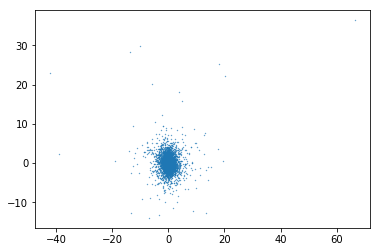

In [30]:
plt.scatter(principalDf["1st principal component"],principalDf["2nd principal component"], s= 0.1)

In [31]:
from sklearn.cluster import KMeans

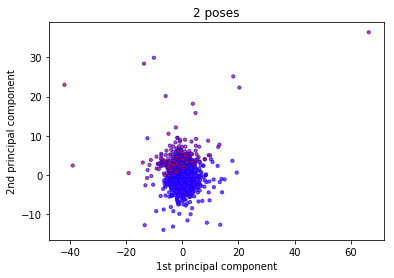

In [41]:
km = KMeans(init='k-means++', n_clusters=2)
km_clustering = km.fit(principalDf)
plt.scatter(x = principalDf["1st principal component"], y = principalDf["2nd principal component"],s=10, c=km_clustering.labels_, cmap='rainbow', alpha=0.7, edgecolors='b')
plt.title("2 poses")
plt.xlabel("1st principal component")
plt.ylabel("2nd principal component")
#plt.show()
plt.savefig('../Results/2pose_c.png')


In [33]:
pose2 = km_clustering.labels_

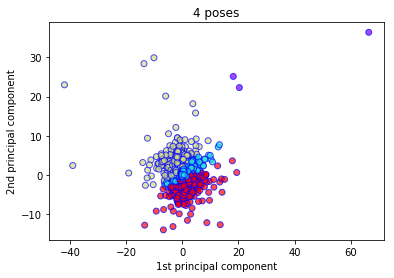

In [34]:
km = KMeans(init='k-means++', n_clusters=4)
km_clustering = km.fit(principalDf)
plt.scatter(principalDf["1st principal component"], principalDf["2nd principal component"], c=km_clustering.labels_, cmap='rainbow', alpha=0.7, edgecolors='b')
plt.title("4 poses")
plt.xlabel("1st principal component")
plt.ylabel("2nd principal component")
#plt.show()
plt.savefig('../Results/4pose_c.png')

In [35]:
pose4 = km_clustering.labels_

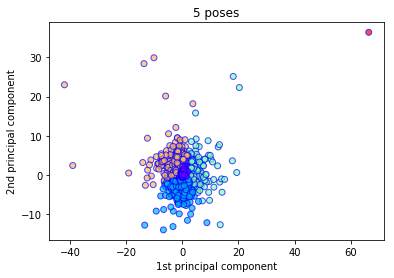

In [36]:
km = KMeans(init='k-means++', n_clusters=5)
km_clustering = km.fit(principalDf)
plt.scatter(principalDf["1st principal component"], principalDf["2nd principal component"], c=km_clustering.labels_, cmap='rainbow', alpha=0.7, edgecolors='b')
plt.title("5 poses")
plt.xlabel("1st principal component")
plt.ylabel("2nd principal component")
#plt.show()
plt.savefig('../Results/5pose_c.png')

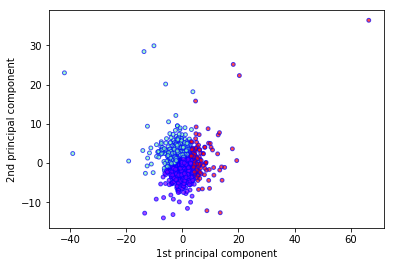

In [53]:
km = KMeans(init='k-means++', n_clusters=3)
km_clustering = km.fit(principalDf)
plt.scatter(principalDf["1st principal component"], principalDf["2nd principal component"],s =15, c=km_clustering.labels_, cmap='rainbow', alpha=0.7, edgecolors='b')
#plt.title("5 poses")
plt.xlabel("1st principal component")
plt.ylabel("2nd principal component")
#plt.show()
plt.savefig('../Results/3pose_c.png')

In [95]:
#np.ukm_clustering.labels_)
#principalDf
#temp_d.insert(0, "Cluster", km_clustering.labels_)
temp_d
temp_d.to_csv("../Results/knn_re.csv", index = False)

In [38]:
#principalDf.insert(2, "pose_2", pose2)
#principalDf.insert(3, "pose_4", pose4)
#principalDf.insert(4, "pose_5", pose5)
#principalDf.insert(5, "SourceFile", temp_d["SourceFile"])

In [39]:
principalDf

,1st principal component,2nd principal component,pose_2,pose_4,pose_5,SourceFile
0,-0.118079,-0.250723,0,0,0,115_11_20_7_18_BTCF/IMG_3832.JPG
1,-0.102294,0.238089,0,0,0,87_HH_22_06_18/DCIM/100_BTCF/IMG_5793.JPG
2,0.028881,0.613396,0,0,0,96_HH_23_5_18/IMG_3445.JPG
3,0.026349,0.006822,0,0,0,96_HH_15_06_18/100RECNX/IMG_6531.JPG
4,0.035852,-0.228218,0,0,0,96_HH_15_06_18/100RECNX/IMG_6531.JPG
...,...,...,...,...,...,...
17095,-0.133038,0.196992,0,0,0,5_HH_23_4_18_DCIM/100RECNX/IMG_0131.JPG
17096,-0.071181,-0.064194,0,0,0,17_HH_26_4_18/DCIM/100RECNX/IMG_2611.JPG
17097,-0.129889,-1.151133,0,0,0,48_HH_26_4_18_DDCIM/100_BTCF/IMG_0145.JPG
17098,0.071868,-0.141302,0,0,0,35_HH_1_6_18/100_BTCF/IMG_3683.JPG


In [48]:
#principalDf.loc[principalDf["pose"] == 0]

In [50]:
#temp_d

In [ ]:
#C1 = pd.read_csv("../Data/C1.csv")
#C2 = pd.read_csv("../Data/C2.csv")
#C1.SourceFile = C1.SourceFile.str.replace("/", "+")
#C2.SourceFile = C2.SourceFile.str.replace("/", "+")
#C1.to_csv("../Data/C1.csv", index = False)
#C2.to_csv("../Data/C2.csv", index = False)

In [46]:
from sklearn.metrics import silhouette_score

In [44]:
principalDf

,1st principal component,2nd principal component
0,-0.334479,-0.524728
1,0.103456,-0.034022
2,-0.236090,0.325821
3,0.037964,-0.410878
4,0.038843,-0.357732
...,...,...
20828,0.017914,0.037675
20829,-0.056838,-0.329092
20830,-0.055325,-0.284238
20831,-0.100705,0.160569


In [47]:
for n_clusters in [2,3,4,5, 6]:
    clusterer = KMeans(n_clusters=n_clusters)
    preds = clusterer.fit_predict(principalDf)
    centers = clusterer.cluster_centers_

    score = silhouette_score(principalDf, preds)
    print("For n_clusters = {}, silhouette score is {})".format(n_clusters, score))

For n_clusters = 2, silhouette score is 0.629424049917962)
For n_clusters = 3, silhouette score is 0.644113648592439)
For n_clusters = 4, silhouette score is 0.5968674304095245)
For n_clusters = 5, silhouette score is 0.5991134501406604)
For n_clusters = 6, silhouette score is 0.5860438282644055)


In [107]:
temp_d.loc[temp_d['Cluster'] ==  0, "SourceFile"]

0                      115_11_20_7_18_BTCF/IMG_3832.JPG
1                  96_HH_15_06_18/100RECNX/IMG_6531.JPG
2                  96_HH_15_06_18/100RECNX/IMG_6531.JPG
3                  96_HH_15_06_18/100RECNX/IMG_6531.JPG
4            149_HH_05_06_18/DCIM/100_BTCF/IMG_4348.JPG
                              ...                      
20828    142_HH_16_5_18_onsdcard/100RECNX/IMG_0485.JPG
20829           5_HH_23_4_18_DCIM/100RECNX/IMG_0131.JPG
20830          17_HH_26_4_18/DCIM/100RECNX/IMG_2611.JPG
20831                35_HH_1_6_18/100_BTCF/IMG_3683.JPG
20832              97_HH_15_06_18/101RECNX/IMG_2502.JPG
Name: SourceFile, Length: 19338, dtype: object

In [112]:
temp_d.loc[temp_d['Cluster'] ==  1, "SourceFile"]

9             97_HH_15_06_18/101RECNX/IMG_6782.JPG
15              34_HH_1_6_18/100_BTCF/IMG_2507.JPG
52            98_HH_15_06_18/100RECNX/IMG_3370.JPG
57            96_HH_15_06_18/100RECNX/IMG_5531.JPG
59       87_HH_22_06_18/DCIM/100_BTCF/IMG_2731.JPG
                           ...                    
20708                134_HH_10_5_18_T/IMG_0071.JPG
20757    48_HH_26_4_18_DDCIM/100_BTCF/IMG_0190.JPG
20777     46_HH_26_4_18/DCIM/100_BTCF/IMG_0536.JPG
20785    87_HH_22_06_18/DCIM/100_BTCF/IMG_4020.JPG
20817          97_HH_19_5_18/100_BTCF/IMG_3348.JPG
Name: SourceFile, Length: 1360, dtype: object

In [113]:
temp_d.loc[temp_d['Cluster'] ==  2, "SourceFile"]

192              35_HH_1_6_18/100_BTCF/IMG_3230.JPG
307            97_HH_15_06_18/101RECNX/IMG_6462.JPG
613       87_HH_22_06_18/DCIM/100_BTCF/IMG_4745.JPG
829           109_HH_1_6_18_T/100_BTCF/IMG_0421.JPG
1369     149_HH_05_06_18/DCIM/100_BTCF/IMG_3084.JPG
                            ...                    
20535      24_HH_23_4_18_DCIM/100_BTCF/IMG_1783.JPG
20544        6_HH_1_5_18_DCIM/100RECNX/IMG_2739.JPG
20559    149_HH_05_06_18/DCIM/100_BTCF/IMG_4114.JPG
20655      23_HH_23_4_18_DCIM/100_BTCF/IMG_0190.JPG
20680          97_HH_15_06_18/101RECNX/IMG_2992.JPG
Name: SourceFile, Length: 135, dtype: object

In [ ]:
temp.getAllSke